Notebook to make final figures.

The prediction will be made for all models only for 2023 onwards for easier comparison and the Confusion Matrix will not be normalized, it will be left normal. The models of v5 that consider M.l of 1.5 and predict Ml >= 4.0 are discarded, so only 28 models that do predict something will be taken.

The models are:
```python
# Lista de modelos a considerar
modelos = [
    'SD30_ses_a_hl_5_5_1_scr0.816',
    'SD30_ses_ae_hl_2000_5_5_scr0.993',
    'SD30_ses_ae_hl_1500_5_0_scr1.0',
    'SD30_ses_ad_hl_210_5_4_scr1.0',
    'SD30_ses_ab_hl_210_5_0_scr1.0',
    'SD30_ses_ad_hl_420_5_2_scr1.0',
    'SD30_ses_aa_hl_210_5_0_scr1.0',
    'SD30_ses_a_hl_210_5_0_scr1.0',
    'SD30_ses_ac_hl_210_5_0_scr1.0',
    '6meses__hl_2000_5_int0_scr0.999',
    '6meses__hl_420_5_int0_scr0.987',
    '6meses__hl_210_5_int0_scr1.0',
    '6meses__hl_210_5_int1_scr0.996',
    '12meses__hl_1500_5_int2_scr0.996',
    '12meses__hl_210_5_int1_scr0.996',
    '12meses__hl_210_5_int0_scr0.999',
    '12meses__hl_420_5_int2_scr0.957',
    '2009_6meses_hl_1500_5_int1_scr1.0',
    '2009_6meses_hl_210_5_int0_scr1.0',
    '2009_30dias_hl_1500_5_int0_scr1.0',
    '2009_6meses_hl_420_5_int0_scr1.0',
    '2009_30dias_hl_2000_5_int1_scr1.0',
    '2009_12meses_hl_420_5_int0_scr1.0',
    '2009_30dias_hl_420_5_int0_scr0.998',
    '2009_12meses_hl_1500_5_int1_scr0.995',
    '2009_30dias_hl_210_5_int0_scr1.0',
    '2009_12meses_hl_2000_5_int0_scr0.987',
    '2009_12meses_hl_210_5_int0_scr1.0']
```


# Start

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install shapely

In [ ]:
!pip3 install contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 41.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import contextily as cx #para el basemap en geopandas
import xyzservices.providers as xyz #para escoger el basemap
import geopandas as gpd
import shapely as shp

from collections import Counter
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay # Para evaluar el modelo
from sklearn.neural_network import MLPClassifier # Para la Red Neuronal
from joblib import dump, load # guardar el modelo
from datetime import datetime, timedelta
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression # Para generar el Modelo de Reg. Lineal
from matplotlib.patches import Rectangle # Para hacer los rectangulos
from matplotlib.collections import PatchCollection # Tambien para los rectangulos
from shapely.geometry import Point
from shapely import points
from shapely.affinity import scale
import matplotlib.colors as colors
from sklearn.metrics import RocCurveDisplay, roc_curve
from sklearn.metrics import roc_auc_score

In [ ]:
pathDatos = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Catalogos/'
pathSaveFiguras = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/FigurasV6/'

In [ ]:
# Se carga el catalogo de los eventos de prof mayores a 100 km
df = pd.read_csv(pathDatos+'df_Total_1994_2024.csv')
df['Date-Time'] = pd.to_datetime(df['Date-Time'], yearfirst=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148986 entries, 0 to 148985
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   FECHA                   148986 non-null  object        
 1   HORA_UTC                148986 non-null  object        
 2   LATITUD (grados)        148986 non-null  float64       
 3   LONGITUD (grados)       148986 non-null  float64       
 4   PROFUNDIDAD (Km)        148986 non-null  float64       
 5   MAGNITUD Ml             148986 non-null  float64       
 6   ERROR LATITUD (Km)      148910 non-null  float64       
 7   ERROR LONGITUD (Km)     148910 non-null  float64       
 8   ERROR PROFUNDIDAD (Km)  148910 non-null  float64       
 9   Date-Time               148986 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(7), object(2)
memory usage: 11.4+ MB


In [ ]:
np.round(df.describe(), 2)

,LATITUD (grados),LONGITUD (grados),PROFUNDIDAD (Km),MAGNITUD Ml,ERROR LATITUD (Km),ERROR LONGITUD (Km),ERROR PROFUNDIDAD (Km),Date-Time
count,148986.00,148986.00,148986.00,148986.00,148910.00,148910.00,148910.00,148986
mean,6.80,-73.13,143.26,2.05,4.63,6.88,7.08,2014-04-05 20:58:52.822003200
min,6.50,-73.40,-4.88,0.10,0.00,0.00,0.00,1994-01-01 00:06:37
25%,6.77,-73.17,140.00,1.60,2.62,3.10,4.20,2009-12-21 02:16:42.500000
50%,6.80,-73.14,144.60,1.90,4.10,5.17,6.50,2016-01-08 00:29:42.500000
75%,6.82,-73.10,148.50,2.40,5.80,8.70,8.85,2020-05-23 18:21:52.500000
max,7.10,-72.80,436.50,6.30,99.90,99.90,99.90,2024-02-29 23:17:12
std,0.05,0.08,12.08,0.62,3.25,6.16,4.97,NaN


# General Map

## The entire catalog

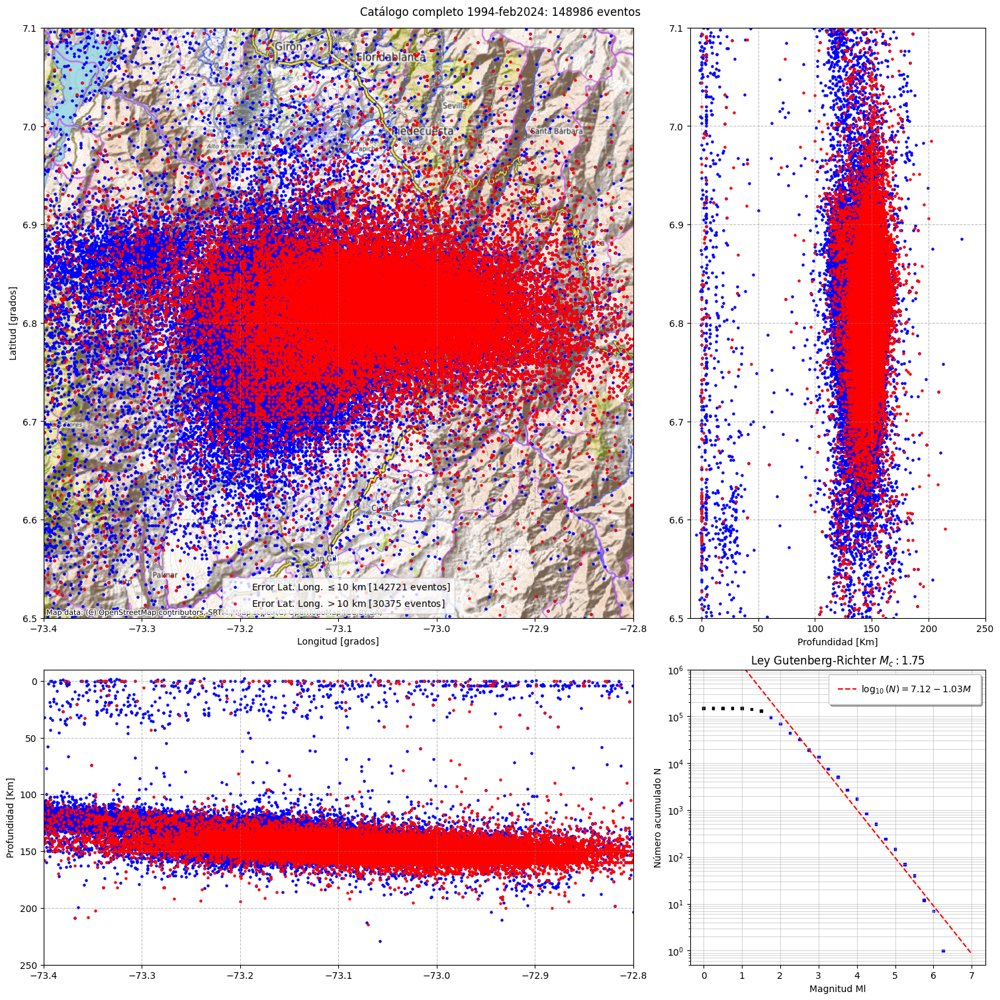

In [ ]:
# Todo el catalogo
fig = plt.figure(figsize=(15,15), constrained_layout=True)
gs = fig.add_gridspec(3,3)

ax1 = fig.add_subplot(gs[0:2, 0:2])
ax2 = fig.add_subplot(gs[0:2, 2])
ax3 = fig.add_subplot(gs[2, 0:2])
ax4 = fig.add_subplot(gs[2, 2])

nE = len(df)
filtro_error_mayor_10km = (df['ERROR LATITUD (Km)'] > 10) | (df['ERROR LONGITUD (Km)'] > 10)
filtro_error_menor_10km = (df['ERROR LATITUD (Km)'] <= 10) | (df['ERROR LONGITUD (Km)'] <= 10)

##### ax1
ax1.scatter(df['LONGITUD (grados)'][filtro_error_menor_10km],
            df['LATITUD (grados)'][filtro_error_menor_10km],
            s= 5, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
ax1.scatter(df['LONGITUD (grados)'][filtro_error_mayor_10km],
            df['LATITUD (grados)'][filtro_error_mayor_10km],
            s= 5, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))

ax1.set_xlabel('Longitud [grados]')
ax1.set_ylabel('Latitud [grados]')

ax1.set_ylim(6.5, 7.1)
ax1.set_xlim(-73.4, -72.8)
ax1.legend(loc=8)
#ax.axis('equal')

cx.add_basemap(ax=ax1,
                crs='epsg:4326', # el sistema de coordenadas
                source=xyz.OpenTopoMap,
                reset_extent=True) # Para incluir un mapa base

ax1.grid(color='grey', ls='--', alpha=0.5)

##### ax2
ax2.scatter(df['PROFUNDIDAD (Km)'][filtro_error_menor_10km],
            df['LATITUD (grados)'][filtro_error_menor_10km],
            s= 5, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
ax2.scatter(df['PROFUNDIDAD (Km)'][filtro_error_mayor_10km],
            df['LATITUD (grados)'][filtro_error_mayor_10km],
            s= 5, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
ax2.set_ylim(6.5, 7.1)
ax2.set_xlim(-10, 250)
ax2.grid(color='grey', ls='--', alpha=0.5)
ax2.set_xlabel('Profundidad [Km]')

##### ax3
ax3.scatter(df['LONGITUD (grados)'][filtro_error_menor_10km],
            df['PROFUNDIDAD (Km)'][filtro_error_menor_10km],
            s= 5, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
ax3.scatter(df['LONGITUD (grados)'][filtro_error_mayor_10km],
            df['PROFUNDIDAD (Km)'][filtro_error_mayor_10km],
            s= 5, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
ax3.set_ylim(-10, 250)
ax3.set_xlim(-73.4, -72.8)
ax3.grid(color='grey', ls='--', alpha=0.5)
ax3.invert_yaxis()
ax3.set_ylabel('Profundidad [Km]')

##### ax4

N_values = np.array([])
magnitudes = np.arange(0.0, 6.5, 0.25)
for i in magnitudes:
  sumar_cantidad = (df['MAGNITUD Ml'] >= i).sum()
  if sumar_cantidad == 0:
    N_values = np.append(N_values, -1)
  else:
    N_values = np.append(N_values, sumar_cantidad)
#Mc = 2.5
#Mc = magnitudes[1:][(N_values[1:] - N_values[:-1]) / ((magnitudes[1:] - magnitudes[:-1])) <= -800][0] + 0.25
# Para calcular la magnitud de completitud del catalogo se va a calcular
# la pendiente de  i+1 contra i, luego se recupera todas las pendiente
# <= a -0.1 y se filtra para saber cual magnitud corresponde y se le suma +0.25
Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
filtroMc = (magnitudes >= Mc) & (N_values != -1)
x_regLin = np.array(magnitudes[filtroMc])
x_regLin = np.reshape(x_regLin, (-1,1))
y_regLin = np.log10(N_values[filtroMc])
modeloRL = LinearRegression() # Creamos el modelo
modeloRL.fit(x_regLin, y_regLin) # Entrenamos el modelo
puntaje_modeloRL = modeloRL.score(x_regLin, y_regLin) # Calculamos su puntaje
b_value = -1*np.round(modeloRL.coef_[0], 2) # Este es el coeficiente o la pendiente m
a_value = np.round(modeloRL.intercept_, 2) # Este es el intercepto o punto de corte b
# Graficar el resultado de la ley GR
clr_ley= []
for i in magnitudes:
  if i < Mc:
    clr_ley.append('k')
  else:
    clr_ley.append('b')

ax4.scatter(magnitudes, N_values, c=clr_ley, s=7, marker='s')
ax4.plot(np.array([[0],[7]]), 10**modeloRL.predict(np.array([[0],[7]])),
          color='red',
          ls='--',
          label= '$\log_{10}$'+'$(N)={}-{}M$'.format(a_value, b_value) )


ax4.set_yscale('log')
ax4.set_ylim(0.5, 10**6)
ax4.set_xlabel('Magnitud Ml')
ax4.set_ylabel('Número acumulado N')
ax4.legend(loc='upper right', fancybox=True, framealpha=1, shadow=True, borderpad=1 ,handletextpad= 0.5)
ax4.grid(True, which='both', linewidth=0.4)
ax4.set_title(f'Ley Gutenberg-Richter $M_c:{Mc}$')


plt.suptitle(f'Catálogo completo 1994-feb2024: {nE} eventos')

plt.savefig((pathSaveFiguras + f'mapa_CatalogoCompleto.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

plt.show()
print('\n')

## Depth >= 100 km

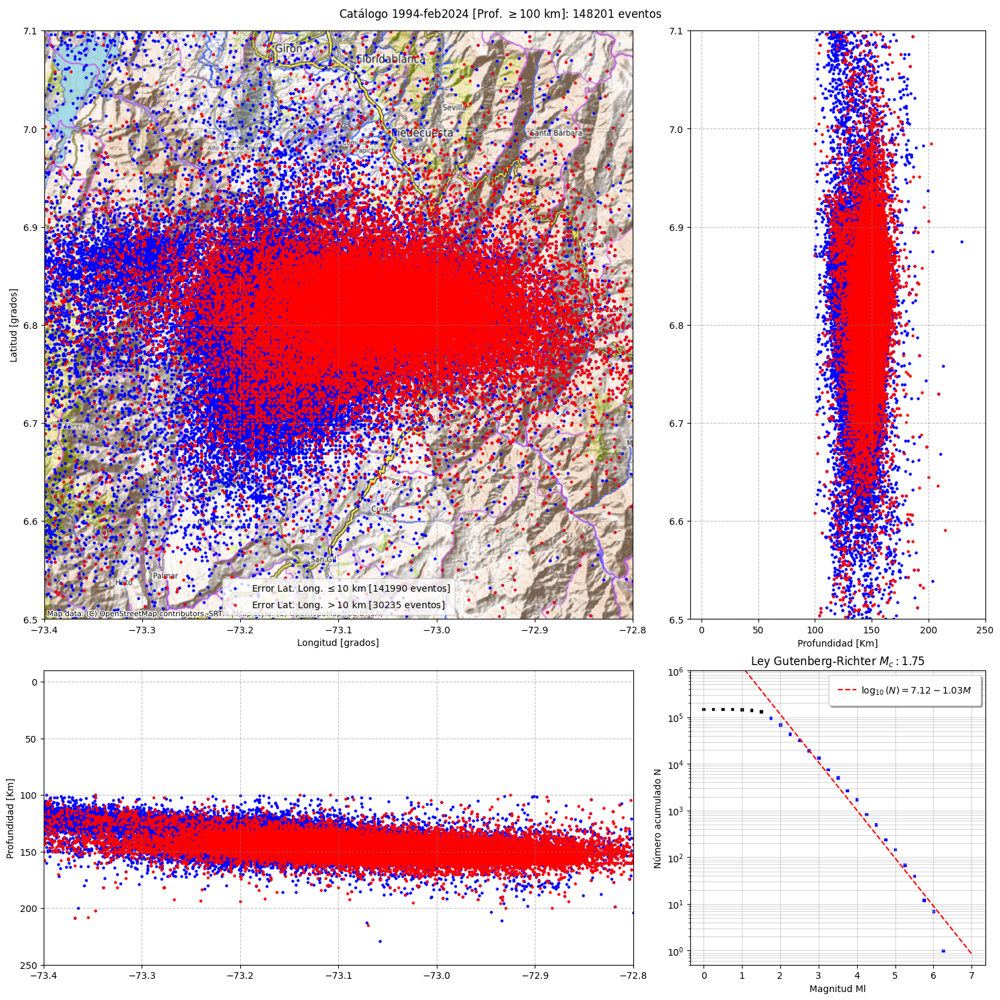

In [ ]:
# solo mayor a 100 km
df = df[df['PROFUNDIDAD (Km)'] >= 100]

fig = plt.figure(figsize=(15,15), constrained_layout=True)
gs = fig.add_gridspec(3,3)

ax1 = fig.add_subplot(gs[0:2, 0:2])
ax2 = fig.add_subplot(gs[0:2, 2])
ax3 = fig.add_subplot(gs[2, 0:2])
ax4 = fig.add_subplot(gs[2, 2])

nE = len(df)
filtro_error_mayor_10km = (df['ERROR LATITUD (Km)'] > 10) | (df['ERROR LONGITUD (Km)'] > 10)
filtro_error_menor_10km = (df['ERROR LATITUD (Km)'] <= 10) | (df['ERROR LONGITUD (Km)'] <= 10)

##### ax1
ax1.scatter(df['LONGITUD (grados)'][filtro_error_menor_10km],
            df['LATITUD (grados)'][filtro_error_menor_10km],
            s= 5, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
ax1.scatter(df['LONGITUD (grados)'][filtro_error_mayor_10km],
            df['LATITUD (grados)'][filtro_error_mayor_10km],
            s= 5, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))

ax1.set_xlabel('Longitud [grados]')
ax1.set_ylabel('Latitud [grados]')

ax1.set_ylim(6.5, 7.1)
ax1.set_xlim(-73.4, -72.8)
ax1.legend(loc=8)
#ax.axis('equal')

cx.add_basemap(ax=ax1,
                crs='epsg:4326', # el sistema de coordenadas
                source=xyz.OpenTopoMap,
                reset_extent=True) # Para incluir un mapa base

ax1.grid(color='grey', ls='--', alpha=0.5)

##### ax2
ax2.scatter(df['PROFUNDIDAD (Km)'][filtro_error_menor_10km],
            df['LATITUD (grados)'][filtro_error_menor_10km],
            s= 5, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
ax2.scatter(df['PROFUNDIDAD (Km)'][filtro_error_mayor_10km],
            df['LATITUD (grados)'][filtro_error_mayor_10km],
            s= 5, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
ax2.set_ylim(6.5, 7.1)
ax2.set_xlim(-10, 250)
ax2.grid(color='grey', ls='--', alpha=0.5)
ax2.set_xlabel('Profundidad [Km]')

##### ax3
ax3.scatter(df['LONGITUD (grados)'][filtro_error_menor_10km],
            df['PROFUNDIDAD (Km)'][filtro_error_menor_10km],
            s= 5, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
ax3.scatter(df['LONGITUD (grados)'][filtro_error_mayor_10km],
            df['PROFUNDIDAD (Km)'][filtro_error_mayor_10km],
            s= 5, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
ax3.set_ylim(-10, 250)
ax3.set_xlim(-73.4, -72.8)
ax3.grid(color='grey', ls='--', alpha=0.5)
ax3.invert_yaxis()
ax3.set_ylabel('Profundidad [Km]')

##### ax4

N_values = np.array([])
magnitudes = np.arange(0.0, 6.5, 0.25)
for i in magnitudes:
  sumar_cantidad = (df['MAGNITUD Ml'] >= i).sum()
  if sumar_cantidad == 0:
    N_values = np.append(N_values, -1)
  else:
    N_values = np.append(N_values, sumar_cantidad)
#Mc = 2.5
#Mc = magnitudes[1:][(N_values[1:] - N_values[:-1]) / ((magnitudes[1:] - magnitudes[:-1])) <= -800][0] + 0.25
# Para calcular la magnitud de completitud del catalogo se va a calcular
# la pendiente de  i+1 contra i, luego se recupera todas las pendiente
# <= a -0.1 y se filtra para saber cual magnitud corresponde y se le suma +0.25
Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
filtroMc = (magnitudes >= Mc) & (N_values != -1)
x_regLin = np.array(magnitudes[filtroMc])
x_regLin = np.reshape(x_regLin, (-1,1))
y_regLin = np.log10(N_values[filtroMc])
modeloRL = LinearRegression() # Creamos el modelo
modeloRL.fit(x_regLin, y_regLin) # Entrenamos el modelo
puntaje_modeloRL = modeloRL.score(x_regLin, y_regLin) # Calculamos su puntaje
b_value = -1*np.round(modeloRL.coef_[0], 2) # Este es el coeficiente o la pendiente m
a_value = np.round(modeloRL.intercept_, 2) # Este es el intercepto o punto de corte b
# Graficar el resultado de la ley GR
clr_ley= []
for i in magnitudes:
  if i < Mc:
    clr_ley.append('k')
  else:
    clr_ley.append('b')

ax4.scatter(magnitudes, N_values, c=clr_ley, s=7, marker='s')
ax4.plot(np.array([[0],[7]]), 10**modeloRL.predict(np.array([[0],[7]])),
          color='red',
          ls='--',
          label= '$\log_{10}$'+'$(N)={}-{}M$'.format(a_value, b_value) )


ax4.set_yscale('log')
ax4.set_ylim(0.5, 10**6)
ax4.set_xlabel('Magnitud Ml')
ax4.set_ylabel('Número acumulado N')
ax4.legend(loc='upper right', fancybox=True, framealpha=1, shadow=True, borderpad=1 ,handletextpad= 0.5)
ax4.grid(True, which='both', linewidth=0.4)
ax4.set_title(f'Ley Gutenberg-Richter $M_c:{Mc}$')


plt.suptitle(f'Catálogo 1994-feb2024 [Prof. $\geq 100$ km]: {nE} eventos')

plt.savefig((pathSaveFiguras + f'mapa_Catalogo_100km.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

plt.show()
print('\n')

# From 2023

The Df of the probability of each model will be generated in order to make the graph of the occurrence of all the events, as well as the confusion matrices.

In [ ]:
# DataFrame por dias
df_Dias = pd.read_csv(pathDatos+'df_Dias_1994_2024.csv')
df_Dias['Fecha'] = pd.to_datetime(df_Dias['Dia'], yearfirst=True)
df_Dias

,Dia,2.5-3.0,3.0-3.5,3.5-4.0,4.0-4.5,4.5-5.0,5.0-5.5,5.5-,Total dia,Fecha
0,1994-01-01,0,0,1,1,0,0,0,2,1994-01-01
1,1994-01-02,1,4,0,0,0,1,0,6,1994-01-02
2,1994-01-03,0,1,0,1,0,0,0,2,1994-01-03
3,1994-01-04,0,3,1,0,0,0,0,4,1994-01-04
4,1994-01-05,2,2,1,0,1,0,0,6,1994-01-05
...,...,...,...,...,...,...,...,...,...,...
11012,2024-02-25,1,0,0,0,0,0,0,1,2024-02-25
11013,2024-02-26,6,1,0,0,0,0,0,7,2024-02-26
11014,2024-02-27,2,0,0,0,0,0,0,2,2024-02-27
11015,2024-02-28,4,0,0,0,0,0,0,4,2024-02-28


## V1

In [ ]:
pathModelos = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class/'
pathDatos = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Catalogos/'
pathSaveFiguras = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Figuras_MatrizConfusion/'

modelosV1 = [
  'SD30_ses_a_hl_5_5_1_scr0.816.joblib',
  'SD30_ses_ae_hl_2000_5_5_scr0.993.joblib',
  'SD30_ses_ae_hl_1500_5_0_scr1.0.joblib',
  'SD30_ses_ad_hl_210_5_4_scr1.0.joblib',
  'SD30_ses_ab_hl_210_5_0_scr1.0.joblib',
  'SD30_ses_ad_hl_420_5_2_scr1.0.joblib',
  'SD30_ses_aa_hl_210_5_0_scr1.0.joblib',
  'SD30_ses_a_hl_210_5_0_scr1.0.joblib',
  'SD30_ses_ac_hl_210_5_0_scr1.0.joblib',
  ]

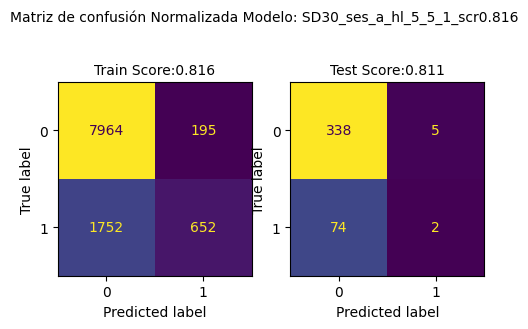

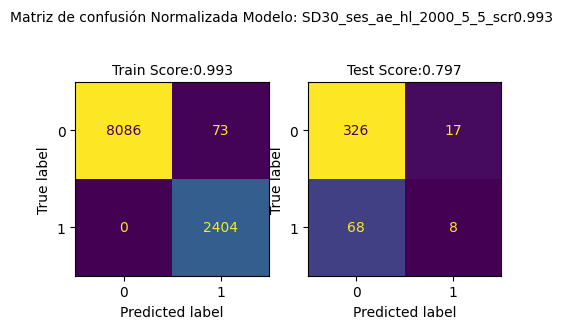

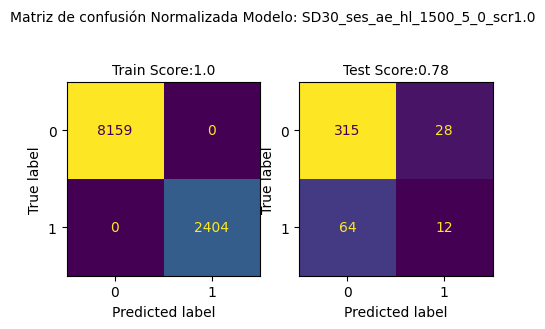

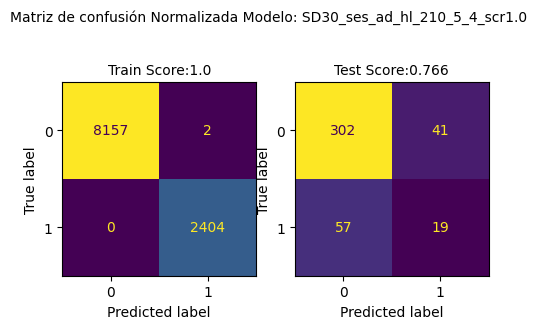

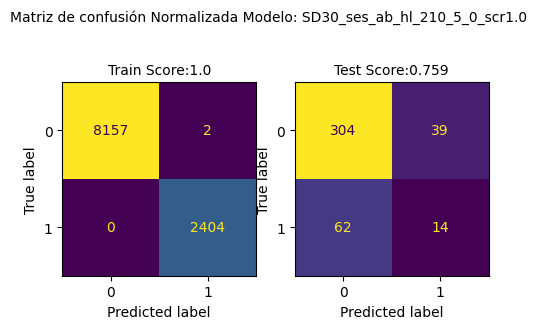

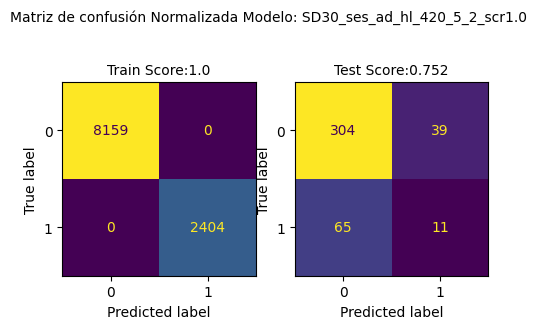

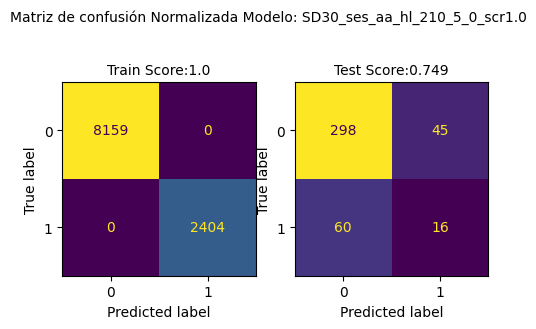

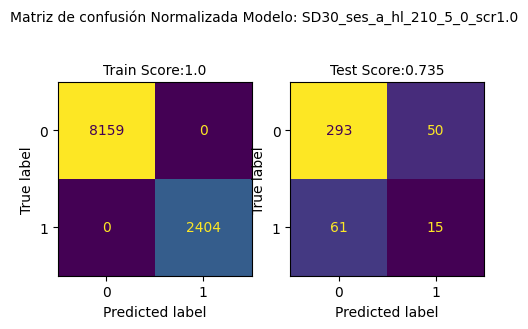

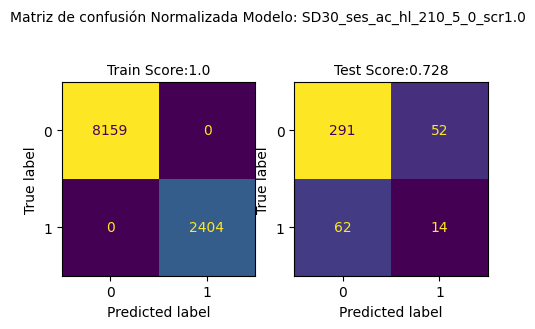

In [ ]:
dictPuntajes = {'Modelo':[],
                'V':[],
                'Train_Score':[],
                'Train_TN':[],
                'Train_FP':[],
                'Train_FN':[],
                'Train_TP':[],
                'Test_Score':[],
                'Test_TN':[],
                'Test_FP':[],
                'Test_FN':[],
                'Test_TP':[]}

dictProba2023 = {}

for modelo in modelosV1:
  if 'joblib' in modelo:
    if 'D30' in modelo:
      dias_Considerar = 30
      if 'SD' in modelo:
        Xtest = np.loadtxt(pathDatos+'SD30_X2024.txt')
        ytest = np.loadtxt(pathDatos+'SD30_y2024.txt')
        Xtrain = np.loadtxt(pathDatos+'SD30_X2022.txt')
        ytrain= np.loadtxt(pathDatos+'SD30_y2022.txt')


    nMin = dias_Considerar - 1
    modelo_P = load(pathModelos+modelo)
    arrayTime_Y = np.arange('2023-01-01', '2024-03-01', dtype='datetime64[D]')
    filtro2023 = (arrayTime_Y >= np.array(['2023'], dtype='datetime64[D]'))[:-6] # no considerar los ultimos 7 días

    # Train
    predichosModelo_Train = modelo_P.predict(Xtrain)
    scoreTrain = np.round(modelo_P.score(Xtrain, ytrain), 3)
    tn_Train, fp_Train, fn_Train, tp_Train = confusion_matrix(ytrain, predichosModelo_Train).ravel()

    # Test solo 2023
    Xtest = Xtest[filtro2023]
    ytest = ytest[filtro2023]
    predichosModelo_Test = modelo_P.predict(Xtest)
    predichosProbModelo_Test = modelo_P.predict_proba(Xtest)[:,1]
    dictProba2023[modelo[:-7]] = predichosProbModelo_Test # Probabilidades 2023
    accuracyScore_Test = np.round(accuracy_score(ytest, predichosModelo_Test),3)
    tn_Test, fp_Test, fn_Test, tp_Test = confusion_matrix(ytest, predichosModelo_Test).ravel()


    # Incluir en la lista
    dictPuntajes['Modelo'].append(modelo[:-7])
    dictPuntajes['V'].append('v1')
    dictPuntajes['Train_Score'].append(scoreTrain)
    dictPuntajes['Train_TN'].append(tn_Train)
    dictPuntajes['Train_FP'].append(fp_Train)
    dictPuntajes['Train_FN'].append(fn_Train)
    dictPuntajes['Train_TP'].append(tp_Train)
    dictPuntajes['Test_Score'].append(accuracyScore_Test)
    dictPuntajes['Test_TN'].append(tn_Test)
    dictPuntajes['Test_FP'].append(fp_Test)
    dictPuntajes['Test_FN'].append(fn_Test)
    dictPuntajes['Test_TP'].append(tp_Test)

    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(5.5,3.5))
    #Train

    ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(ytrain, predichosModelo_Train),
                           display_labels=modelo_P.classes_,
                           ).plot(ax=axs[0], colorbar=False)
    axs[0].set_title(f'Train Score:{scoreTrain}', fontsize=10)

    #Test
    ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(ytest, predichosModelo_Test),
                        display_labels=modelo_P.classes_,
                        ).plot(ax=axs[1], colorbar=False)
    axs[1].set_title(f'Test Score:{accuracyScore_Test}', fontsize=10)

    plt.suptitle(f'Matriz de confusión Normalizada Modelo: {modelo[:-7]}', fontsize=10)

    #plt.savefig((pathSaveFiguras + f'v1_{modelo[:-7]}.png'),
    #        format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

    plt.show()
    print('\n')


df_V1 = pd.DataFrame.from_dict(dictPuntajes)
df_prob = pd.DataFrame.from_dict(dictProba2023)
#df

In [ ]:
ytest.sum()# predice en los proximos 6 días

76.0

In [ ]:
df_V1.to_csv(pathDatos+'df_ConfMatrix_v2_V1.csv', index=False)
df_V1 = pd.read_csv(pathDatos+'df_ConfMatrix_v2_V1.csv')

df_V1

,Modelo,V,Train_Score,Train_TN,Train_FP,Train_FN,Train_TP,Test_Score,Test_TN,Test_FP,Test_FN,Test_TP
0,SD30_ses_a_hl_5_5_1_scr0.816,v1,0.816,7964,195,1752,652,0.811,338,5,74,2
1,SD30_ses_ae_hl_2000_5_5_scr0.993,v1,0.993,8086,73,0,2404,0.797,326,17,68,8
2,SD30_ses_ae_hl_1500_5_0_scr1.0,v1,1.000,8159,0,0,2404,0.780,315,28,64,12
3,SD30_ses_ad_hl_210_5_4_scr1.0,v1,1.000,8157,2,0,2404,0.766,302,41,57,19
4,SD30_ses_ab_hl_210_5_0_scr1.0,v1,1.000,8157,2,0,2404,0.759,304,39,62,14
5,SD30_ses_ad_hl_420_5_2_scr1.0,v1,1.000,8159,0,0,2404,0.752,304,39,65,11
6,SD30_ses_aa_hl_210_5_0_scr1.0,v1,1.000,8159,0,0,2404,0.749,298,45,60,16
7,SD30_ses_a_hl_210_5_0_scr1.0,v1,1.000,8159,0,0,2404,0.735,293,50,61,15
8,SD30_ses_ac_hl_210_5_0_scr1.0,v1,1.000,8159,0,0,2404,0.728,291,52,62,14


In [ ]:
df_prob.index = arrayTime_Y[arrayTime_Y >= np.array(['2023'], dtype='datetime64[D]')][:-6]
df_prob.to_csv(pathDatos+'df_Probabilidad_v2_V1.csv')
df_prob = pd.read_csv(pathDatos+'df_Probabilidad_v2_V1.csv')

df_prob

,Unnamed: 0,SD30_ses_a_hl_5_5_1_scr0.816,SD30_ses_ae_hl_2000_5_5_scr0.993,SD30_ses_ae_hl_1500_5_0_scr1.0,SD30_ses_ad_hl_210_5_4_scr1.0,SD30_ses_ab_hl_210_5_0_scr1.0,SD30_ses_ad_hl_420_5_2_scr1.0,SD30_ses_aa_hl_210_5_0_scr1.0,SD30_ses_a_hl_210_5_0_scr1.0,SD30_ses_ac_hl_210_5_0_scr1.0
0,2023-01-01,0.088836,7.146377e-01,2.070931e-01,5.992044e-01,9.471241e-01,2.001586e-01,3.521941e-03,7.348634e-01,9.160763e-01
1,2023-01-02,0.136922,1.841301e-02,2.193087e-02,2.414906e-05,7.228520e-02,2.748519e-02,6.707681e-05,8.024584e-05,7.090893e-02
2,2023-01-03,0.183501,3.709442e-02,4.364226e-02,5.310918e-01,2.112219e-05,8.260185e-02,8.504711e-01,2.315768e-04,9.258438e-01
3,2023-01-04,0.131997,9.246956e-03,3.671268e-05,2.494471e-04,5.879490e-05,2.845838e-03,4.912026e-04,3.881908e-05,4.093041e-03
4,2023-01-05,0.205043,1.082087e-02,6.351598e-03,3.867781e-01,7.147498e-03,4.906221e-02,2.220217e-05,1.318687e-03,3.248471e-03
...,...,...,...,...,...,...,...,...,...,...
414,2024-02-19,0.016284,5.628584e-07,8.740085e-10,7.565106e-09,3.110701e-16,1.977021e-07,2.269347e-09,1.372064e-10,1.952983e-06
415,2024-02-20,0.087500,9.654669e-05,8.992489e-07,9.373685e-07,4.948874e-08,1.291055e-05,1.376276e-09,1.781652e-11,1.267942e-07
416,2024-02-21,0.052413,1.225750e-04,9.291795e-07,2.921971e-06,1.385028e-08,4.856440e-06,3.991239e-07,1.915773e-06,5.508312e-06
417,2024-02-22,0.146943,3.097316e-03,3.432844e-05,1.361281e-03,3.599648e-01,6.430667e-04,4.766891e-10,2.497386e-05,2.427148e-04


In [ ]:
(df_prob.iloc[:,1:] > 0.5).sum(axis=0)

SD30_ses_a_hl_5_5_1_scr0.816         7
SD30_ses_ae_hl_2000_5_5_scr0.993    25
SD30_ses_ae_hl_1500_5_0_scr1.0      40
SD30_ses_ad_hl_210_5_4_scr1.0       60
SD30_ses_ab_hl_210_5_0_scr1.0       53
SD30_ses_ad_hl_420_5_2_scr1.0       50
SD30_ses_aa_hl_210_5_0_scr1.0       61
SD30_ses_a_hl_210_5_0_scr1.0        65
SD30_ses_ac_hl_210_5_0_scr1.0       66
dtype: int64

## V2

In [ ]:
pathModelos = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v2/'
pathDatos = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Catalogos/'
pathSaveFiguras = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Figuras_MatrizConfusion/'

modelosV2 = [
  '6meses__hl_2000_5_int0_scr0.999.joblib',
  '6meses__hl_420_5_int0_scr0.987.joblib',
  '6meses__hl_210_5_int0_scr1.0.joblib',
  '6meses__hl_210_5_int1_scr0.996.joblib',
  '12meses__hl_1500_5_int2_scr0.996.joblib',
  '12meses__hl_210_5_int1_scr0.996.joblib',
  '12meses__hl_210_5_int0_scr0.999.joblib',
  '12meses__hl_420_5_int2_scr0.957.joblib',
  ]

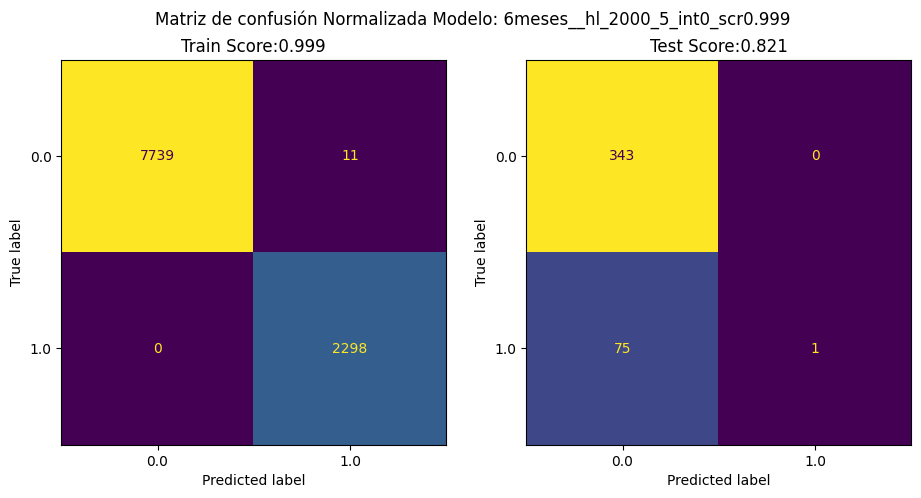

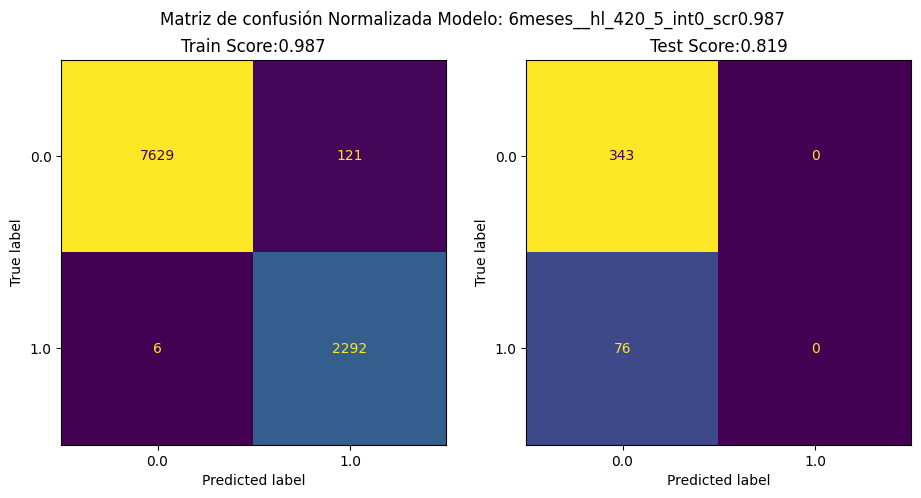

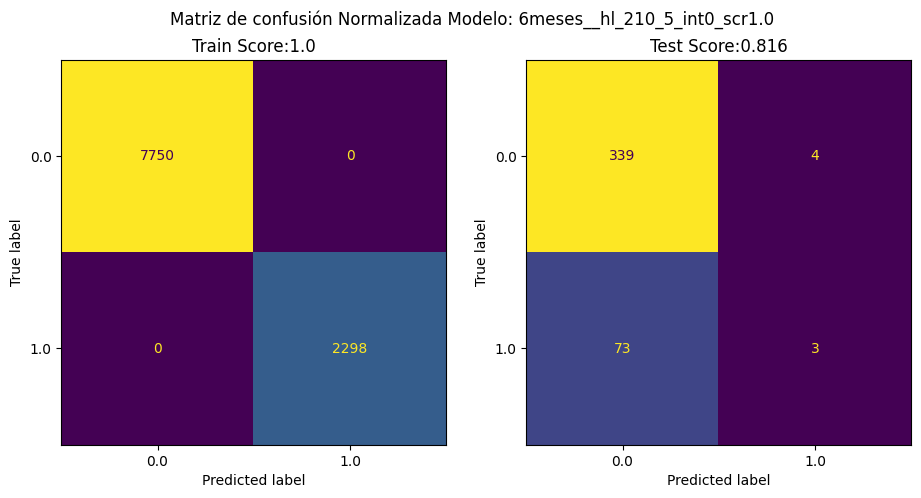

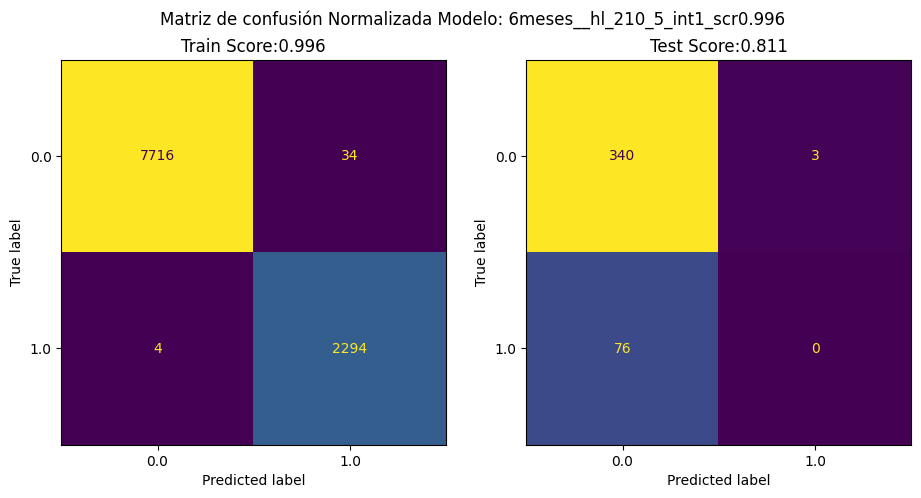

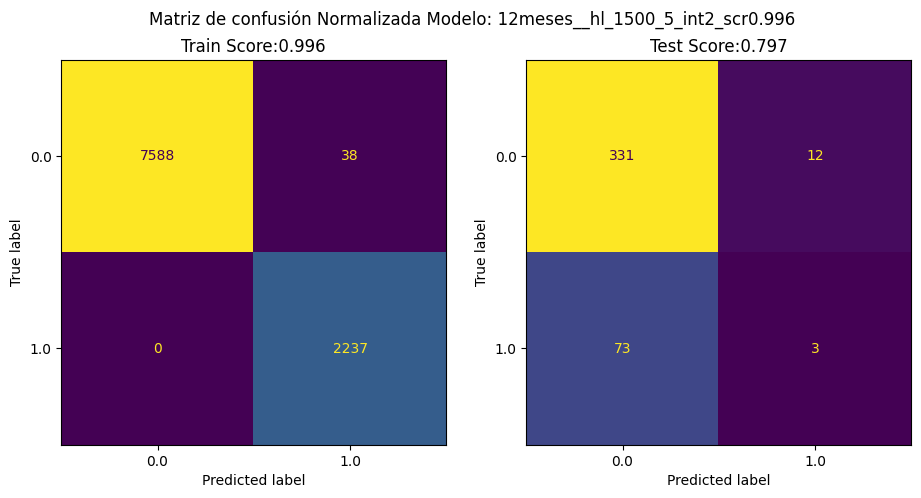

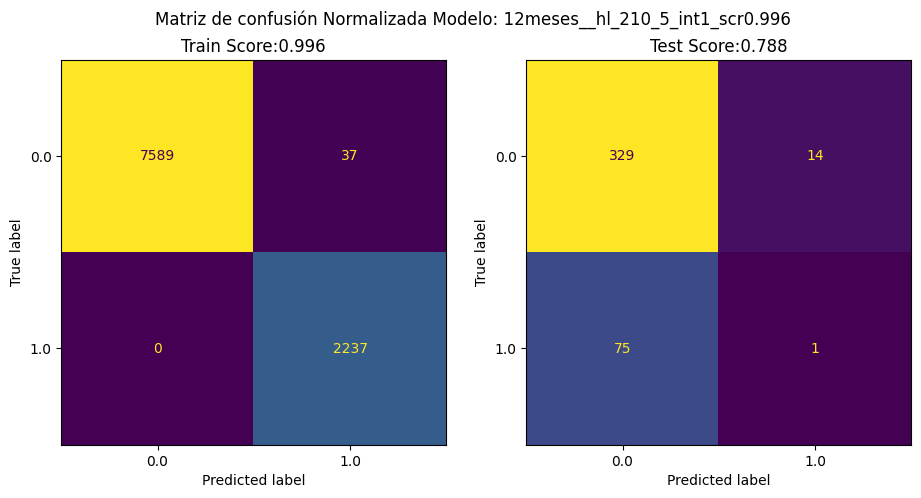

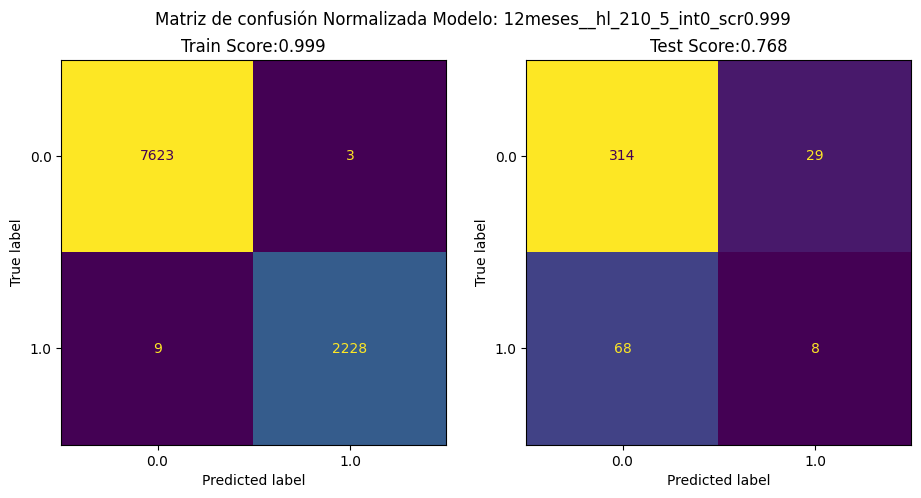

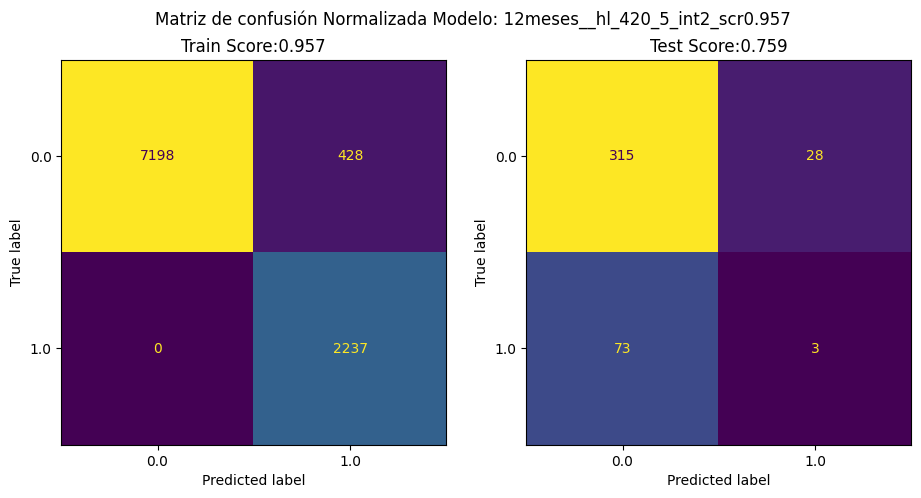

In [ ]:
dictPuntajes = {'Modelo':[],
                'V':[],
                'Train_Score':[],
                'Train_TN':[],
                'Train_FP':[],
                'Train_FN':[],
                'Train_TP':[],
                'Test_Score':[],
                'Test_TN':[],
                'Test_FP':[],
                'Test_FN':[],
                'Test_TP':[]}

dictProba2023 = {}

for modelo in modelosV2:
  if 'joblib' in modelo:
    if '6meses' in modelo:
      dias_Considerar = 180
      Xtest = np.loadtxt(pathDatos+'6meses_X2022.txt')
      ytest = np.loadtxt(pathDatos+'6meses_y2022.txt')
      Xtrain = np.loadtxt(pathDatos+'6meses_X2021.txt')
      ytrain= np.loadtxt(pathDatos+'6meses_y2021.txt')

    if '12meses' in modelo:
      dias_Considerar = 180
      Xtest = np.loadtxt(pathDatos+'12meses_X2022.txt')
      ytest = np.loadtxt(pathDatos+'12meses_y2022.txt')
      Xtrain = np.loadtxt(pathDatos+'12meses_X2021.txt')
      ytrain= np.loadtxt(pathDatos+'12meses_y2021.txt')


    modelo_P = load(pathModelos+modelo)
    arrayTime_Y = np.arange('2022-01-01', '2024-03-01', dtype='datetime64[D]')
    filtro2023 = (arrayTime_Y >= np.array(['2023'], dtype='datetime64[D]'))[:-6] # no considerar los ultimos 7 días

    # Train
    predichosModelo_Train = modelo_P.predict(Xtrain)
    scoreTrain = np.round(modelo_P.score(Xtrain, ytrain), 3)
    tn_Train, fp_Train, fn_Train, tp_Train = confusion_matrix(ytrain, predichosModelo_Train).ravel()

    # Test
    Xtest = Xtest[filtro2023]
    ytest = ytest[filtro2023]
    predichosModelo_Test = modelo_P.predict(Xtest)
    predichosProbModelo_Test = modelo_P.predict_proba(Xtest)[:,1]
    dictProba2023[modelo[:-7]] = predichosProbModelo_Test # Probabilidades 2023
    accuracyScore_Test = np.round(accuracy_score(ytest, predichosModelo_Test),3)
    tn_Test, fp_Test, fn_Test, tp_Test = confusion_matrix(ytest, predichosModelo_Test).ravel()

    # Incluir en la lista
    dictPuntajes['Modelo'].append(modelo[:-7])
    dictPuntajes['V'].append('v2')
    dictPuntajes['Train_Score'].append(scoreTrain)
    dictPuntajes['Train_TN'].append(tn_Train)
    dictPuntajes['Train_FP'].append(fp_Train)
    dictPuntajes['Train_FN'].append(fn_Train)
    dictPuntajes['Train_TP'].append(tp_Train)
    dictPuntajes['Test_Score'].append(accuracyScore_Test)
    dictPuntajes['Test_TN'].append(tn_Test)
    dictPuntajes['Test_FP'].append(fp_Test)
    dictPuntajes['Test_FN'].append(fn_Test)
    dictPuntajes['Test_TP'].append(tp_Test)

    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(11,5))
    #Train

    ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(ytrain, predichosModelo_Train),
                           display_labels=modelo_P.classes_,
                           ).plot(ax=axs[0], colorbar=False)
    axs[0].set_title(f'Train Score:{scoreTrain}')

    #Test
    ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(ytest, predichosModelo_Test),
                        display_labels=modelo_P.classes_,
                        ).plot(ax=axs[1], colorbar=False)
    axs[1].set_title(f'Test Score:{accuracyScore_Test}')

    plt.suptitle(f'Matriz de confusión Normalizada Modelo: {modelo[:-7]}')

    #plt.savefig((pathSaveFiguras + f'v2_{modelo[:-7]}.png'),
    #        format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

    plt.show()
    print('\n')


df_V2 = pd.DataFrame.from_dict(dictPuntajes)
df_prob_V2 = pd.DataFrame.from_dict(dictProba2023)
#df

In [ ]:
ytest.sum()# predice en los proximos 6 días

76.0

In [ ]:
df_V2.to_csv(pathDatos+'df_ConfMatrix_v2_V2.csv', index=False)
df_V2 = pd.read_csv(pathDatos+'df_ConfMatrix_v2_V2.csv')

df_V2

,Modelo,V,Train_Score,Train_TN,Train_FP,Train_FN,Train_TP,Test_Score,Test_TN,Test_FP,Test_FN,Test_TP
0,6meses__hl_2000_5_int0_scr0.999,v2,0.999,7739,11,0,2298,0.821,343,0,75,1
1,6meses__hl_420_5_int0_scr0.987,v2,0.987,7629,121,6,2292,0.819,343,0,76,0
2,6meses__hl_210_5_int0_scr1.0,v2,1.000,7750,0,0,2298,0.816,339,4,73,3
3,6meses__hl_210_5_int1_scr0.996,v2,0.996,7716,34,4,2294,0.811,340,3,76,0
4,12meses__hl_1500_5_int2_scr0.996,v2,0.996,7588,38,0,2237,0.797,331,12,73,3
5,12meses__hl_210_5_int1_scr0.996,v2,0.996,7589,37,0,2237,0.788,329,14,75,1
6,12meses__hl_210_5_int0_scr0.999,v2,0.999,7623,3,9,2228,0.768,314,29,68,8
7,12meses__hl_420_5_int2_scr0.957,v2,0.957,7198,428,0,2237,0.759,315,28,73,3


In [ ]:
df_prob_V2.index = arrayTime_Y[arrayTime_Y >= np.array(['2023'], dtype='datetime64[D]')][:-6]
df_prob_V2.to_csv(pathDatos+'df_Probabilidad_v2_V2.csv')
df_prob_V2 = pd.read_csv(pathDatos+'df_Probabilidad_v2_V2.csv')

df_prob_V2

,Unnamed: 0,6meses__hl_2000_5_int0_scr0.999,6meses__hl_420_5_int0_scr0.987,6meses__hl_210_5_int0_scr1.0,6meses__hl_210_5_int1_scr0.996,12meses__hl_1500_5_int2_scr0.996,12meses__hl_210_5_int1_scr0.996,12meses__hl_210_5_int0_scr0.999,12meses__hl_420_5_int2_scr0.957
0,2023-01-01,0.013015,4.154158e-02,5.092842e-03,0.000380,4.485228e-03,5.819930e-03,3.100953e-03,4.926564e-02
1,2023-01-02,0.014085,1.146284e-03,3.892473e-02,0.000201,3.144478e-02,9.793544e-03,1.470456e-02,9.000637e-03
2,2023-01-03,0.002751,1.265151e-03,1.517245e-02,0.004897,9.326931e-03,2.658862e-03,3.946470e-04,4.377345e-03
3,2023-01-04,0.008077,3.057017e-02,1.230632e-01,0.004540,1.519970e-02,1.110426e-02,8.574808e-03,2.158647e-02
4,2023-01-05,0.213602,1.164433e-01,9.841409e-01,0.070842,2.566290e-02,2.429538e-02,3.404679e-02,2.681154e-02
...,...,...,...,...,...,...,...,...,...
414,2024-02-19,0.000001,4.161493e-07,4.815462e-07,0.000004,5.758760e-08,1.540882e-06,3.305799e-08,1.198740e-08
415,2024-02-20,0.000012,3.519030e-05,4.066581e-06,0.000043,5.535537e-09,2.629757e-08,1.439551e-09,3.266379e-09
416,2024-02-21,0.000002,1.191263e-06,4.032386e-08,0.000022,1.891562e-07,3.442682e-07,4.700183e-09,2.046048e-06
417,2024-02-22,0.000004,3.334873e-06,4.628063e-08,0.000005,3.261871e-06,3.771918e-05,5.897462e-06,1.457247e-04


In [ ]:
(df_prob_V2.iloc[:,1:] > 0.5).sum(axis=0)

6meses__hl_2000_5_int0_scr0.999      1
6meses__hl_420_5_int0_scr0.987       0
6meses__hl_210_5_int0_scr1.0         7
6meses__hl_210_5_int1_scr0.996       3
12meses__hl_1500_5_int2_scr0.996    15
12meses__hl_210_5_int1_scr0.996     15
12meses__hl_210_5_int0_scr0.999     37
12meses__hl_420_5_int2_scr0.957     31
dtype: int64

## V4

In [ ]:
pathModelos = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v4/'
pathDatos = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Catalogos/'
pathSaveFiguras = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Figuras_MatrizConfusion/'

modelosV4 = [
  '2009_6meses_hl_1500_5_int1_scr1.0.joblib',
  '2009_6meses_hl_210_5_int0_scr1.0.joblib',
  '2009_30dias_hl_1500_5_int0_scr1.0.joblib',
  '2009_6meses_hl_420_5_int0_scr1.0.joblib',
  '2009_30dias_hl_2000_5_int1_scr1.0.joblib',
  '2009_12meses_hl_420_5_int0_scr1.0.joblib',
  '2009_30dias_hl_420_5_int0_scr0.998.joblib',
  '2009_12meses_hl_1500_5_int1_scr0.995.joblib',
  '2009_30dias_hl_210_5_int0_scr1.0.joblib',
  '2009_12meses_hl_2000_5_int0_scr0.987.joblib',
  '2009_12meses_hl_210_5_int0_scr1.0.joblib'
  ]

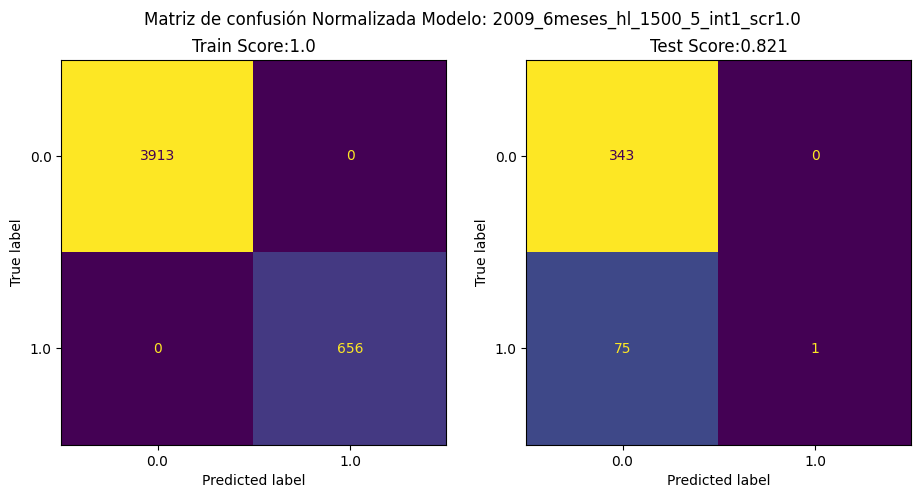

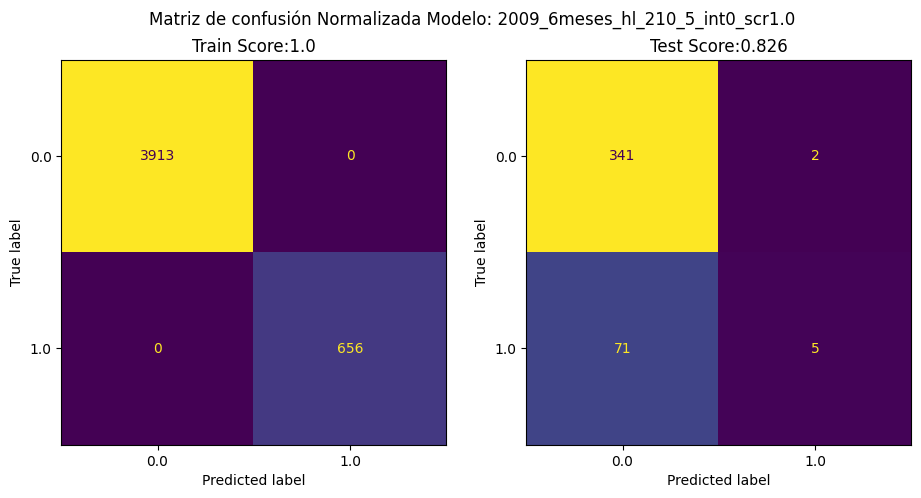

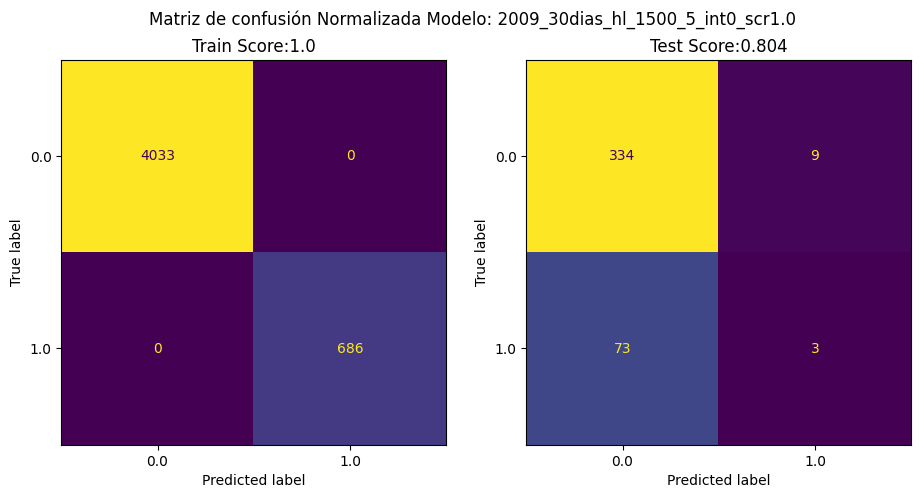

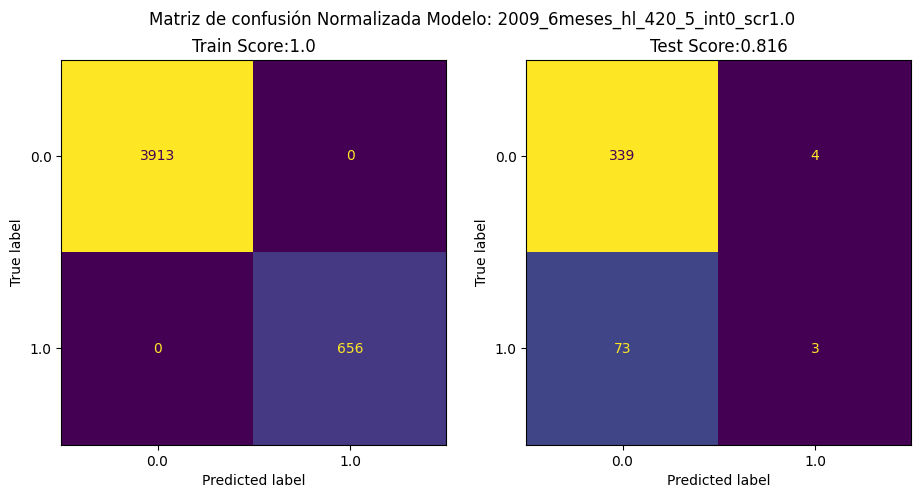

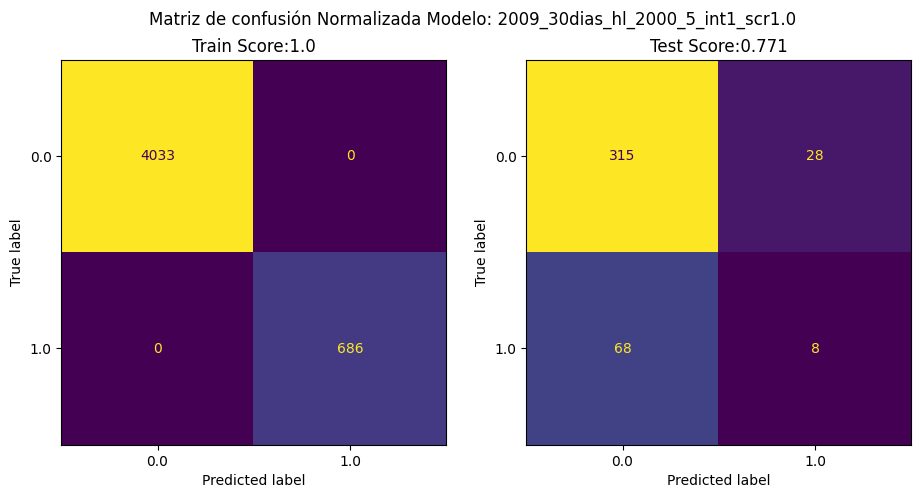

...

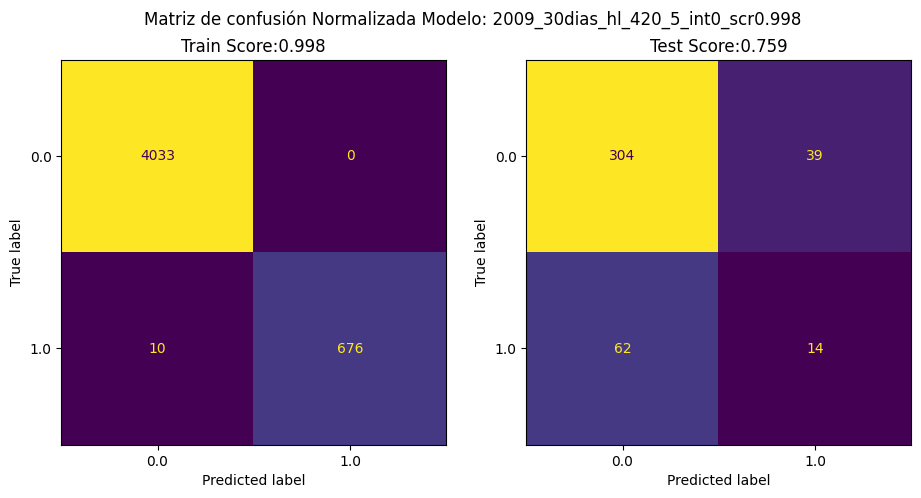

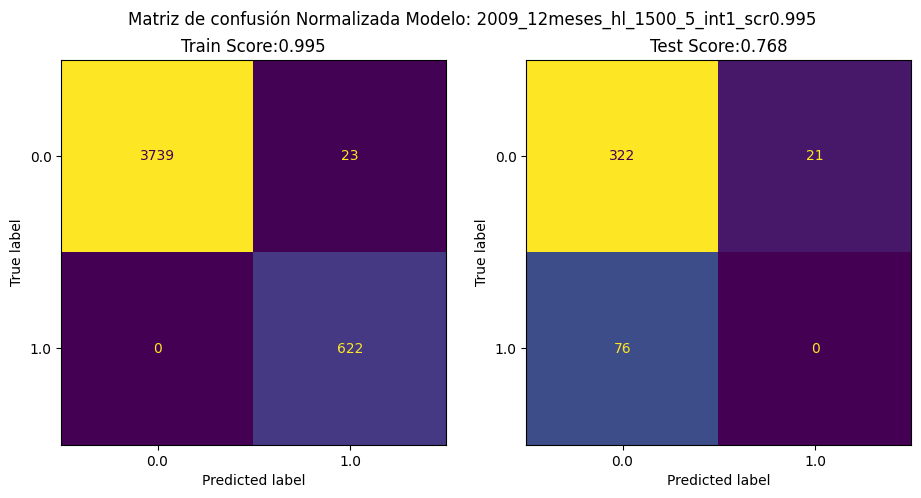

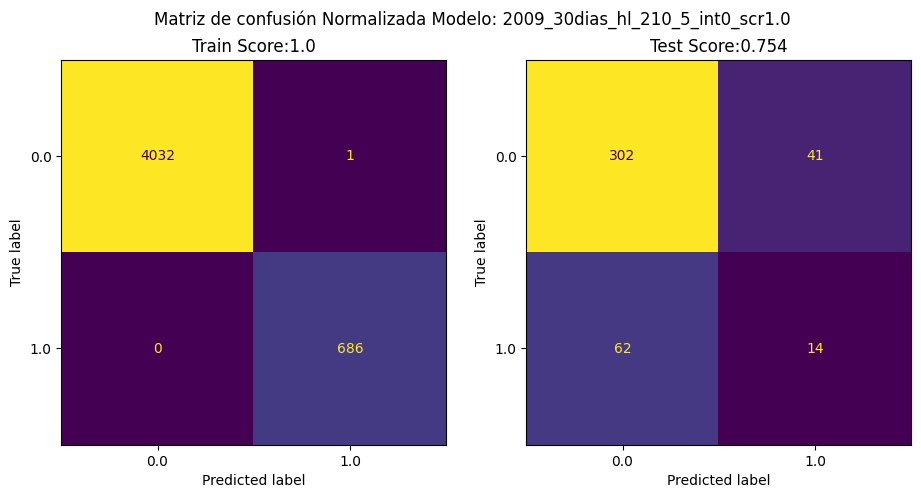

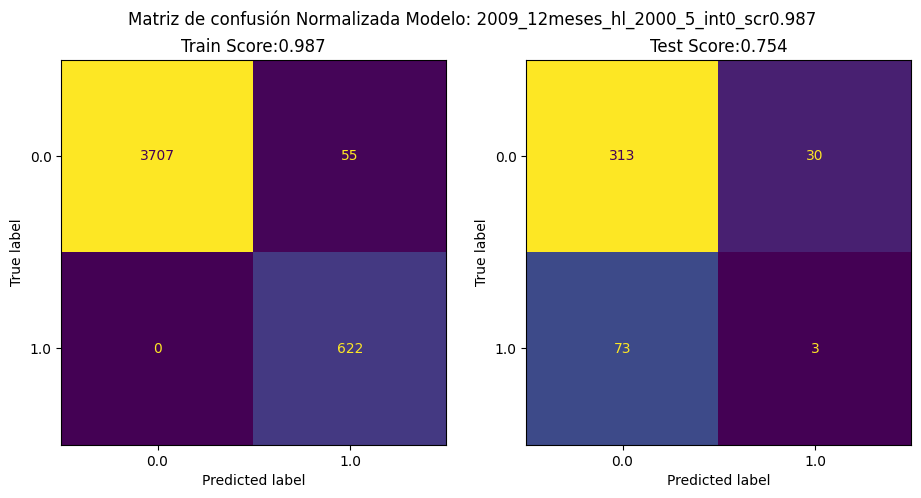

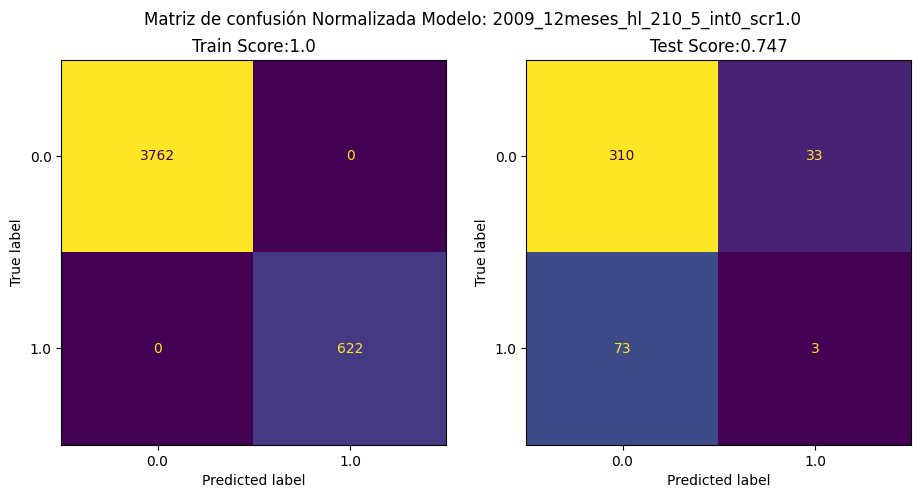

In [ ]:
dictPuntajes = {'Modelo':[],
                'V':[],
                'Train_Score':[],
                'Train_TN':[],
                'Train_FP':[],
                'Train_FN':[],
                'Train_TP':[],
                'Test_Score':[],
                'Test_TN':[],
                'Test_FP':[],
                'Test_FN':[],
                'Test_TP':[]}

dictProba2023 = {}

for modelo in modelosV4:
  if 'joblib' in modelo:
    if '6meses' in modelo:
      Xtest = np.loadtxt(pathDatos+'2009_6meses_X2022.txt')
      ytest = np.loadtxt(pathDatos+'2009_6meses_y2022.txt')
      Xtrain = np.loadtxt(pathDatos+'2009_6meses_X2021.txt')
      ytrain = np.loadtxt(pathDatos+'2009_6meses_y2021.txt')

    if '12meses' in modelo:
      Xtest = np.loadtxt(pathDatos+'2009_12meses_X2022.txt')
      ytest = np.loadtxt(pathDatos+'2009_12meses_y2022.txt')
      Xtrain = np.loadtxt(pathDatos+'2009_12meses_X2021.txt')
      ytrain = np.loadtxt(pathDatos+'2009_12meses_y2021.txt')

    if '30dias' in modelo:
      Xtest = np.loadtxt(pathDatos+'2009_30dias_X2022.txt')
      ytest = np.loadtxt(pathDatos+'2009_30dias_y2022.txt')
      Xtrain = np.loadtxt(pathDatos+'2009_30dias_X2021.txt')
      ytrain = np.loadtxt(pathDatos+'2009_30dias_y2021.txt')

    modelo_P = load(pathModelos+modelo)
    arrayTime_Y = np.arange('2022-01-01', '2024-03-01', dtype='datetime64[D]')
    filtro2023 = (arrayTime_Y >= np.array(['2023'], dtype='datetime64[D]'))[:-6] # no considerar los ultimos 7 días

    # Train
    predichosModelo_Train = modelo_P.predict(Xtrain)
    scoreTrain = np.round(modelo_P.score(Xtrain, ytrain), 3)
    tn_Train, fp_Train, fn_Train, tp_Train = confusion_matrix(ytrain, predichosModelo_Train).ravel()

    # Test
    Xtest = Xtest[filtro2023]
    ytest = ytest[filtro2023]
    predichosModelo_Test = modelo_P.predict(Xtest)
    predichosProbModelo_Test = modelo_P.predict_proba(Xtest)[:,1]
    dictProba2023[modelo[:-7]] = predichosProbModelo_Test # Probabilidades 2023
    accuracyScore_Test = np.round(accuracy_score(ytest, predichosModelo_Test),3)
    tn_Test, fp_Test, fn_Test, tp_Test = confusion_matrix(ytest, predichosModelo_Test).ravel()

    # Incluir en la lista
    dictPuntajes['Modelo'].append(modelo[:-7])
    dictPuntajes['V'].append('v4')
    dictPuntajes['Train_Score'].append(scoreTrain)
    dictPuntajes['Train_TN'].append(tn_Train)
    dictPuntajes['Train_FP'].append(fp_Train)
    dictPuntajes['Train_FN'].append(fn_Train)
    dictPuntajes['Train_TP'].append(tp_Train)
    dictPuntajes['Test_Score'].append(accuracyScore_Test)
    dictPuntajes['Test_TN'].append(tn_Test)
    dictPuntajes['Test_FP'].append(fp_Test)
    dictPuntajes['Test_FN'].append(fn_Test)
    dictPuntajes['Test_TP'].append(tp_Test)

    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(11,5))
    #Train

    ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(ytrain, predichosModelo_Train),
                           display_labels=modelo_P.classes_,
                           ).plot(ax=axs[0], colorbar=False)
    axs[0].set_title(f'Train Score:{scoreTrain}')

    #Test
    ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(ytest, predichosModelo_Test),
                        display_labels=modelo_P.classes_,
                        ).plot(ax=axs[1], colorbar=False)
    axs[1].set_title(f'Test Score:{accuracyScore_Test}')

    plt.suptitle(f'Matriz de confusión Normalizada Modelo: {modelo[:-7]}')

    plt.savefig((pathSaveFiguras + f'v4_{modelo[:-7]}.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

    plt.show()
    print('\n')

df_V4 = pd.DataFrame.from_dict(dictPuntajes)
df_prob_V4 = pd.DataFrame.from_dict(dictProba2023)
#df

In [ ]:
ytest.sum()# predice en los proximos 6 días

76.0

In [ ]:
df_V4.to_csv(pathDatos+'df_ConfMatrix_v2_V4.csv', index=False)
df_V4 = pd.read_csv(pathDatos+'df_ConfMatrix_v2_V4.csv')

df_V4

,Modelo,V,Train_Score,Train_TN,Train_FP,Train_FN,Train_TP,Test_Score,Test_TN,Test_FP,Test_FN,Test_TP
0,2009_6meses_hl_1500_5_int1_scr1.0,v4,1.000,3913,0,0,656,0.821,343,0,75,1
1,2009_6meses_hl_210_5_int0_scr1.0,v4,1.000,3913,0,0,656,0.826,341,2,71,5
2,2009_30dias_hl_1500_5_int0_scr1.0,v4,1.000,4033,0,0,686,0.804,334,9,73,3
3,2009_6meses_hl_420_5_int0_scr1.0,v4,1.000,3913,0,0,656,0.816,339,4,73,3
4,2009_30dias_hl_2000_5_int1_scr1.0,v4,1.000,4033,0,0,686,0.771,315,28,68,8
5,2009_12meses_hl_420_5_int0_scr1.0,v4,1.000,3760,2,0,622,0.783,328,15,76,0
6,2009_30dias_hl_420_5_int0_scr0.998,v4,0.998,4033,0,10,676,0.759,304,39,62,14
7,2009_12meses_hl_1500_5_int1_scr0.995,v4,0.995,3739,23,0,622,0.768,322,21,76,0
8,2009_30dias_hl_210_5_int0_scr1.0,v4,1.000,4032,1,0,686,0.754,302,41,62,14
9,2009_12meses_hl_2000_5_int0_scr0.987,v4,0.987,3707,55,0,622,0.754,313,30,73,3


In [ ]:
df_prob_V4.index = arrayTime_Y[arrayTime_Y >= np.array(['2023'], dtype='datetime64[D]')][:-6]
df_prob_V4.to_csv(pathDatos+'df_Probabilidad_v2_V4.csv')
df_prob_V4 = pd.read_csv(pathDatos+'df_Probabilidad_v2_V4.csv')

df_prob_V4

,Unnamed: 0,2009_6meses_hl_1500_5_int1_scr1.0,2009_6meses_hl_210_5_int0_scr1.0,2009_30dias_hl_1500_5_int0_scr1.0,2009_6meses_hl_420_5_int0_scr1.0,2009_30dias_hl_2000_5_int1_scr1.0,2009_12meses_hl_420_5_int0_scr1.0,2009_30dias_hl_420_5_int0_scr0.998,2009_12meses_hl_1500_5_int1_scr0.995,2009_30dias_hl_210_5_int0_scr1.0,2009_12meses_hl_2000_5_int0_scr0.987,2009_12meses_hl_210_5_int0_scr1.0
0,2023-01-01,0.003156,0.019963,0.013492,1.524825e-02,0.008853,6.331236e-04,0.145737,4.213512e-04,0.010487,1.924494e-04,1.990979e-03
1,2023-01-02,0.000018,0.000006,0.002711,3.907198e-07,0.002114,8.800247e-05,0.016437,7.280926e-06,0.000065,5.301604e-07,2.210250e-05
2,2023-01-03,0.000475,0.000642,0.023227,6.863733e-04,0.106684,1.282486e-05,0.022558,5.681252e-06,0.006190,4.105204e-05,1.602662e-05
3,2023-01-04,0.004271,0.000801,0.006915,1.163329e-03,0.003361,2.606794e-03,0.174709,9.685895e-04,0.000167,1.729117e-03,1.519101e-04
4,2023-01-05,0.083203,0.298002,0.077770,3.502696e-01,0.025323,1.068619e-02,0.044377,1.479349e-01,0.064901,8.135655e-03,1.031605e-02
...,...,...,...,...,...,...,...,...,...,...,...,...
414,2024-02-19,0.000101,0.000105,0.000048,1.430318e-04,0.000001,7.622950e-08,0.002403,6.763752e-08,0.000089,1.239040e-07,9.265708e-09
415,2024-02-20,0.000015,0.000073,0.000046,4.499427e-05,0.000244,2.587243e-09,0.007853,1.800724e-09,0.009743,5.177333e-10,2.101161e-09
416,2024-02-21,0.000004,0.000050,0.000080,5.081265e-06,0.000138,1.358436e-07,0.005825,2.407606e-07,0.000052,2.852134e-07,9.876265e-08
417,2024-02-22,0.000005,0.000025,0.001189,3.879773e-06,0.003126,5.228180e-07,0.044056,5.093564e-07,0.000210,1.160162e-06,1.692749e-05


In [ ]:
(df_prob_V4.iloc[:,1:] > 0.5).sum(axis=0)

2009_6meses_hl_1500_5_int1_scr1.0        1
2009_6meses_hl_210_5_int0_scr1.0         7
2009_30dias_hl_1500_5_int0_scr1.0       12
2009_6meses_hl_420_5_int0_scr1.0         7
2009_30dias_hl_2000_5_int1_scr1.0       36
2009_12meses_hl_420_5_int0_scr1.0       15
2009_30dias_hl_420_5_int0_scr0.998      53
2009_12meses_hl_1500_5_int1_scr0.995    21
2009_30dias_hl_210_5_int0_scr1.0        55
2009_12meses_hl_2000_5_int0_scr0.987    33
2009_12meses_hl_210_5_int0_scr1.0       36
dtype: int64

## V6

In [ ]:
!ls /content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/

2009_12meses_boots_hl_1500_5_int4_scr0.993.joblib
2009_12meses_boots_hl_1500_750_375_188_94_5_int1_scr0.992.joblib
2009_12meses_boots_hl_2000_1000_500_250_125_5_int1_scr1.0.joblib
2009_12meses_boots_hl_2000_5_int1_scr0.971.joblib
2009_12meses_boots_hl_210_105_53_27_13_5_int1_scr1.0.joblib
2009_12meses_boots_hl_210_5_int0_scr0.995.joblib
2009_12meses_boots_hl_420_210_105_53_27_5_int0_scr1.0.joblib
2009_12meses_boots_hl_420_5_int0_scr0.982.joblib
2009_12meses_hl_1500_750_375_188_94_5_int0_scr0.999.joblib
2009_12meses_hl_2000_1000_500_250_125_5_int1_scr1.0.joblib
2009_12meses_hl_210_105_53_27_13_5_int0_scr1.0.joblib
2009_12meses_hl_420_210_105_53_27_5_int0_scr1.0.joblib
2009_30dias_boots_hl_1500_5_int0_scr1.0.joblib
2009_30dias_boots_hl_1500_750_375_188_94_5_int0_scr0.998.joblib
2009_30dias_boots_hl_2000_1000_500_250_125_5_int1_scr0.997.joblib
2009_30dias_boots_hl_2000_5_int0_scr0.999.joblib
2009_30dias_boots_hl_210_105_53_27_13_5_int0_scr0.996.joblib
2009_30dias_boots_hl_210_5_int0_scr1.

In [ ]:
pathModelos = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/'
pathDatos = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Catalogos/'
pathSaveFiguras = '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Figuras_MatrizConfusion/'

modelosV6 = [
  '2009_12meses_boots_hl_1500_5_int4_scr0.993.joblib',
  '2009_12meses_boots_hl_1500_750_375_188_94_5_int1_scr0.992.joblib',
  '2009_12meses_boots_hl_2000_1000_500_250_125_5_int1_scr1.0.joblib',
  '2009_12meses_boots_hl_2000_5_int1_scr0.971.joblib',
  '2009_12meses_boots_hl_210_105_53_27_13_5_int1_scr1.0.joblib',
  '2009_12meses_boots_hl_210_5_int0_scr0.995.joblib',
  '2009_12meses_boots_hl_420_210_105_53_27_5_int0_scr1.0.joblib',
  '2009_12meses_boots_hl_420_5_int0_scr0.982.joblib',
  '2009_12meses_hl_1500_750_375_188_94_5_int0_scr0.999.joblib',
  '2009_12meses_hl_2000_1000_500_250_125_5_int1_scr1.0.joblib',
  '2009_12meses_hl_210_105_53_27_13_5_int0_scr1.0.joblib',
  '2009_12meses_hl_420_210_105_53_27_5_int0_scr1.0.joblib',
  '2009_30dias_boots_hl_1500_5_int0_scr1.0.joblib',
  '2009_30dias_boots_hl_1500_750_375_188_94_5_int0_scr0.998.joblib',
  '2009_30dias_boots_hl_2000_1000_500_250_125_5_int1_scr0.997.joblib',
  '2009_30dias_boots_hl_2000_5_int0_scr0.999.joblib',
  '2009_30dias_boots_hl_210_105_53_27_13_5_int0_scr0.996.joblib',
  '2009_30dias_boots_hl_210_5_int0_scr1.0.joblib',
  '2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997.joblib',
  '2009_30dias_boots_hl_420_5_int0_scr1.0.joblib',
  '2009_30dias_hl_1500_750_375_188_94_5_int0_scr0.998.joblib',
  '2009_30dias_hl_2000_1000_500_250_125_5_int0_scr1.0.joblib',
  '2009_30dias_hl_210_105_53_27_13_5_int0_scr0.999.joblib',
  '2009_30dias_hl_420_210_105_53_27_5_int0_scr1.0.joblib',
  '2009_6meses_boots_hl_1500_5_int0_scr0.977.joblib',
  '2009_6meses_boots_hl_1500_750_375_188_94_5_int4_scr1.0.joblib',
  '2009_6meses_boots_hl_2000_1000_500_250_125_5_int0_scr1.0.joblib',
  '2009_6meses_boots_hl_2000_1000_500_250_125_5_int3_scr0.982.joblib',
  '2009_6meses_boots_hl_2000_5_int1_scr0.996.joblib',
  '2009_6meses_boots_hl_210_105_53_27_13_5_int0_scr1.0.joblib',
  '2009_6meses_boots_hl_210_5_int1_scr1.0.joblib',
  '2009_6meses_boots_hl_420_210_105_53_27_5_int0_scr1.0.joblib',
  '2009_6meses_boots_hl_420_5_int1_scr0.999.joblib',
  '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996.joblib',
  '2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986.joblib',
  '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0.joblib',
  '2009_6meses_hl_420_210_105_53_27_5_int0_scr1.0.joblib'
  ]

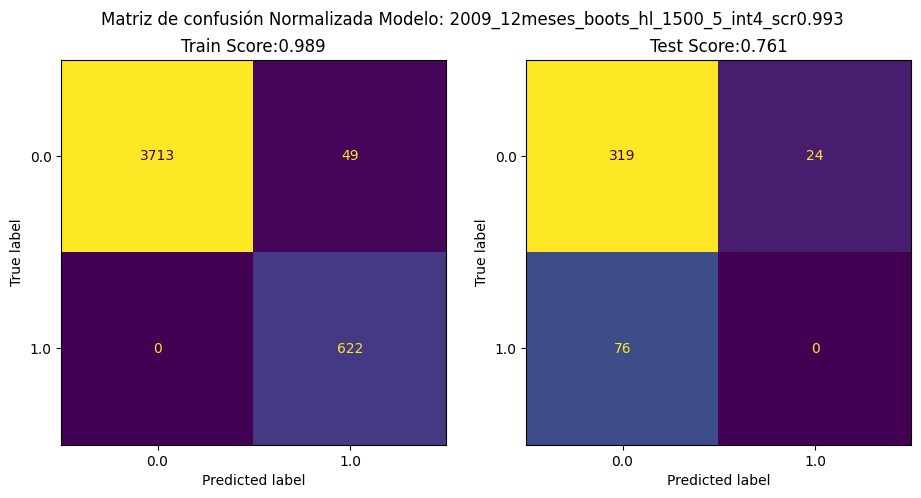

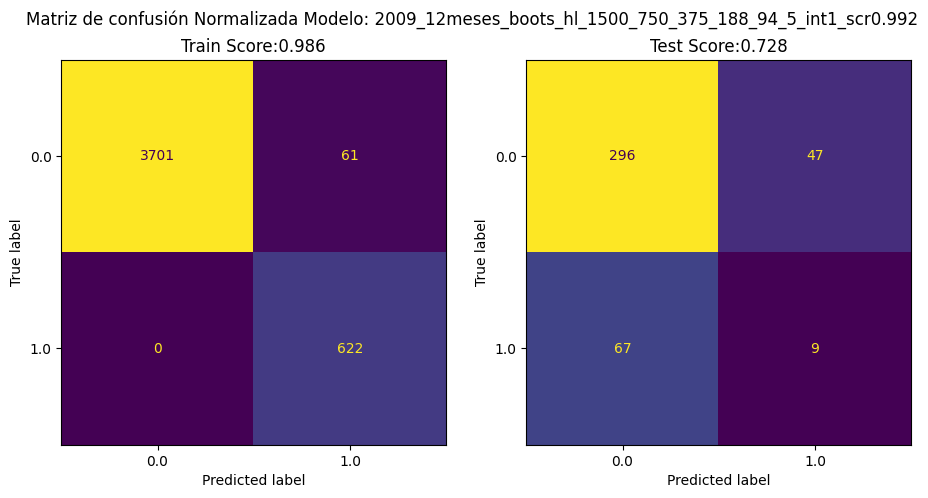

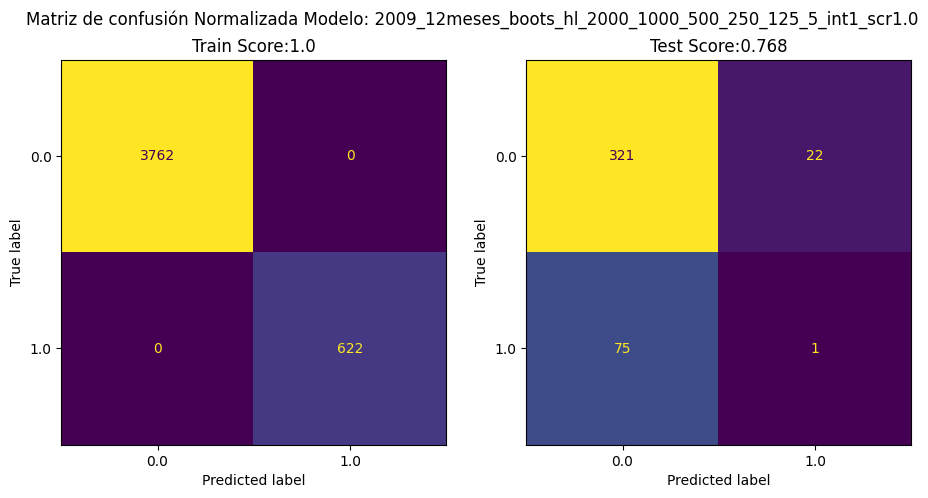

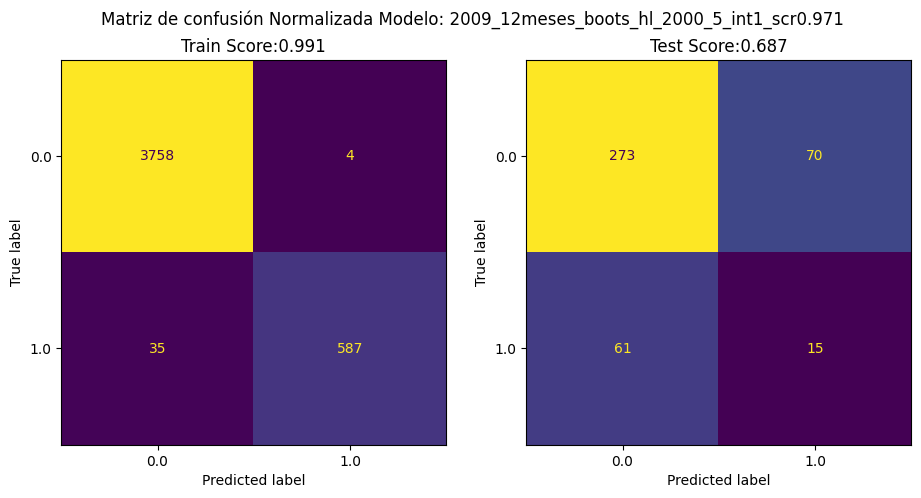

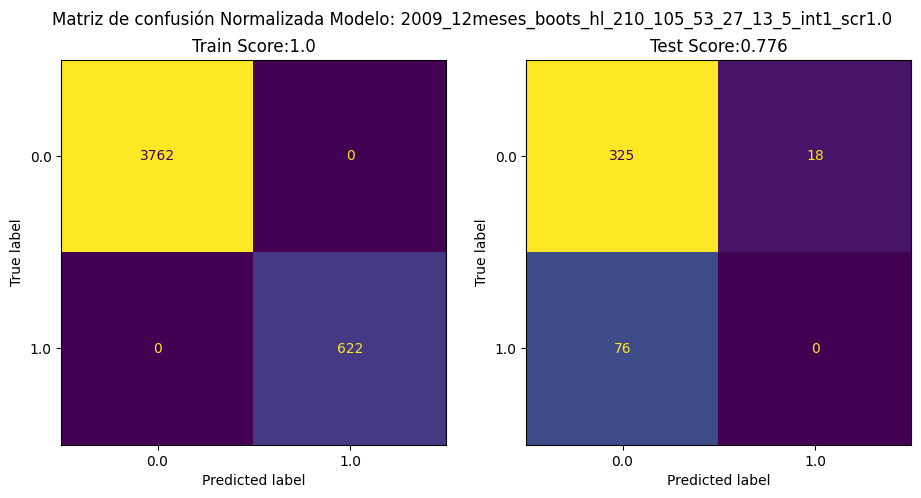

...

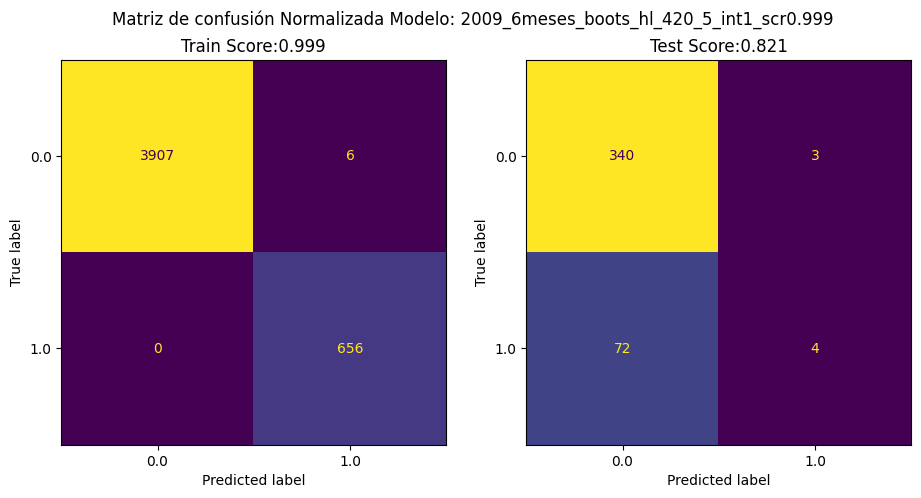

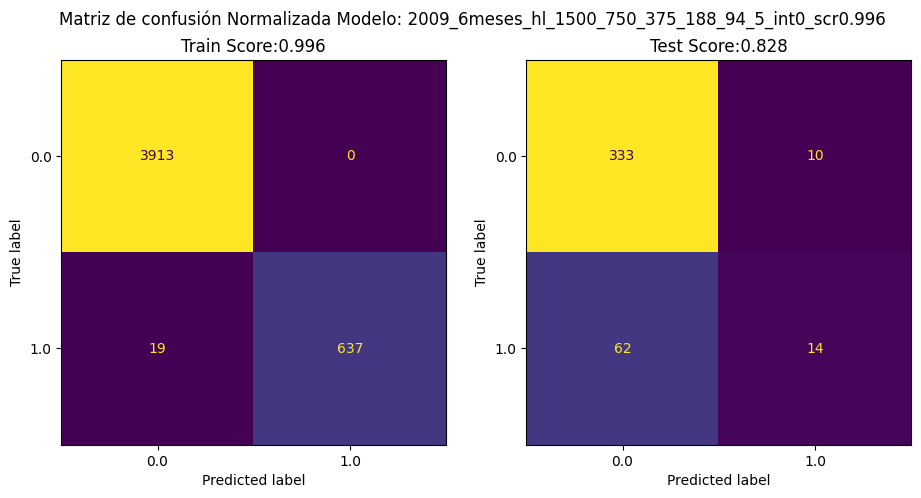

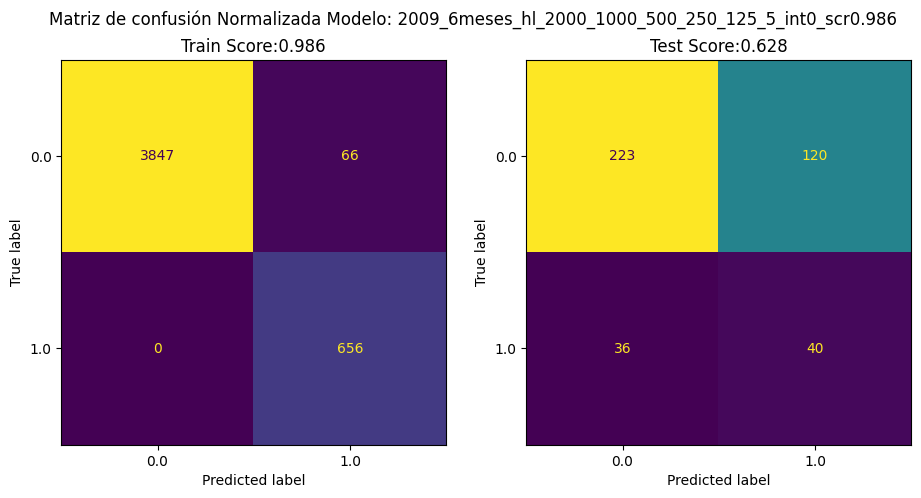

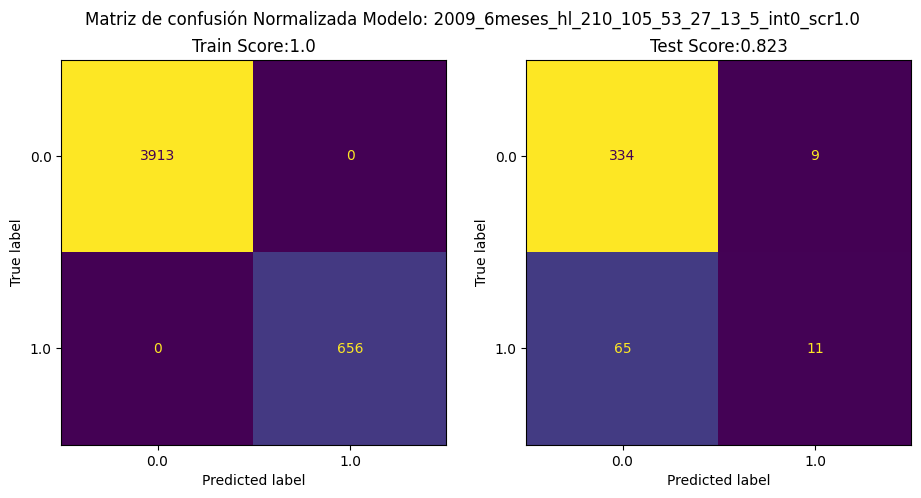

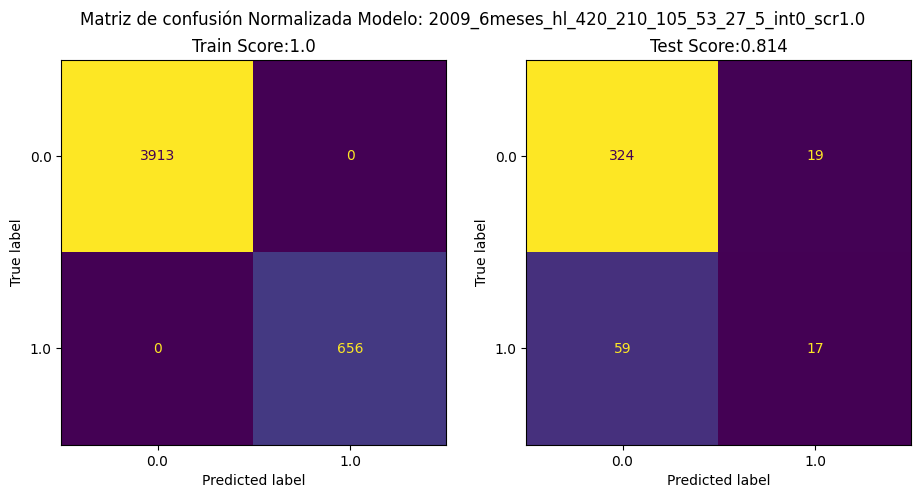

In [ ]:
dictPuntajes = {'Modelo':[],
                'V':[],
                'Train_Score':[],
                'Train_TN':[],
                'Train_FP':[],
                'Train_FN':[],
                'Train_TP':[],
                'Test_Score':[],
                'Test_TN':[],
                'Test_FP':[],
                'Test_FN':[],
                'Test_TP':[]}

dictProba2023 = {}

for modelo in modelosV6:
  if 'joblib' in modelo:
    if '6meses' in modelo:
      Xtest = np.loadtxt(pathDatos+'2009_6meses_X2022.txt')
      ytest = np.loadtxt(pathDatos+'2009_6meses_y2022.txt')
      Xtrain = np.loadtxt(pathDatos+'2009_6meses_X2021.txt')
      ytrain = np.loadtxt(pathDatos+'2009_6meses_y2021.txt')

    if '12meses' in modelo:
      Xtest = np.loadtxt(pathDatos+'2009_12meses_X2022.txt')
      ytest = np.loadtxt(pathDatos+'2009_12meses_y2022.txt')
      Xtrain = np.loadtxt(pathDatos+'2009_12meses_X2021.txt')
      ytrain = np.loadtxt(pathDatos+'2009_12meses_y2021.txt')

    if '30dias' in modelo:
      Xtest = np.loadtxt(pathDatos+'2009_30dias_X2022.txt')
      ytest = np.loadtxt(pathDatos+'2009_30dias_y2022.txt')
      Xtrain = np.loadtxt(pathDatos+'2009_30dias_X2021.txt')
      ytrain = np.loadtxt(pathDatos+'2009_30dias_y2021.txt')

    modelo_P = load(pathModelos+modelo)
    arrayTime_Y = np.arange('2022-01-01', '2024-03-01', dtype='datetime64[D]')
    filtro2023 = (arrayTime_Y >= np.array(['2023'], dtype='datetime64[D]'))[:-6] # no considerar los ultimos 7 días

    # Train
    predichosModelo_Train = modelo_P.predict(Xtrain)
    scoreTrain = np.round(modelo_P.score(Xtrain, ytrain), 3)
    tn_Train, fp_Train, fn_Train, tp_Train = confusion_matrix(ytrain, predichosModelo_Train).ravel()

    # Test
    Xtest = Xtest[filtro2023]
    ytest = ytest[filtro2023]
    predichosModelo_Test = modelo_P.predict(Xtest)
    predichosProbModelo_Test = modelo_P.predict_proba(Xtest)[:,1]
    dictProba2023[modelo[:-7]] = predichosProbModelo_Test # Probabilidades 2023
    accuracyScore_Test = np.round(accuracy_score(ytest, predichosModelo_Test),3)
    tn_Test, fp_Test, fn_Test, tp_Test = confusion_matrix(ytest, predichosModelo_Test).ravel()

    # Incluir en la lista
    dictPuntajes['Modelo'].append(modelo[:-7])
    dictPuntajes['V'].append('v6')
    dictPuntajes['Train_Score'].append(scoreTrain)
    dictPuntajes['Train_TN'].append(tn_Train)
    dictPuntajes['Train_FP'].append(fp_Train)
    dictPuntajes['Train_FN'].append(fn_Train)
    dictPuntajes['Train_TP'].append(tp_Train)
    dictPuntajes['Test_Score'].append(accuracyScore_Test)
    dictPuntajes['Test_TN'].append(tn_Test)
    dictPuntajes['Test_FP'].append(fp_Test)
    dictPuntajes['Test_FN'].append(fn_Test)
    dictPuntajes['Test_TP'].append(tp_Test)

    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(11,5))
    #Train

    ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(ytrain, predichosModelo_Train),
                           display_labels=modelo_P.classes_,
                           ).plot(ax=axs[0], colorbar=False)
    axs[0].set_title(f'Train Score:{scoreTrain}')

    #Test
    ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(ytest, predichosModelo_Test),
                        display_labels=modelo_P.classes_,
                        ).plot(ax=axs[1], colorbar=False)
    axs[1].set_title(f'Test Score:{accuracyScore_Test}')

    plt.suptitle(f'Matriz de confusión Normalizada Modelo: {modelo[:-7]}')

    plt.savefig((pathSaveFiguras + f'v6_{modelo[:-7]}.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

    plt.show()
    print('\n')

df_V6 = pd.DataFrame.from_dict(dictPuntajes)
df_prob_V6 = pd.DataFrame.from_dict(dictProba2023)
#df

In [ ]:
ytest.sum()# predice en los proximos 6 días

76.0

In [ ]:
df_V6.to_csv(pathDatos+'df_ConfMatrix_v2_V6.csv', index=False)
df_V6 = pd.read_csv(pathDatos+'df_ConfMatrix_v2_V6.csv')

df_V6

,Modelo,V,Train_Score,Train_TN,Train_FP,Train_FN,Train_TP,Test_Score,Test_TN,Test_FP,Test_FN,Test_TP
0,2009_12meses_boots_hl_1500_5_int4_scr0.993,v6,0.989,3713,49,0,622,0.761,319,24,76,0
1,2009_12meses_boots_hl_1500_750_375_188_94_5_in...,v6,0.986,3701,61,0,622,0.728,296,47,67,9
2,2009_12meses_boots_hl_2000_1000_500_250_125_5_...,v6,1.000,3762,0,0,622,0.768,321,22,75,1
3,2009_12meses_boots_hl_2000_5_int1_scr0.971,v6,0.991,3758,4,35,587,0.687,273,70,61,15
4,2009_12meses_boots_hl_210_105_53_27_13_5_int1_...,v6,1.000,3762,0,0,622,0.776,325,18,76,0
5,2009_12meses_boots_hl_210_5_int0_scr0.995,v6,0.992,3727,35,0,622,0.800,335,8,76,0
6,2009_12meses_boots_hl_420_210_105_53_27_5_int0...,v6,1.000,3762,0,0,622,0.788,330,13,76,0
7,2009_12meses_boots_hl_420_5_int0_scr0.982,v6,0.995,3762,0,22,600,0.666,265,78,62,14
8,2009_12meses_hl_1500_750_375_188_94_5_int0_scr...,v6,0.999,3760,2,1,621,0.766,314,29,69,7
9,2009_12meses_hl_2000_1000_500_250_125_5_int1_s...,v6,1.000,3762,0,0,622,0.759,313,30,71,5


In [ ]:
df_prob_V6.index = arrayTime_Y[arrayTime_Y >= np.array(['2023'], dtype='datetime64[D]')][:-6]
df_prob_V6.to_csv(pathDatos+'df_Probabilidad_v2_V6.csv')
df_prob_V6 = pd.read_csv(pathDatos+'df_Probabilidad_v2_V6.csv')

df_prob_V6

,Unnamed: 0,2009_12meses_boots_hl_1500_5_int4_scr0.993,2009_12meses_boots_hl_1500_750_375_188_94_5_int1_scr0.992,2009_12meses_boots_hl_2000_1000_500_250_125_5_int1_scr1.0,2009_12meses_boots_hl_2000_5_int1_scr0.971,2009_12meses_boots_hl_210_105_53_27_13_5_int1_scr1.0,2009_12meses_boots_hl_210_5_int0_scr0.995,2009_12meses_boots_hl_420_210_105_53_27_5_int0_scr1.0,2009_12meses_boots_hl_420_5_int0_scr0.982,2009_12meses_hl_1500_750_375_188_94_5_int0_scr0.999,...,2009_6meses_boots_hl_2000_1000_500_250_125_5_int3_scr0.982,2009_6meses_boots_hl_2000_5_int1_scr0.996,2009_6meses_boots_hl_210_105_53_27_13_5_int0_scr1.0,2009_6meses_boots_hl_210_5_int1_scr1.0,2009_6meses_boots_hl_420_210_105_53_27_5_int0_scr1.0,2009_6meses_boots_hl_420_5_int1_scr0.999,2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996,2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986,2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0,2009_6meses_hl_420_210_105_53_27_5_int0_scr1.0
0,2023-01-01,1.037123e-04,1.845597e-04,1.917376e-12,0.257283,1.441062e-03,4.596990e-04,3.704590e-05,0.185931,8.554281e-02,...,0.259884,1.280723e-02,4.998812e-04,9.855298e-02,3.791868e-07,0.009026,4.516627e-05,0.608484,5.197103e-02,1.011580e-02
1,2023-01-02,6.861225e-07,2.843348e-05,2.809870e-13,0.257283,2.195368e-08,8.302087e-06,3.192718e-08,0.185931,3.637630e-07,...,0.259884,5.627103e-06,1.560907e-07,2.644154e-06,1.484563e-07,0.000034,1.778227e-07,0.000877,4.328019e-06,2.390427e-09
2,2023-01-03,2.622515e-07,5.242073e-04,1.661381e-17,0.257283,7.712475e-10,4.500485e-06,5.912225e-09,0.185931,4.502250e-07,...,0.259884,6.701110e-05,7.525794e-04,6.927515e-05,6.069881e-08,0.001184,1.151623e-06,0.010445,2.461871e-03,2.915939e-04
3,2023-01-04,1.275947e-05,2.398528e-05,1.279758e-14,0.257283,8.121802e-08,6.652288e-04,1.615644e-08,0.185931,1.982786e-04,...,0.259884,1.674153e-03,1.037370e-02,1.180125e-03,4.400606e-06,0.002138,1.225962e-04,0.342028,4.541539e-03,3.526033e-01
4,2023-01-05,3.998382e-04,3.361924e-02,1.573397e-06,0.257283,4.702554e-06,1.883376e-03,5.050658e-08,0.185931,7.645753e-05,...,0.259884,1.716379e-01,5.399644e-03,6.169951e-01,9.756573e-01,0.051827,4.563619e-02,0.731386,4.858494e-01,9.689910e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
414,2024-02-19,2.515382e-10,6.578961e-10,1.182006e-22,0.257283,6.038345e-12,8.958510e-08,6.886668e-12,0.185931,1.380898e-11,...,0.259884,8.558904e-05,7.123236e-07,8.269465e-05,1.295954e-08,0.000059,6.857262e-03,0.731386,4.131595e-06,1.851898e-03
415,2024-02-20,1.377671e-11,3.207384e-10,1.340754e-21,0.257283,7.410217e-14,9.268813e-09,1.818022e-12,0.185931,1.308880e-12,...,0.259884,6.651942e-06,5.345770e-08,1.922366e-04,5.644887e-09,0.000024,7.685493e-08,0.000018,8.075517e-06,1.550036e-09
416,2024-02-21,3.420640e-09,4.107051e-07,3.995998e-17,0.257283,2.802616e-12,8.297333e-08,3.666700e-12,0.185931,1.069224e-13,...,0.259884,2.965347e-06,2.322687e-08,7.024623e-06,1.773430e-09,0.000006,2.241780e-11,0.000970,2.996463e-07,5.823763e-08
417,2024-02-22,2.220737e-07,5.602314e-06,3.631574e-19,0.257283,1.197084e-11,4.074386e-07,1.448207e-11,0.185931,5.917342e-09,...,0.259884,4.938937e-07,6.847278e-08,1.305392e-06,2.879974e-09,0.000009,3.694713e-05,0.731386,1.098621e-05,9.787041e-13


In [ ]:
(df_prob_V6.iloc[:,1:] > 0.5).sum(axis=0)

2009_12meses_boots_hl_1500_5_int4_scr0.993                     24
2009_12meses_boots_hl_1500_750_375_188_94_5_int1_scr0.992      56
2009_12meses_boots_hl_2000_1000_500_250_125_5_int1_scr1.0      23
2009_12meses_boots_hl_2000_5_int1_scr0.971                     85
2009_12meses_boots_hl_210_105_53_27_13_5_int1_scr1.0           18
2009_12meses_boots_hl_210_5_int0_scr0.995                       8
2009_12meses_boots_hl_420_210_105_53_27_5_int0_scr1.0          13
2009_12meses_boots_hl_420_5_int0_scr0.982                      92
2009_12meses_hl_1500_750_375_188_94_5_int0_scr0.999            36
2009_12meses_hl_2000_1000_500_250_125_5_int1_scr1.0            35
2009_12meses_hl_210_105_53_27_13_5_int0_scr1.0                 42
2009_12meses_hl_420_210_105_53_27_5_int0_scr1.0                24
2009_30dias_boots_hl_1500_5_int0_scr1.0                        46
2009_30dias_boots_hl_1500_750_375_188_94_5_int0_scr0.998       43
2009_30dias_boots_hl_2000_1000_500_250_125_5_int1_scr0.997     42
2009_30dia

# Compiled prediction graph

In [ ]:
df_prob_V1 = pd.read_csv(pathDatos+'df_Probabilidad_v2_V1.csv')
df_prob_V1['Unnamed: 0'] = pd.to_datetime(df_prob_V1['Unnamed: 0'], yearfirst=True)

df_prob_V1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 419 entries, 0 to 418
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Unnamed: 0                        419 non-null    datetime64[ns]
 1   SD30_ses_a_hl_5_5_1_scr0.816      419 non-null    float64       
 2   SD30_ses_ae_hl_2000_5_5_scr0.993  419 non-null    float64       
 3   SD30_ses_ae_hl_1500_5_0_scr1.0    419 non-null    float64       
 4   SD30_ses_ad_hl_210_5_4_scr1.0     419 non-null    float64       
 5   SD30_ses_ab_hl_210_5_0_scr1.0     419 non-null    float64       
 6   SD30_ses_ad_hl_420_5_2_scr1.0     419 non-null    float64       
 7   SD30_ses_aa_hl_210_5_0_scr1.0     419 non-null    float64       
 8   SD30_ses_a_hl_210_5_0_scr1.0      419 non-null    float64       
 9   SD30_ses_ac_hl_210_5_0_scr1.0     419 non-null    float64       
dtypes: datetime64[ns](1), float64(9)
memory usage: 32.

In [ ]:
df_prob_V2 = pd.read_csv(pathDatos+'df_Probabilidad_v2_V2.csv')
df_prob_V2['Unnamed: 0'] = pd.to_datetime(df_prob_V2['Unnamed: 0'], yearfirst=True)

df_prob_V2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 419 entries, 0 to 418
Data columns (total 9 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Unnamed: 0                        419 non-null    datetime64[ns]
 1   6meses__hl_2000_5_int0_scr0.999   419 non-null    float64       
 2   6meses__hl_420_5_int0_scr0.987    419 non-null    float64       
 3   6meses__hl_210_5_int0_scr1.0      419 non-null    float64       
 4   6meses__hl_210_5_int1_scr0.996    419 non-null    float64       
 5   12meses__hl_1500_5_int2_scr0.996  419 non-null    float64       
 6   12meses__hl_210_5_int1_scr0.996   419 non-null    float64       
 7   12meses__hl_210_5_int0_scr0.999   419 non-null    float64       
 8   12meses__hl_420_5_int2_scr0.957   419 non-null    float64       
dtypes: datetime64[ns](1), float64(8)
memory usage: 29.6 KB


In [ ]:
df_prob_V4 = pd.read_csv(pathDatos+'df_Probabilidad_v2_V4.csv')
df_prob_V4['Unnamed: 0'] = pd.to_datetime(df_prob_V4['Unnamed: 0'], yearfirst=True)

df_prob_V4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 419 entries, 0 to 418
Data columns (total 12 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   Unnamed: 0                            419 non-null    datetime64[ns]
 1   2009_6meses_hl_1500_5_int1_scr1.0     419 non-null    float64       
 2   2009_6meses_hl_210_5_int0_scr1.0      419 non-null    float64       
 3   2009_30dias_hl_1500_5_int0_scr1.0     419 non-null    float64       
 4   2009_6meses_hl_420_5_int0_scr1.0      419 non-null    float64       
 5   2009_30dias_hl_2000_5_int1_scr1.0     419 non-null    float64       
 6   2009_12meses_hl_420_5_int0_scr1.0     419 non-null    float64       
 7   2009_30dias_hl_420_5_int0_scr0.998    419 non-null    float64       
 8   2009_12meses_hl_1500_5_int1_scr0.995  419 non-null    float64       
 9   2009_30dias_hl_210_5_int0_scr1.0      419 non-null    float64       
 10  20

In [ ]:
df_prob_V6 = pd.read_csv(pathDatos+'df_Probabilidad_v2_V6.csv')
df_prob_V6['Unnamed: 0'] = pd.to_datetime(df_prob_V4['Unnamed: 0'], yearfirst=True)

df_prob_V6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 419 entries, 0 to 418
Data columns (total 38 columns):
 #   Column                                                      Non-Null Count  Dtype         
---  ------                                                      --------------  -----         
 0   Unnamed: 0                                                  419 non-null    datetime64[ns]
 1   2009_12meses_boots_hl_1500_5_int4_scr0.993                  419 non-null    float64       
 2   2009_12meses_boots_hl_1500_750_375_188_94_5_int1_scr0.992   419 non-null    float64       
 3   2009_12meses_boots_hl_2000_1000_500_250_125_5_int1_scr1.0   419 non-null    float64       
 4   2009_12meses_boots_hl_2000_5_int1_scr0.971                  419 non-null    float64       
 5   2009_12meses_boots_hl_210_105_53_27_13_5_int1_scr1.0        419 non-null    float64       
 6   2009_12meses_boots_hl_210_5_int0_scr0.995                   419 non-null    float64       
 7   2009_12meses_boots_hl_420_

In [ ]:
df = pd.concat([df_prob_V1, df_prob_V2, df_prob_V4, df_prob_V6], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 419 entries, 0 to 418
Data columns (total 69 columns):
 #   Column                                                      Non-Null Count  Dtype         
---  ------                                                      --------------  -----         
 0   Unnamed: 0                                                  419 non-null    datetime64[ns]
 1   SD30_ses_a_hl_5_5_1_scr0.816                                419 non-null    float64       
 2   SD30_ses_ae_hl_2000_5_5_scr0.993                            419 non-null    float64       
 3   SD30_ses_ae_hl_1500_5_0_scr1.0                              419 non-null    float64       
 4   SD30_ses_ad_hl_210_5_4_scr1.0                               419 non-null    float64       
 5   SD30_ses_ab_hl_210_5_0_scr1.0                               419 non-null    float64       
 6   SD30_ses_ad_hl_420_5_2_scr1.0                               419 non-null    float64       
 7   SD30_ses_aa_hl_210_5_0_scr

The 12 6 months__hl_420_5_int0_scr0.987 model is going to be removed because it did not predict anything for 2023.

Ordering the TP models from highest to lowest and then FP from lowest to highest, the order is obtained as follows:

```python
'2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986',
'2009_30dias_hl_1500_750_375_188_94_5_int0_scr0.998',
'2009_6meses_boots_hl_1500_5_int0_scr0.977',
'SD30_ses_ad_hl_210_5_4_scr1.0',
'2009_30dias_hl_2000_1000_500_250_125_5_int0_scr1.0',
'2009_6meses_hl_420_210_105_53_27_5_int0_scr1.0',
'2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997',
'SD30_ses_aa_hl_210_5_0_scr1.0',
'2009_30dias_boots_hl_210_105_53_27_13_5_int0_scr0.996',
'SD30_ses_a_hl_210_5_0_scr1.0',
'2009_12meses_boots_hl_2000_5_int1_scr0.971',
'2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996',
'2009_30dias_boots_hl_420_5_int0_scr1.0',
'SD30_ses_ab_hl_210_5_0_scr1.0',
'2009_30dias_hl_420_5_int0_scr0.998',
'2009_30dias_hl_210_5_int0_scr1.0',
'SD30_ses_ac_hl_210_5_0_scr1.0',
'2009_30dias_hl_420_210_105_53_27_5_int0_scr1.0',
'2009_12meses_boots_hl_420_5_int0_scr0.982',
'2009_30dias_boots_hl_210_5_int0_scr1.0',
'SD30_ses_ae_hl_1500_5_0_scr1.0',
'2009_30dias_boots_hl_2000_1000_500_250_125_5_int1_scr0.997',
'2009_30dias_hl_210_105_53_27_13_5_int0_scr0.999',
'2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0',
'2009_30dias_boots_hl_2000_5_int0_scr0.999',
'2009_30dias_boots_hl_1500_5_int0_scr1.0',
'SD30_ses_ad_hl_420_5_2_scr1.0',
'2009_6meses_boots_hl_210_5_int1_scr1.0',
'2009_30dias_boots_hl_1500_750_375_188_94_5_int0_scr0.998',
'2009_12meses_boots_hl_1500_750_375_188_94_5_int1_scr0.992',
'SD30_ses_ae_hl_2000_5_5_scr0.993',
'2009_30dias_hl_2000_5_int1_scr1.0',
'12meses__hl_210_5_int0_scr0.999',
'2009_6meses_boots_hl_2000_5_int1_scr0.996',
'2009_12meses_hl_1500_750_375_188_94_5_int0_scr0.999',
'2009_6meses_boots_hl_2000_1000_500_250_125_5_int0_scr1.0',
'2009_6meses_boots_hl_2000_1000_500_250_125_5_int3_scr0.982',
'2009_6meses_boots_hl_210_105_53_27_13_5_int0_scr1.0',
'2009_6meses_boots_hl_420_210_105_53_27_5_int0_scr1.0',
'2009_12meses_hl_210_105_53_27_13_5_int0_scr1.0',
'2009_6meses_hl_210_5_int0_scr1.0',
'2009_12meses_hl_2000_1000_500_250_125_5_int1_scr1.0',
'2009_6meses_boots_hl_420_5_int1_scr0.999',
'2009_6meses_boots_hl_1500_750_375_188_94_5_int4_scr1.0',
'6meses__hl_210_5_int0_scr1.0',
'2009_6meses_hl_420_5_int0_scr1.0',
'2009_30dias_hl_1500_5_int0_scr1.0',
'12meses__hl_1500_5_int2_scr0.996',
'12meses__hl_420_5_int2_scr0.957',
'2009_12meses_hl_2000_5_int0_scr0.987',
'2009_12meses_hl_210_5_int0_scr1.0',
'SD30_ses_a_hl_5_5_1_scr0.816',
'2009_12meses_hl_420_210_105_53_27_5_int0_scr1.0',
'6meses__hl_2000_5_int0_scr0.999',
'2009_6meses_hl_1500_5_int1_scr1.0',
'12meses__hl_210_5_int1_scr0.996',
'2009_12meses_boots_hl_2000_1000_500_250_125_5_int1_scr1.0',
'6meses__hl_210_5_int1_scr0.996',
'2009_12meses_boots_hl_210_5_int0_scr0.995',
'2009_12meses_boots_hl_420_210_105_53_27_5_int0_scr1.0',
'2009_12meses_hl_420_5_int0_scr1.0',
'2009_12meses_boots_hl_210_105_53_27_13_5_int1_scr1.0',
'2009_12meses_hl_1500_5_int1_scr0.995',
'2009_12meses_boots_hl_1500_5_int4_scr0.993',
```

In [ ]:
columnasInteres = [ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 11, 13, 14, 15, 16,
                   17, 18, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,
                    32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46,
                    47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
                    62, 63, 64, 65, 66, 67, 68
                    ]
df2 = df.iloc[:,columnasInteres].copy()
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 419 entries, 0 to 418
Data columns (total 65 columns):
 #   Column                                                      Non-Null Count  Dtype         
---  ------                                                      --------------  -----         
 0   Unnamed: 0                                                  419 non-null    datetime64[ns]
 1   SD30_ses_a_hl_5_5_1_scr0.816                                419 non-null    float64       
 2   SD30_ses_ae_hl_2000_5_5_scr0.993                            419 non-null    float64       
 3   SD30_ses_ae_hl_1500_5_0_scr1.0                              419 non-null    float64       
 4   SD30_ses_ad_hl_210_5_4_scr1.0                               419 non-null    float64       
 5   SD30_ses_ab_hl_210_5_0_scr1.0                               419 non-null    float64       
 6   SD30_ses_ad_hl_420_5_2_scr1.0                               419 non-null    float64       
 7   SD30_ses_aa_hl_210_5_0_scr

### Save CVS probability

In [ ]:
df2.to_csv(pathDatos+'df_Probabilidad_MLPClass.csv', index=False)

In [ ]:
# orden de los Modelos
ordenModelos = ['SD30_ses_ad_hl_210_5_4_scr1.0',
                'SD30_ses_aa_hl_210_5_0_scr1.0',
                'SD30_ses_a_hl_210_5_0_scr1.0',
                'SD30_ses_ab_hl_210_5_0_scr1.0',
                '2009_30dias_hl_210_5_int0_scr1.0',
                'SD30_ses_ac_hl_210_5_0_scr1.0',
                '2009_30dias_hl_420_5_int0_scr0.998',
                'SD30_ses_ae_hl_1500_5_0_scr1.0',
                'SD30_ses_ad_hl_420_5_2_scr1.0',
                'SD30_ses_ae_hl_2000_5_5_scr0.993',
                '2009_30dias_hl_2000_5_int1_scr1.0',
                '12meses__hl_210_5_int0_scr0.999',
                '2009_6meses_hl_210_5_int0_scr1.0',
                '6meses__hl_210_5_int0_scr1.0',
                '2009_6meses_hl_420_5_int0_scr1.0',
                '2009_30dias_hl_1500_5_int0_scr1.0',
                '12meses__hl_1500_5_int2_scr0.996',
                '12meses__hl_420_5_int2_scr0.957',
                '2009_12meses_hl_2000_5_int0_scr0.987',
                '2009_12meses_hl_210_5_int0_scr1.0',
                'SD30_ses_a_hl_5_5_1_scr0.816',
                '6meses__hl_2000_5_int0_scr0.999',
                '2009_6meses_hl_1500_5_int1_scr1.0',
                '12meses__hl_210_5_int1_scr0.996',
                '2009_12meses_hl_420_5_int0_scr1.0',
                '2009_12meses_hl_1500_5_int1_scr0.995',
                '6meses__hl_210_5_int1_scr0.996']
print(len(ordenModelos))
indicesModelos = np.arange(len(ordenModelos), 0, -1)
#indicesModelos = np.concatenate((np.array([28]), indicesModelos))
indicesModelos = np.concatenate((np.array([len(ordenModelos)+1]), indicesModelos))
indicesModelos

27


array([28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12,
       11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1])

In [ ]:
# orden de los Modelos nuevos con version 6
ordenModelos = ['2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986',
                '2009_30dias_hl_1500_750_375_188_94_5_int0_scr0.998',
                '2009_6meses_boots_hl_1500_5_int0_scr0.977',
                'SD30_ses_ad_hl_210_5_4_scr1.0',
                '2009_30dias_hl_2000_1000_500_250_125_5_int0_scr1.0',
                '2009_6meses_hl_420_210_105_53_27_5_int0_scr1.0',
                '2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997',
                'SD30_ses_aa_hl_210_5_0_scr1.0',
                '2009_30dias_boots_hl_210_105_53_27_13_5_int0_scr0.996',
                'SD30_ses_a_hl_210_5_0_scr1.0',
                '2009_12meses_boots_hl_2000_5_int1_scr0.971',
                '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996',
                '2009_30dias_boots_hl_420_5_int0_scr1.0',
                'SD30_ses_ab_hl_210_5_0_scr1.0',
                '2009_30dias_hl_420_5_int0_scr0.998',
                '2009_30dias_hl_210_5_int0_scr1.0',
                'SD30_ses_ac_hl_210_5_0_scr1.0',
                '2009_30dias_hl_420_210_105_53_27_5_int0_scr1.0',
                '2009_12meses_boots_hl_420_5_int0_scr0.982',
                '2009_30dias_boots_hl_210_5_int0_scr1.0',
                'SD30_ses_ae_hl_1500_5_0_scr1.0',
                '2009_30dias_boots_hl_2000_1000_500_250_125_5_int1_scr0.997',
                '2009_30dias_hl_210_105_53_27_13_5_int0_scr0.999',
                '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0',
                '2009_30dias_boots_hl_2000_5_int0_scr0.999',
                '2009_30dias_boots_hl_1500_5_int0_scr1.0',
                'SD30_ses_ad_hl_420_5_2_scr1.0',
                '2009_6meses_boots_hl_210_5_int1_scr1.0',
                '2009_30dias_boots_hl_1500_750_375_188_94_5_int0_scr0.998',
                '2009_12meses_boots_hl_1500_750_375_188_94_5_int1_scr0.992',
                'SD30_ses_ae_hl_2000_5_5_scr0.993',
                '2009_30dias_hl_2000_5_int1_scr1.0',
                '12meses__hl_210_5_int0_scr0.999',
                '2009_6meses_boots_hl_2000_5_int1_scr0.996',
                '2009_12meses_hl_1500_750_375_188_94_5_int0_scr0.999',
                '2009_6meses_boots_hl_2000_1000_500_250_125_5_int0_scr1.0',
                '2009_6meses_boots_hl_2000_1000_500_250_125_5_int3_scr0.982',
                '2009_6meses_boots_hl_210_105_53_27_13_5_int0_scr1.0',
                '2009_6meses_boots_hl_420_210_105_53_27_5_int0_scr1.0',
                '2009_12meses_hl_210_105_53_27_13_5_int0_scr1.0',
                '2009_6meses_hl_210_5_int0_scr1.0',
                '2009_12meses_hl_2000_1000_500_250_125_5_int1_scr1.0',
                '2009_6meses_boots_hl_420_5_int1_scr0.999',
                '2009_6meses_boots_hl_1500_750_375_188_94_5_int4_scr1.0',
                '6meses__hl_210_5_int0_scr1.0',
                '2009_6meses_hl_420_5_int0_scr1.0',
                '2009_30dias_hl_1500_5_int0_scr1.0',
                '12meses__hl_1500_5_int2_scr0.996',
                '12meses__hl_420_5_int2_scr0.957',
                '2009_12meses_hl_2000_5_int0_scr0.987',
                '2009_12meses_hl_210_5_int0_scr1.0',
                'SD30_ses_a_hl_5_5_1_scr0.816',
                '2009_12meses_hl_420_210_105_53_27_5_int0_scr1.0',
                '6meses__hl_2000_5_int0_scr0.999',
                '2009_6meses_hl_1500_5_int1_scr1.0',
                '12meses__hl_210_5_int1_scr0.996',
                '2009_12meses_boots_hl_2000_1000_500_250_125_5_int1_scr1.0',
                '6meses__hl_210_5_int1_scr0.996',
                '2009_12meses_boots_hl_210_5_int0_scr0.995',
                '2009_12meses_boots_hl_420_210_105_53_27_5_int0_scr1.0',
                '2009_12meses_hl_420_5_int0_scr1.0',
                '2009_12meses_boots_hl_210_105_53_27_13_5_int1_scr1.0',
                '2009_12meses_hl_1500_5_int1_scr0.995',
                '2009_12meses_boots_hl_1500_5_int4_scr0.993',]
print(len(ordenModelos))
indicesModelos = np.arange(len(ordenModelos), 0, -1)
#indicesModelos = np.concatenate((np.array([28]), indicesModelos))
indicesModelos = np.concatenate((np.array([len(ordenModelos)+1]), indicesModelos))
indicesModelos

64


array([65, 64, 63, 62, 61, 60, 59, 58, 57, 56, 55, 54, 53, 52, 51, 50, 49,
       48, 47, 46, 45, 44, 43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32,
       31, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15,
       14, 13, 12, 11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1])

## Criterio

In [ ]:
df2['Best 10'] = df2[ordenModelos[0:10]].mean(axis=1)
#df2['Best 10'] = df2[ordenModelos].mean(axis=1)
#df2['Best 10'] = (df2[ordenModelos] >= 0.9).sum(axis=1)
#df2['Best 10'] = df2[ordenModelos].quantile([0.9], axis=1).to_numpy().reshape(-1,1)
df2

,Unnamed: 0,SD30_ses_a_hl_5_5_1_scr0.816,SD30_ses_ae_hl_2000_5_5_scr0.993,SD30_ses_ae_hl_1500_5_0_scr1.0,SD30_ses_ad_hl_210_5_4_scr1.0,SD30_ses_ab_hl_210_5_0_scr1.0,SD30_ses_ad_hl_420_5_2_scr1.0,SD30_ses_aa_hl_210_5_0_scr1.0,SD30_ses_a_hl_210_5_0_scr1.0,SD30_ses_ac_hl_210_5_0_scr1.0,...,2009_6meses_boots_hl_2000_5_int1_scr0.996,2009_6meses_boots_hl_210_105_53_27_13_5_int0_scr1.0,2009_6meses_boots_hl_210_5_int1_scr1.0,2009_6meses_boots_hl_420_210_105_53_27_5_int0_scr1.0,2009_6meses_boots_hl_420_5_int1_scr0.999,2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996,2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986,2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0,2009_6meses_hl_420_210_105_53_27_5_int0_scr1.0,Best 10
0,2023-01-01,0.088836,7.146377e-01,2.070931e-01,5.992044e-01,9.471241e-01,2.001586e-01,3.521941e-03,7.348634e-01,9.160763e-01,...,1.280723e-02,4.998812e-04,9.855298e-02,3.791868e-07,0.009026,4.516627e-05,0.608484,5.197103e-02,1.011580e-02,0.218233
1,2023-01-02,0.136922,1.841301e-02,2.193087e-02,2.414906e-05,7.228520e-02,2.748519e-02,6.707681e-05,8.024584e-05,7.090893e-02,...,5.627103e-06,1.560907e-07,2.644154e-06,1.484563e-07,0.000034,1.778227e-07,0.000877,4.328019e-06,2.390427e-09,0.016285
2,2023-01-03,0.183501,3.709442e-02,4.364226e-02,5.310918e-01,2.112219e-05,8.260185e-02,8.504711e-01,2.315768e-04,9.258438e-01,...,6.701110e-05,7.525794e-04,6.927515e-05,6.069881e-08,0.001184,1.151623e-06,0.010445,2.461871e-03,2.915939e-04,0.259923
3,2023-01-04,0.131997,9.246956e-03,3.671268e-05,2.494471e-04,5.879490e-05,2.845838e-03,4.912026e-04,3.881908e-05,4.093041e-03,...,1.674153e-03,1.037370e-02,1.180125e-03,4.400606e-06,0.002138,1.225962e-04,0.342028,4.541539e-03,3.526033e-01,0.086027
4,2023-01-05,0.205043,1.082087e-02,6.351598e-03,3.867781e-01,7.147498e-03,4.906221e-02,2.220217e-05,1.318687e-03,3.248471e-03,...,1.716379e-01,5.399644e-03,6.169951e-01,9.756573e-01,0.051827,4.563619e-02,0.731386,4.858494e-01,9.689910e-01,0.507241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
414,2024-02-19,0.016284,5.628584e-07,8.740085e-10,7.565106e-09,3.110701e-16,1.977021e-07,2.269347e-09,1.372064e-10,1.952983e-06,...,8.558904e-05,7.123236e-07,8.269465e-05,1.295954e-08,0.000059,6.857262e-03,0.731386,4.131595e-06,1.851898e-03,0.089664
415,2024-02-20,0.087500,9.654669e-05,8.992489e-07,9.373685e-07,4.948874e-08,1.291055e-05,1.376276e-09,1.781652e-11,1.267942e-07,...,6.651942e-06,5.345770e-08,1.922366e-04,5.644887e-09,0.000024,7.685493e-08,0.000018,8.075517e-06,1.550036e-09,0.016180
416,2024-02-21,0.052413,1.225750e-04,9.291795e-07,2.921971e-06,1.385028e-08,4.856440e-06,3.991239e-07,1.915773e-06,5.508312e-06,...,2.965347e-06,2.322687e-08,7.024623e-06,1.773430e-09,0.000006,2.241780e-11,0.000970,2.996463e-07,5.823763e-08,0.016270
417,2024-02-22,0.146943,3.097316e-03,3.432844e-05,1.361281e-03,3.599648e-01,6.430667e-04,4.766891e-10,2.497386e-05,2.427148e-04,...,4.938937e-07,6.847278e-08,1.305392e-06,2.879974e-09,0.000009,3.694713e-05,0.731386,1.098621e-05,9.787041e-13,0.091436


In [ ]:
fechas2023 = np.arange('2023-01-01', '2024-03-01', dtype='datetime64[D]')
fechas2023 = fechas2023[:-6]
fechas2023.shape

(419,)

In [ ]:
# Cargar el ytest de la V1 hasta 2024 para poder hacer los rectangulos
ytest = np.loadtxt(pathDatos+'SD30_y2024.txt')

len(ytest)

419

In [ ]:
# Sacar las fechas inicio fin de los rectangulos
fechaInicio = []
fechaFin = []

for i in range(0, len(ytest)-1):
  if (ytest[i] == 0) & (ytest[i+1] == 1):
    fechaInicio.append(fechas2023[i+1])
  if (ytest[i] == 1) & (ytest[i+1] == 0):
    fechaFin.append(fechas2023[i])
fechaInicio = np.array(fechaInicio).reshape(-1,1)
fechaFin = np.array(fechaFin).reshape(-1,1)
fechasRectangulo = np.concatenate((fechaInicio, fechaFin), axis=1)
fechasRectangulo

array([['2023-01-07', '2023-01-12'],
       ['2023-02-09', '2023-02-14'],
       ['2023-03-04', '2023-03-09'],
       ['2023-05-08', '2023-05-13'],
       ['2023-05-22', '2023-05-27'],
       ['2023-08-11', '2023-08-16'],
       ['2023-09-01', '2023-09-06'],
       ['2023-09-08', '2023-09-15'],
       ['2023-10-24', '2023-11-03'],
       ['2024-01-15', '2024-01-21'],
       ['2024-02-14', '2024-02-21']], dtype='datetime64[D]')

In [ ]:
labelTicksModels = ['Mod ' + str(i) for i in indicesModelos]
labelTicksModels.append('Best 10')
labelTicksModels.remove(f'Mod {indicesModelos.max()}')
labelTicksModels

['Mod 64',
 'Mod 63',
 'Mod 62',
 'Mod 61',
 'Mod 60',
 'Mod 59',
 'Mod 58',
 'Mod 57',
 'Mod 56',
 'Mod 55',
 'Mod 54',
 'Mod 53',
 'Mod 52',
 'Mod 51',
 'Mod 50',
 'Mod 49',
 'Mod 48',
 'Mod 47',
 'Mod 46',
 'Mod 45',
 'Mod 44',
 'Mod 43',
 'Mod 42',
 'Mod 41',
 'Mod 40',
 'Mod 39',
 'Mod 38',
 'Mod 37',
 'Mod 36',
 'Mod 35',
 'Mod 34',
 'Mod 33',
 'Mod 32',
 'Mod 31',
 'Mod 30',
 'Mod 29',
 'Mod 28',
 'Mod 27',
 'Mod 26',
 'Mod 25',
 'Mod 24',
 'Mod 23',
 'Mod 22',
 'Mod 21',
 'Mod 20',
 'Mod 19',
 'Mod 18',
 'Mod 17',
 'Mod 16',
 'Mod 15',
 'Mod 14',
 'Mod 13',
 'Mod 12',
 'Mod 11',
 'Mod 10',
 'Mod 9',
 'Mod 8',
 'Mod 7',
 'Mod 6',
 'Mod 5',
 'Mod 4',
 'Mod 3',
 'Mod 2',
 'Mod 1',
 'Best 10']

In [ ]:
ordenModelos = ['Best 10'] + ordenModelos
ordenModelos

['Best 10',
 '2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986',
 '2009_30dias_hl_1500_750_375_188_94_5_int0_scr0.998',
 '2009_6meses_boots_hl_1500_5_int0_scr0.977',
 'SD30_ses_ad_hl_210_5_4_scr1.0',
 '2009_30dias_hl_2000_1000_500_250_125_5_int0_scr1.0',
 '2009_6meses_hl_420_210_105_53_27_5_int0_scr1.0',
 '2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997',
 'SD30_ses_aa_hl_210_5_0_scr1.0',
 '2009_30dias_boots_hl_210_105_53_27_13_5_int0_scr0.996',
 'SD30_ses_a_hl_210_5_0_scr1.0',
 '2009_12meses_boots_hl_2000_5_int1_scr0.971',
 '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996',
 '2009_30dias_boots_hl_420_5_int0_scr1.0',
 'SD30_ses_ab_hl_210_5_0_scr1.0',
 '2009_30dias_hl_420_5_int0_scr0.998',
 '2009_30dias_hl_210_5_int0_scr1.0',
 'SD30_ses_ac_hl_210_5_0_scr1.0',
 '2009_30dias_hl_420_210_105_53_27_5_int0_scr1.0',
 '2009_12meses_boots_hl_420_5_int0_scr0.982',
 '2009_30dias_boots_hl_210_5_int0_scr1.0',
 'SD30_ses_ae_hl_1500_5_0_scr1.0',
 '2009_30dias_boots_hl_2000_1000_500_250_1

In [ ]:
indicesModelos.shape

(65,)

In [ ]:
len(ordenModelos)

65

In [ ]:
len(labelTicksModels)

65

In [ ]:
pathSaveFiguras

'/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Figuras_MatrizConfusion/'

## Graphic without text

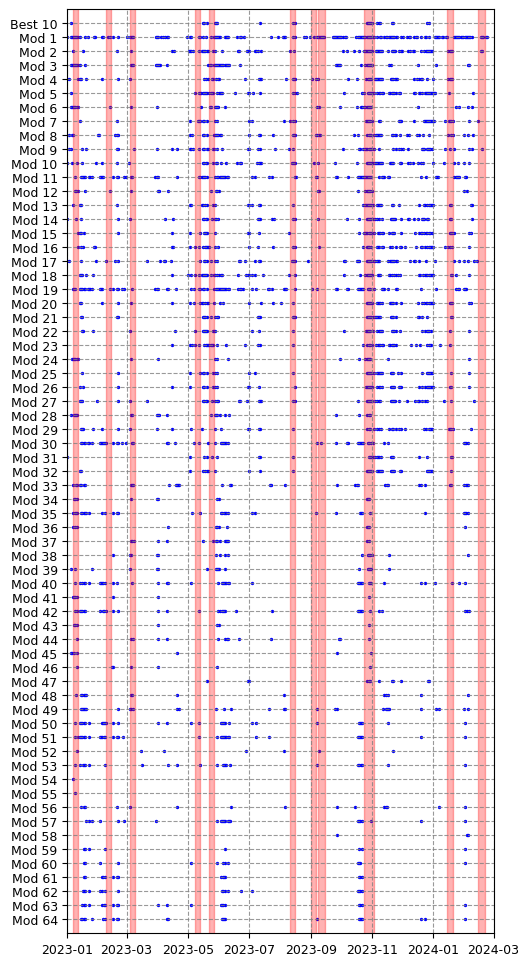

In [ ]:
#fig, axs = plt.subplots(1, figsize=(5.5,6))
#fig, axs = plt.subplots(1, figsize=(12,6))
fig, axs = plt.subplots(1, figsize=(5.5,12))

for indicesMod, mod in zip(indicesModelos, ordenModelos):
  dfTemp = df2[mod]
  filtro = dfTemp > 0.5
  Xplot = fechas2023[filtro]
  Yplot = np.ones(len(Xplot)) * indicesMod

  axs.scatter(Xplot, Yplot, label=mod, s=2, color='blue')

for rec in range(0, fechasRectangulo.shape[0]):
  deltaDias = fechasRectangulo[rec,1] - fechasRectangulo[rec,0]
  Xrec = fechasRectangulo[rec,0]
  Yrec = -2
  axs.add_patch(Rectangle(xy=(Xrec, Yrec),
                          width=(fechasRectangulo[rec,1] - fechasRectangulo[rec,0]),
                          height=len(ordenModelos)+5,
                          fill=True,
                          color ='red',
                          alpha=0.3)
                          )

plt.yticks(np.arange(1, len(ordenModelos)+1), labels=labelTicksModels, fontsize=9)
plt.xticks(fontsize=9)
#plt.legend()
plt.grid(ls='--', color='grey', alpha=0.8)
plt.ylim(0, len(ordenModelos)+1)
plt.xlim(np.datetime64('2023-01-01'),
         np.datetime64('2024-03-01'))

plt.savefig((pathSaveFiguras + f'ModelosPrediccion_2023.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

plt.show()

## Graphic with text

In [ ]:
# Cargar csv TablaMetricasModelos_solo2023_v2
df_MetricasModelos = pd.read_csv('/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/df_TablaMetricasModelos_solo2023_v2.csv',
                                      sep=',', decimal='.')
df_MetricasModelos.index = df_MetricasModelos['Modelo']
df_MetricasModelos

,Modelo,Mod,V,Train_Score,Train_TN,Train_FP,Train_FN,Train_TP,Test_Score,Test_TN,Test_FP,Test_FN,Test_TP,Total TEST,recall_score,precision_score,f1_score,AUC
Modelo,,,,,,,,,,,,,,,,,,
2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986,2009_6meses_hl_2000_1000_500_250_125_5_int0_sc...,Mod 1,v6,0.986,3847.0,66.0,0.0,656.0,0.628,223.0,120.0,36.0,40.0,419.0,0.52632,0.25000,0.33898,0.610097
2009_30dias_hl_1500_750_375_188_94_5_int0_scr0.998,2009_30dias_hl_1500_750_375_188_94_5_int0_scr0...,Mod 2,v6,0.998,4023.0,10.0,0.0,686.0,0.733,286.0,57.0,55.0,21.0,419.0,0.27632,0.26923,0.27273,0.592642
2009_6meses_boots_hl_1500_5_int0_scr0.977,2009_6meses_boots_hl_1500_5_int0_scr0.977,Mod 3,v6,0.993,3913.0,0.0,30.0,626.0,0.773,305.0,38.0,57.0,19.0,419.0,0.25000,0.33333,0.28571,0.608332
SD30_ses_ad_hl_210_5_4_scr1.0,SD30_ses_ad_hl_210_5_4_scr1.0,Mod 4,v1,1.000,8157.0,2.0,0.0,2404.0,0.766,302.0,41.0,57.0,19.0,419.0,0.25000,0.31667,0.27941,0.540931
2009_30dias_hl_2000_1000_500_250_125_5_int0_scr1.0,2009_30dias_hl_2000_1000_500_250_125_5_int0_sc...,Mod 5,v6,1.000,4033.0,0.0,0.0,686.0,0.742,293.0,50.0,58.0,18.0,419.0,0.23684,0.26471,0.25000,0.580252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009_12meses_boots_hl_420_210_105_53_27_5_int0_scr1.0,2009_12meses_boots_hl_420_210_105_53_27_5_int0...,Mod 60,v6,1.000,3762.0,0.0,0.0,622.0,0.788,330.0,13.0,76.0,0.0,419.0,0.00000,0.00000,0.00000,0.506023
2009_12meses_hl_420_5_int0_scr1.0,2009_12meses_hl_420_5_int0_scr1.0,Mod 61,v4,1.000,3760.0,2.0,0.0,622.0,0.783,328.0,15.0,76.0,0.0,419.0,0.00000,0.00000,0.00000,0.537019
2009_12meses_boots_hl_210_105_53_27_13_5_int1_scr1.0,2009_12meses_boots_hl_210_105_53_27_13_5_int1_...,Mod 62,v6,1.000,3762.0,0.0,0.0,622.0,0.776,325.0,18.0,76.0,0.0,419.0,0.00000,0.00000,0.00000,0.515498


In [ ]:
df_MetricasModelos.columns

Index(['Modelo', 'Mod', 'V', 'Train_Score', 'Train_TN', 'Train_FP', 'Train_FN',
       'Train_TP', 'Test_Score', 'Test_TN', 'Test_FP', 'Test_FN', 'Test_TP',
       'Total TEST', 'recall_score', 'precision_score', 'f1_score', 'AUC'],
      dtype='object')

In [ ]:
np.round(df_MetricasModelos.loc['2009_12meses_boots_hl_1500_5_int4_scr0.993','AUC'], 3)

0.526

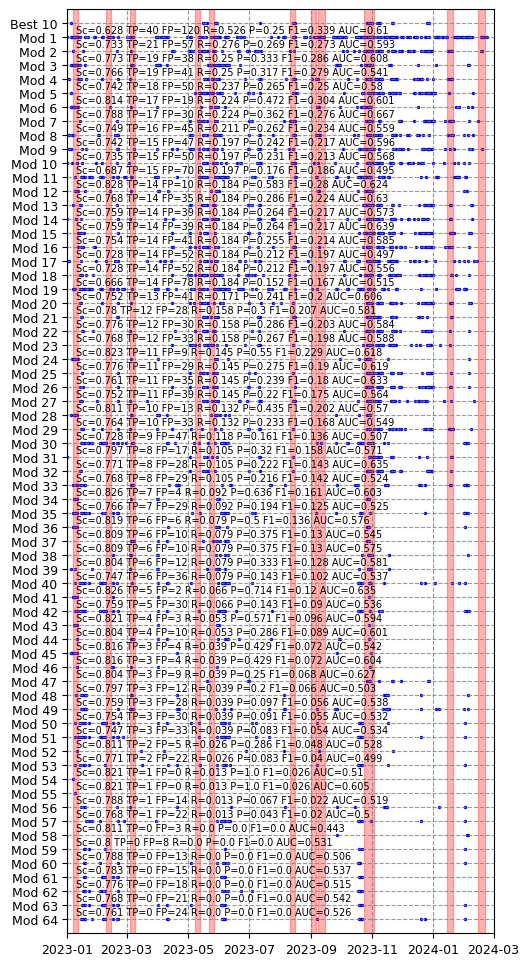

In [ ]:
#fig, axs = plt.subplots(1, figsize=(5.5,6))
#fig, axs = plt.subplots(1, figsize=(12,6))
fig, axs = plt.subplots(1, figsize=(5.5,12))

for indicesMod, mod in zip(indicesModelos, ordenModelos):
  dfTemp = df2[mod]
  filtro = dfTemp > 0.5
  Xplot = fechas2023[filtro]
  Yplot = np.ones(len(Xplot)) * indicesMod

  axs.scatter(Xplot, Yplot, label=mod, s=2, color='blue')

for rec in range(0, fechasRectangulo.shape[0]):
  deltaDias = fechasRectangulo[rec,1] - fechasRectangulo[rec,0]
  Xrec = fechasRectangulo[rec,0]
  Yrec = -2
  axs.add_patch(Rectangle(xy=(Xrec, Yrec),
                          width=(fechasRectangulo[rec,1] - fechasRectangulo[rec,0]),
                          height=len(ordenModelos)+5,
                          fill=True,
                          color ='red',
                          alpha=0.3)
                          )

for indicesMod, mod in zip(indicesModelos, ordenModelos):
  if mod != 'Best 10':
    score_mod = np.round(df_MetricasModelos.loc[mod,'Test_Score'], 3)
    tn_mod = int(df_MetricasModelos.loc[mod,'Test_TN'])
    fp_mod = int(df_MetricasModelos.loc[mod,'Test_FP'])
    fn_mod = int(df_MetricasModelos.loc[mod,'Test_FN'])
    tp_mod = int(df_MetricasModelos.loc[mod,'Test_TP'])
    recall_mod = np.round(df_MetricasModelos.loc[mod,'recall_score'], 3)
    precision_mod = np.round(df_MetricasModelos.loc[mod,'precision_score'], 3)
    f1_mod = np.round(df_MetricasModelos.loc[mod,'f1_score'], 3)
    auc_mod = np.round(df_MetricasModelos.loc[mod,'AUC'], 3)
    #textoModelo = f'Sc={score_mod} TP={tp_mod} FP={fp_mod} TN={tn_mod} FN={fn_mod} R={recall_mod} P={precision_mod} F1={f1_mod} AUC={auc_mod}'
    textoModelo = f'Sc={score_mod} TP={tp_mod} FP={fp_mod} R={recall_mod} P={precision_mod} F1={f1_mod} AUC={auc_mod}'
    axs.text(x= np.datetime64('2023-01-10'),
            y= indicesMod + 0.27,
            s= textoModelo,
            fontsize=7)

plt.yticks(np.arange(1, len(ordenModelos)+1), labels=labelTicksModels, fontsize=9)
plt.xticks(fontsize=9)
#plt.legend()
plt.grid(ls='--', color='grey', alpha=0.8)
plt.ylim(0, len(ordenModelos)+1)
plt.xlim(np.datetime64('2023-01-01'),
         np.datetime64('2024-03-01'))

plt.savefig((pathSaveFiguras + f'ModelosPrediccion_2023_texto.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

plt.show()

## Graph with text - Best 10 AUC

In [ ]:
# orden de los Modelos
ordenModelos = ['2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997',
                '2009_30dias_hl_420_5_int0_scr0.998',
                '2009_30dias_hl_2000_5_int1_scr1.0',
                '2009_6meses_hl_210_5_int0_scr1.0',
                '2009_30dias_boots_hl_1500_5_int0_scr1.0',
                '2009_30dias_boots_hl_420_5_int0_scr1.0',
                '2009_30dias_hl_1500_5_int0_scr1.0',
                '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996',
                '2009_30dias_boots_hl_2000_5_int0_scr0.999',
                '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0']
print(len(ordenModelos))
indicesModelos = np.arange(len(ordenModelos), 0, -1)
#indicesModelos = np.concatenate((np.array([28]), indicesModelos))
indicesModelos = np.concatenate((np.array([len(ordenModelos)+1]), indicesModelos))
indicesModelos

10


array([11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1])

In [ ]:
#df2['Best 10'] = df2[ordenModelos[0:10]].mean(axis=1)
#df2['Best 10'] = df2[ordenModelos[0:10]].median(axis=1)
df2['Best 10'] = df2[ordenModelos[0:10]].quantile([0.9], axis=1).to_numpy().reshape(-1,1)
#df2['Best 10'] = df2[ordenModelos].mean(axis=1)
#df2['Best 10'] = (df2[ordenModelos] >= 0.8).sum(axis=1)
#df2['Best 10'] = df2[ordenModelos].quantile([0.9], axis=1).to_numpy().reshape(-1,1)
df2

,Unnamed: 0,SD30_ses_a_hl_5_5_1_scr0.816,SD30_ses_ae_hl_2000_5_5_scr0.993,SD30_ses_ae_hl_1500_5_0_scr1.0,SD30_ses_ad_hl_210_5_4_scr1.0,SD30_ses_ab_hl_210_5_0_scr1.0,SD30_ses_ad_hl_420_5_2_scr1.0,SD30_ses_aa_hl_210_5_0_scr1.0,SD30_ses_a_hl_210_5_0_scr1.0,SD30_ses_ac_hl_210_5_0_scr1.0,...,2009_6meses_boots_hl_2000_5_int1_scr0.996,2009_6meses_boots_hl_210_105_53_27_13_5_int0_scr1.0,2009_6meses_boots_hl_210_5_int1_scr1.0,2009_6meses_boots_hl_420_210_105_53_27_5_int0_scr1.0,2009_6meses_boots_hl_420_5_int1_scr0.999,2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996,2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986,2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0,2009_6meses_hl_420_210_105_53_27_5_int0_scr1.0,Best 10
0,2023-01-01,0.088836,7.146377e-01,2.070931e-01,5.992044e-01,9.471241e-01,2.001586e-01,3.521941e-03,7.348634e-01,9.160763e-01,...,1.280723e-02,4.998812e-04,9.855298e-02,3.791868e-07,0.009026,4.516627e-05,0.608484,5.197103e-02,1.011580e-02,0.032540
1,2023-01-02,0.136922,1.841301e-02,2.193087e-02,2.414906e-05,7.228520e-02,2.748519e-02,6.707681e-05,8.024584e-05,7.090893e-02,...,5.627103e-06,1.560907e-07,2.644154e-06,1.484563e-07,0.000034,1.778227e-07,0.000877,4.328019e-06,2.390427e-09,0.004084
2,2023-01-03,0.183501,3.709442e-02,4.364226e-02,5.310918e-01,2.112219e-05,8.260185e-02,8.504711e-01,2.315768e-04,9.258438e-01,...,6.701110e-05,7.525794e-04,6.927515e-05,6.069881e-08,0.001184,1.151623e-06,0.010445,2.461871e-03,2.915939e-04,0.126204
3,2023-01-04,0.131997,9.246956e-03,3.671268e-05,2.494471e-04,5.879490e-05,2.845838e-03,4.912026e-04,3.881908e-05,4.093041e-03,...,1.674153e-03,1.037370e-02,1.180125e-03,4.400606e-06,0.002138,1.225962e-04,0.342028,4.541539e-03,3.526033e-01,0.023694
4,2023-01-05,0.205043,1.082087e-02,6.351598e-03,3.867781e-01,7.147498e-03,4.906221e-02,2.220217e-05,1.318687e-03,3.248471e-03,...,1.716379e-01,5.399644e-03,6.169951e-01,9.756573e-01,0.051827,4.563619e-02,0.731386,4.858494e-01,9.689910e-01,0.300950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
414,2024-02-19,0.016284,5.628584e-07,8.740085e-10,7.565106e-09,3.110701e-16,1.977021e-07,2.269347e-09,1.372064e-10,1.952983e-06,...,8.558904e-05,7.123236e-07,8.269465e-05,1.295954e-08,0.000059,6.857262e-03,0.731386,4.131595e-06,1.851898e-03,0.002848
415,2024-02-20,0.087500,9.654669e-05,8.992489e-07,9.373685e-07,4.948874e-08,1.291055e-05,1.376276e-09,1.781652e-11,1.267942e-07,...,6.651942e-06,5.345770e-08,1.922366e-04,5.644887e-09,0.000024,7.685493e-08,0.000018,8.075517e-06,1.550036e-09,0.001425
416,2024-02-21,0.052413,1.225750e-04,9.291795e-07,2.921971e-06,1.385028e-08,4.856440e-06,3.991239e-07,1.915773e-06,5.508312e-06,...,2.965347e-06,2.322687e-08,7.024623e-06,1.773430e-09,0.000006,2.241780e-11,0.000970,2.996463e-07,5.823763e-08,0.000707
417,2024-02-22,0.146943,3.097316e-03,3.432844e-05,1.361281e-03,3.599648e-01,6.430667e-04,4.766891e-10,2.497386e-05,2.427148e-04,...,4.938937e-07,6.847278e-08,1.305392e-06,2.879974e-09,0.000009,3.694713e-05,0.731386,1.098621e-05,9.787041e-13,0.010143


In [ ]:
fechas2023 = np.arange('2023-01-01', '2024-03-01', dtype='datetime64[D]')
fechas2023 = fechas2023[:-6]
fechas2023.shape

(419,)

In [ ]:
ytest = np.loadtxt(pathDatos+'SD30_y2024.txt')

len(ytest)

419

In [ ]:
# Sacar las fechas inicio fin de los rectangulos
fechaInicio = []
fechaFin = []

for i in range(0, len(ytest)-1):
  if (ytest[i] == 0) & (ytest[i+1] == 1):
    fechaInicio.append(fechas2023[i+1])
  if (ytest[i] == 1) & (ytest[i+1] == 0):
    fechaFin.append(fechas2023[i])
fechaInicio = np.array(fechaInicio).reshape(-1,1)
fechaFin = np.array(fechaFin).reshape(-1,1)
fechasRectangulo = np.concatenate((fechaInicio, fechaFin), axis=1)
fechasRectangulo

array([['2023-01-07', '2023-01-12'],
       ['2023-02-09', '2023-02-14'],
       ['2023-03-04', '2023-03-09'],
       ['2023-05-08', '2023-05-13'],
       ['2023-05-22', '2023-05-27'],
       ['2023-08-11', '2023-08-16'],
       ['2023-09-01', '2023-09-06'],
       ['2023-09-08', '2023-09-15'],
       ['2023-10-24', '2023-11-03'],
       ['2024-01-15', '2024-01-21'],
       ['2024-02-14', '2024-02-21']], dtype='datetime64[D]')

In [ ]:
labelTicksModels = ['Mod 24',
                    'Mod 25',
                    'Mod 12',
                    'Mod 47',
                    'Mod 13',
                    'Mod 26',
                    'Mod 41',
                    'Mod 32',
                    'Mod 15',
                    'Mod 7']
labelTicksModels.append('Best 10')
labelTicksModels

['Mod 24',
 'Mod 25',
 'Mod 12',
 'Mod 47',
 'Mod 13',
 'Mod 26',
 'Mod 41',
 'Mod 32',
 'Mod 15',
 'Mod 7',
 'Best 10']

In [ ]:
ordenModelos = ['Best 10'] + ordenModelos
ordenModelos

['Best 10',
 '2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997',
 '2009_30dias_hl_420_5_int0_scr0.998',
 '2009_30dias_hl_2000_5_int1_scr1.0',
 '2009_6meses_hl_210_5_int0_scr1.0',
 '2009_30dias_boots_hl_1500_5_int0_scr1.0',
 '2009_30dias_boots_hl_420_5_int0_scr1.0',
 '2009_30dias_hl_1500_5_int0_scr1.0',
 '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996',
 '2009_30dias_boots_hl_2000_5_int0_scr0.999',
 '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0']

In [ ]:
# Cargar csv TablaMetricasModelos_solo2023_v2
df_MetricasModelos = pd.read_csv('/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/df_TablaMetricasModelos_solo2023_v2.csv',
                                      sep=',', decimal='.')
df_MetricasModelos.index = df_MetricasModelos['Modelo']
df_MetricasModelos

,Modelo,Mod,V,Train_Score,Train_TN,Train_FP,Train_FN,Train_TP,Test_Score,Test_TN,Test_FP,Test_FN,Test_TP,Total TEST,recall_score,precision_score,f1_score,AUC
Modelo,,,,,,,,,,,,,,,,,,
2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986,2009_6meses_hl_2000_1000_500_250_125_5_int0_sc...,Mod 1,v6,0.986,3847.0,66.0,0.0,656.0,0.628,223.0,120.0,36.0,40.0,419.0,0.52632,0.25000,0.33898,0.610097
2009_30dias_hl_1500_750_375_188_94_5_int0_scr0.998,2009_30dias_hl_1500_750_375_188_94_5_int0_scr0...,Mod 2,v6,0.998,4023.0,10.0,0.0,686.0,0.733,286.0,57.0,55.0,21.0,419.0,0.27632,0.26923,0.27273,0.592642
2009_6meses_boots_hl_1500_5_int0_scr0.977,2009_6meses_boots_hl_1500_5_int0_scr0.977,Mod 3,v6,0.993,3913.0,0.0,30.0,626.0,0.773,305.0,38.0,57.0,19.0,419.0,0.25000,0.33333,0.28571,0.608332
SD30_ses_ad_hl_210_5_4_scr1.0,SD30_ses_ad_hl_210_5_4_scr1.0,Mod 4,v1,1.000,8157.0,2.0,0.0,2404.0,0.766,302.0,41.0,57.0,19.0,419.0,0.25000,0.31667,0.27941,0.540931
2009_30dias_hl_2000_1000_500_250_125_5_int0_scr1.0,2009_30dias_hl_2000_1000_500_250_125_5_int0_sc...,Mod 5,v6,1.000,4033.0,0.0,0.0,686.0,0.742,293.0,50.0,58.0,18.0,419.0,0.23684,0.26471,0.25000,0.580252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009_12meses_boots_hl_420_210_105_53_27_5_int0_scr1.0,2009_12meses_boots_hl_420_210_105_53_27_5_int0...,Mod 60,v6,1.000,3762.0,0.0,0.0,622.0,0.788,330.0,13.0,76.0,0.0,419.0,0.00000,0.00000,0.00000,0.506023
2009_12meses_hl_420_5_int0_scr1.0,2009_12meses_hl_420_5_int0_scr1.0,Mod 61,v4,1.000,3760.0,2.0,0.0,622.0,0.783,328.0,15.0,76.0,0.0,419.0,0.00000,0.00000,0.00000,0.537019
2009_12meses_boots_hl_210_105_53_27_13_5_int1_scr1.0,2009_12meses_boots_hl_210_105_53_27_13_5_int1_...,Mod 62,v6,1.000,3762.0,0.0,0.0,622.0,0.776,325.0,18.0,76.0,0.0,419.0,0.00000,0.00000,0.00000,0.515498


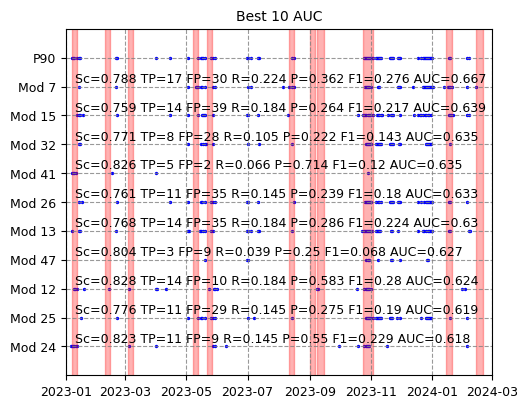

In [ ]:
#fig, axs = plt.subplots(1, figsize=(5.5,6))
#fig, axs = plt.subplots(1, figsize=(12,6))
fig, axs = plt.subplots(1, figsize=(5.5,4.5))

for indicesMod, mod in zip(indicesModelos, ordenModelos):
  dfTemp = df2[mod]
  filtro = dfTemp > 0.5
  Xplot = fechas2023[filtro]
  Yplot = np.ones(len(Xplot)) * indicesMod

  axs.scatter(Xplot, Yplot, label=mod, s=2, color='blue')

for rec in range(0, fechasRectangulo.shape[0]):
  deltaDias = fechasRectangulo[rec,1] - fechasRectangulo[rec,0]
  Xrec = fechasRectangulo[rec,0]
  Yrec = -2
  axs.add_patch(Rectangle(xy=(Xrec, Yrec),
                          width=(fechasRectangulo[rec,1] - fechasRectangulo[rec,0]),
                          height=len(ordenModelos)+5,
                          fill=True,
                          color ='red',
                          alpha=0.3)
                          )

for indicesMod, mod in zip(indicesModelos, ordenModelos):
  if mod != 'Best 10':
    score_mod = np.round(df_MetricasModelos.loc[mod,'Test_Score'], 3)
    tn_mod = int(df_MetricasModelos.loc[mod,'Test_TN'])
    fp_mod = int(df_MetricasModelos.loc[mod,'Test_FP'])
    fn_mod = int(df_MetricasModelos.loc[mod,'Test_FN'])
    tp_mod = int(df_MetricasModelos.loc[mod,'Test_TP'])
    recall_mod = np.round(df_MetricasModelos.loc[mod,'recall_score'], 3)
    precision_mod = np.round(df_MetricasModelos.loc[mod,'precision_score'], 3)
    f1_mod = np.round(df_MetricasModelos.loc[mod,'f1_score'], 3)
    auc_mod = np.round(df_MetricasModelos.loc[mod,'AUC'], 3)
    #textoModelo = f'Sc={score_mod} TP={tp_mod} FP={fp_mod} TN={tn_mod} FN={fn_mod} R={recall_mod} P={precision_mod} F1={f1_mod} AUC={auc_mod}'
    textoModelo = f'Sc={score_mod} TP={tp_mod} FP={fp_mod} R={recall_mod} P={precision_mod} F1={f1_mod} AUC={auc_mod}'
    axs.text(x= np.datetime64('2023-01-10'),
            y= indicesMod + 0.15,
            s= textoModelo,
            fontsize=9)
labelTicksModels[-1] = 'P90'
plt.yticks(np.arange(1, len(ordenModelos)+1), labels=labelTicksModels, fontsize=9)
plt.xticks(fontsize=9)
#plt.legend()
plt.grid(ls='--', color='grey', alpha=0.8)
plt.ylim(0, len(ordenModelos)+1)
plt.xlim(np.datetime64('2023-01-01'),
         np.datetime64('2024-03-01'))
plt.title('Best 10 AUC', fontsize=10)

plt.savefig((pathSaveFiguras + f'ModelosPrediccion_2023_best10_texto.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

plt.show()

## ROC AUC

In [ ]:
df_Prob = pd.read_csv(pathDatos+'df_Probabilidad_MLPClass.csv')
df_Prob['Unnamed: 0'] = pd.to_datetime(df_Prob['Unnamed: 0'], yearfirst=True)
df_Prob.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 419 entries, 0 to 418
Data columns (total 65 columns):
 #   Column                                                      Non-Null Count  Dtype         
---  ------                                                      --------------  -----         
 0   Unnamed: 0                                                  419 non-null    datetime64[ns]
 1   SD30_ses_a_hl_5_5_1_scr0.816                                419 non-null    float64       
 2   SD30_ses_ae_hl_2000_5_5_scr0.993                            419 non-null    float64       
 3   SD30_ses_ae_hl_1500_5_0_scr1.0                              419 non-null    float64       
 4   SD30_ses_ad_hl_210_5_4_scr1.0                               419 non-null    float64       
 5   SD30_ses_ab_hl_210_5_0_scr1.0                               419 non-null    float64       
 6   SD30_ses_ad_hl_420_5_2_scr1.0                               419 non-null    float64       
 7   SD30_ses_aa_hl_210_5_0_scr

In [ ]:
df_Prob

,Unnamed: 0,SD30_ses_a_hl_5_5_1_scr0.816,SD30_ses_ae_hl_2000_5_5_scr0.993,SD30_ses_ae_hl_1500_5_0_scr1.0,SD30_ses_ad_hl_210_5_4_scr1.0,SD30_ses_ab_hl_210_5_0_scr1.0,SD30_ses_ad_hl_420_5_2_scr1.0,SD30_ses_aa_hl_210_5_0_scr1.0,SD30_ses_a_hl_210_5_0_scr1.0,SD30_ses_ac_hl_210_5_0_scr1.0,...,2009_6meses_boots_hl_2000_1000_500_250_125_5_int3_scr0.982,2009_6meses_boots_hl_2000_5_int1_scr0.996,2009_6meses_boots_hl_210_105_53_27_13_5_int0_scr1.0,2009_6meses_boots_hl_210_5_int1_scr1.0,2009_6meses_boots_hl_420_210_105_53_27_5_int0_scr1.0,2009_6meses_boots_hl_420_5_int1_scr0.999,2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996,2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986,2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0,2009_6meses_hl_420_210_105_53_27_5_int0_scr1.0
0,2023-01-01,0.088836,7.146377e-01,2.070931e-01,5.992044e-01,9.471241e-01,2.001586e-01,3.521941e-03,7.348634e-01,9.160763e-01,...,0.259884,1.280723e-02,4.998812e-04,9.855298e-02,3.791868e-07,0.009026,4.516627e-05,0.608484,5.197103e-02,1.011580e-02
1,2023-01-02,0.136922,1.841301e-02,2.193087e-02,2.414906e-05,7.228520e-02,2.748519e-02,6.707681e-05,8.024584e-05,7.090893e-02,...,0.259884,5.627103e-06,1.560907e-07,2.644154e-06,1.484563e-07,0.000034,1.778227e-07,0.000877,4.328019e-06,2.390427e-09
2,2023-01-03,0.183501,3.709442e-02,4.364226e-02,5.310918e-01,2.112219e-05,8.260185e-02,8.504711e-01,2.315768e-04,9.258438e-01,...,0.259884,6.701110e-05,7.525794e-04,6.927515e-05,6.069881e-08,0.001184,1.151623e-06,0.010445,2.461871e-03,2.915939e-04
3,2023-01-04,0.131997,9.246956e-03,3.671268e-05,2.494471e-04,5.879490e-05,2.845838e-03,4.912026e-04,3.881908e-05,4.093041e-03,...,0.259884,1.674153e-03,1.037370e-02,1.180125e-03,4.400606e-06,0.002138,1.225962e-04,0.342028,4.541539e-03,3.526033e-01
4,2023-01-05,0.205043,1.082087e-02,6.351598e-03,3.867781e-01,7.147498e-03,4.906221e-02,2.220217e-05,1.318687e-03,3.248471e-03,...,0.259884,1.716379e-01,5.399644e-03,6.169951e-01,9.756573e-01,0.051827,4.563619e-02,0.731386,4.858494e-01,9.689910e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
414,2024-02-19,0.016284,5.628584e-07,8.740085e-10,7.565106e-09,3.110701e-16,1.977021e-07,2.269347e-09,1.372064e-10,1.952983e-06,...,0.259884,8.558904e-05,7.123236e-07,8.269465e-05,1.295954e-08,0.000059,6.857262e-03,0.731386,4.131595e-06,1.851898e-03
415,2024-02-20,0.087500,9.654669e-05,8.992489e-07,9.373685e-07,4.948874e-08,1.291055e-05,1.376276e-09,1.781652e-11,1.267942e-07,...,0.259884,6.651942e-06,5.345770e-08,1.922366e-04,5.644887e-09,0.000024,7.685493e-08,0.000018,8.075517e-06,1.550036e-09
416,2024-02-21,0.052413,1.225750e-04,9.291795e-07,2.921971e-06,1.385028e-08,4.856440e-06,3.991239e-07,1.915773e-06,5.508312e-06,...,0.259884,2.965347e-06,2.322687e-08,7.024623e-06,1.773430e-09,0.000006,2.241780e-11,0.000970,2.996463e-07,5.823763e-08
417,2024-02-22,0.146943,3.097316e-03,3.432844e-05,1.361281e-03,3.599648e-01,6.430667e-04,4.766891e-10,2.497386e-05,2.427148e-04,...,0.259884,4.938937e-07,6.847278e-08,1.305392e-06,2.879974e-09,0.000009,3.694713e-05,0.731386,1.098621e-05,9.787041e-13


In [ ]:
# Cargar el ytest de la V1 hasta 2024 para poder hacer los rectangulos
ytest = np.loadtxt(pathDatos+'SD30_y2024.txt')

len(ytest)

419

In [ ]:
# Cargar csv TablaMetricasModelos_solo2023_v2
df_TablaMetricasModelos = pd.read_csv('/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/TablaMetricasModelos_solo2023_v2.csv',
                                      sep=';', decimal=',')
df_TablaMetricasModelos

,Modelo,Mod,V,Train_Score,Train_TN,Train_FP,Train_FN,Train_TP,Test_Score,Test_TN,Test_FP,Test_FN,Test_TP,Total TEST,recall_score,precision_score,f1_score
0,2009_6meses_hl_2000_1000_500_250_125_5_int0_sc...,Mod 1,v6,0.986,3847.0,66.0,0.0,656.0,0.628,223.0,120.0,36.0,40.0,419.0,0.52632,0.25000,0.33898
1,2009_30dias_hl_1500_750_375_188_94_5_int0_scr0...,Mod 2,v6,0.998,4023.0,10.0,0.0,686.0,0.733,286.0,57.0,55.0,21.0,419.0,0.27632,0.26923,0.27273
2,2009_6meses_boots_hl_1500_5_int0_scr0.977,Mod 3,v6,0.993,3913.0,0.0,30.0,626.0,0.773,305.0,38.0,57.0,19.0,419.0,0.25000,0.33333,0.28571
3,SD30_ses_ad_hl_210_5_4_scr1.0,Mod 4,v1,1.000,8157.0,2.0,0.0,2404.0,0.766,302.0,41.0,57.0,19.0,419.0,0.25000,0.31667,0.27941
4,2009_30dias_hl_2000_1000_500_250_125_5_int0_sc...,Mod 5,v6,1.000,4033.0,0.0,0.0,686.0,0.742,293.0,50.0,58.0,18.0,419.0,0.23684,0.26471,0.25000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2009_12meses_boots_hl_420_210_105_53_27_5_int0...,Mod 60,v6,1.000,3762.0,0.0,0.0,622.0,0.788,330.0,13.0,76.0,0.0,419.0,0.00000,0.00000,0.00000
60,2009_12meses_hl_420_5_int0_scr1.0,Mod 61,v4,1.000,3760.0,2.0,0.0,622.0,0.783,328.0,15.0,76.0,0.0,419.0,0.00000,0.00000,0.00000
61,2009_12meses_boots_hl_210_105_53_27_13_5_int1_...,Mod 62,v6,1.000,3762.0,0.0,0.0,622.0,0.776,325.0,18.0,76.0,0.0,419.0,0.00000,0.00000,0.00000
62,2009_12meses_hl_1500_5_int1_scr0.995,Mod 63,v4,0.995,3739.0,23.0,0.0,622.0,0.768,322.0,21.0,76.0,0.0,419.0,0.00000,0.00000,0.00000


In [ ]:
ordenModelos = ['2009_6meses_hl_2000_1000_500_250_125_5_int0_scr0.986',
                '2009_30dias_hl_1500_750_375_188_94_5_int0_scr0.998',
                '2009_6meses_boots_hl_1500_5_int0_scr0.977',
                'SD30_ses_ad_hl_210_5_4_scr1.0',
                '2009_30dias_hl_2000_1000_500_250_125_5_int0_scr1.0',
                '2009_6meses_hl_420_210_105_53_27_5_int0_scr1.0',
                '2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997',
                'SD30_ses_aa_hl_210_5_0_scr1.0',
                '2009_30dias_boots_hl_210_105_53_27_13_5_int0_scr0.996',
                'SD30_ses_a_hl_210_5_0_scr1.0',
                '2009_12meses_boots_hl_2000_5_int1_scr0.971',
                '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996',
                '2009_30dias_boots_hl_420_5_int0_scr1.0',
                'SD30_ses_ab_hl_210_5_0_scr1.0',
                '2009_30dias_hl_420_5_int0_scr0.998',
                '2009_30dias_hl_210_5_int0_scr1.0',
                'SD30_ses_ac_hl_210_5_0_scr1.0',
                '2009_30dias_hl_420_210_105_53_27_5_int0_scr1.0',
                '2009_12meses_boots_hl_420_5_int0_scr0.982',
                '2009_30dias_boots_hl_210_5_int0_scr1.0',
                'SD30_ses_ae_hl_1500_5_0_scr1.0',
                '2009_30dias_boots_hl_2000_1000_500_250_125_5_int1_scr0.997',
                '2009_30dias_hl_210_105_53_27_13_5_int0_scr0.999',
                '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0',
                '2009_30dias_boots_hl_2000_5_int0_scr0.999',
                '2009_30dias_boots_hl_1500_5_int0_scr1.0',
                'SD30_ses_ad_hl_420_5_2_scr1.0',
                '2009_6meses_boots_hl_210_5_int1_scr1.0',
                '2009_30dias_boots_hl_1500_750_375_188_94_5_int0_scr0.998',
                '2009_12meses_boots_hl_1500_750_375_188_94_5_int1_scr0.992',
                'SD30_ses_ae_hl_2000_5_5_scr0.993',
                '2009_30dias_hl_2000_5_int1_scr1.0',
                '12meses__hl_210_5_int0_scr0.999',
                '2009_6meses_boots_hl_2000_5_int1_scr0.996',
                '2009_12meses_hl_1500_750_375_188_94_5_int0_scr0.999',
                '2009_6meses_boots_hl_2000_1000_500_250_125_5_int0_scr1.0',
                '2009_6meses_boots_hl_2000_1000_500_250_125_5_int3_scr0.982',
                '2009_6meses_boots_hl_210_105_53_27_13_5_int0_scr1.0',
                '2009_6meses_boots_hl_420_210_105_53_27_5_int0_scr1.0',
                '2009_12meses_hl_210_105_53_27_13_5_int0_scr1.0',
                '2009_6meses_hl_210_5_int0_scr1.0',
                '2009_12meses_hl_2000_1000_500_250_125_5_int1_scr1.0',
                '2009_6meses_boots_hl_420_5_int1_scr0.999',
                '2009_6meses_boots_hl_1500_750_375_188_94_5_int4_scr1.0',
                '6meses__hl_210_5_int0_scr1.0',
                '2009_6meses_hl_420_5_int0_scr1.0',
                '2009_30dias_hl_1500_5_int0_scr1.0',
                '12meses__hl_1500_5_int2_scr0.996',
                '12meses__hl_420_5_int2_scr0.957',
                '2009_12meses_hl_2000_5_int0_scr0.987',
                '2009_12meses_hl_210_5_int0_scr1.0',
                'SD30_ses_a_hl_5_5_1_scr0.816',
                '2009_12meses_hl_420_210_105_53_27_5_int0_scr1.0',
                '6meses__hl_2000_5_int0_scr0.999',
                '2009_6meses_hl_1500_5_int1_scr1.0',
                '12meses__hl_210_5_int1_scr0.996',
                '2009_12meses_boots_hl_2000_1000_500_250_125_5_int1_scr1.0',
                '6meses__hl_210_5_int1_scr0.996',
                '2009_12meses_boots_hl_210_5_int0_scr0.995',
                '2009_12meses_boots_hl_420_210_105_53_27_5_int0_scr1.0',
                '2009_12meses_hl_420_5_int0_scr1.0',
                '2009_12meses_boots_hl_210_105_53_27_13_5_int1_scr1.0',
                '2009_12meses_hl_1500_5_int1_scr0.995',
                '2009_12meses_boots_hl_1500_5_int4_scr0.993',]

0.6100966702470463


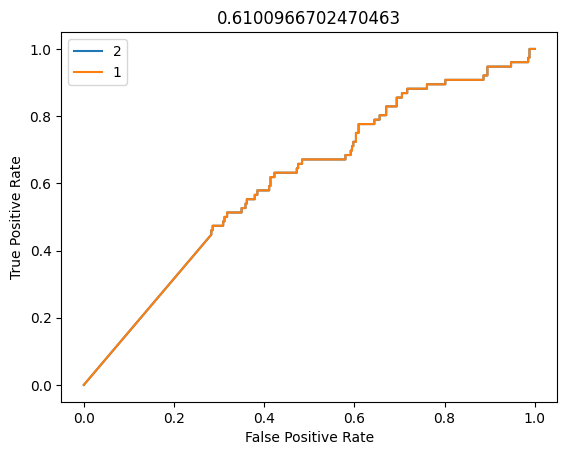

In [ ]:
y_score = df_Prob[ordenModelos[0]]

auc_score = roc_auc_score(ytest, y_score)
print(auc_score)


fpr, tpr, _ = roc_curve(ytest, y_score)
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot(label= '2')
plt.plot(fpr, tpr, label='1')
plt.title(auc_score)
plt.legend()
plt.show()

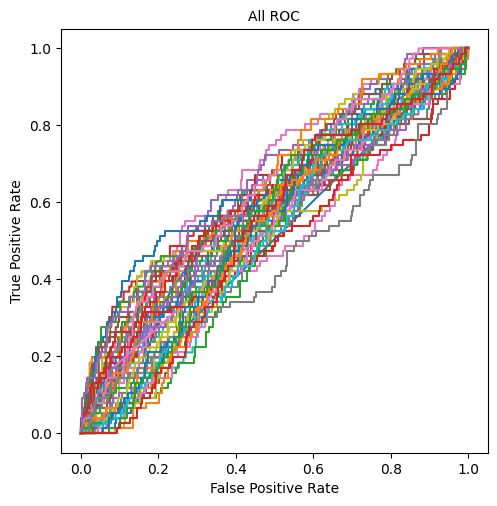

In [ ]:
auc_list = []

plt.figure(figsize=(5.5,5.5))
for i in ordenModelos:
  y_score = df_Prob[i]
  auc_score = roc_auc_score(ytest, y_score)
  #print(auc_score)
  auc_list.append(auc_score)

  fpr, tpr, _ = roc_curve(ytest, y_score)
  #roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot(label= i)
  plt.plot(fpr, tpr, label=i)


plt.title('All ROC', fontsize=10)
plt.ylabel('True Positive Rate', fontsize=10)
plt.xlabel('False Positive Rate', fontsize=10)
#plt.legend()

plt.savefig((pathSaveFiguras + f'all_AUC.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()

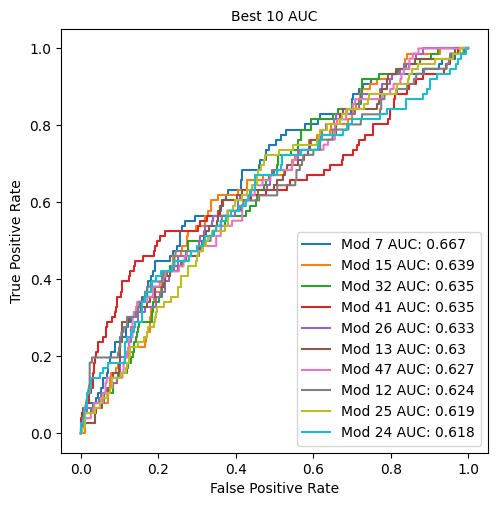

In [ ]:
best10_auc = ['2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997',
              '2009_30dias_hl_420_5_int0_scr0.998',
              '2009_30dias_hl_2000_5_int1_scr1.0',
              '2009_6meses_hl_210_5_int0_scr1.0',
              '2009_30dias_boots_hl_1500_5_int0_scr1.0',
              '2009_30dias_boots_hl_420_5_int0_scr1.0',
              '2009_30dias_hl_1500_5_int0_scr1.0',
              '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996',
              '2009_30dias_boots_hl_2000_5_int0_scr0.999',
              '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0']


lables_auc = {'2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997': 'Mod 7',
              '2009_30dias_hl_420_5_int0_scr0.998': 'Mod 15',
              '2009_30dias_hl_2000_5_int1_scr1.0': 'Mod 32',
              '2009_6meses_hl_210_5_int0_scr1.0': 'Mod 41',
              '2009_30dias_boots_hl_1500_5_int0_scr1.0': 'Mod 26',
              '2009_30dias_boots_hl_420_5_int0_scr1.0': 'Mod 13',
              '2009_30dias_hl_1500_5_int0_scr1.0': 'Mod 47',
              '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996': 'Mod 12',
              '2009_30dias_boots_hl_2000_5_int0_scr0.999': 'Mod 25',
              '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0': 'Mod 24'}

plt.figure(figsize=(5.5,5.5))
for i in best10_auc:
  y_score = df_Prob[i]
  auc_score = roc_auc_score(ytest, y_score)
  #print(auc_score)
  auc_score = np.round(auc_score, 3)

  fpr, tpr, _ = roc_curve(ytest, y_score)
  #roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot(label= i)
  plt.plot(fpr, tpr, label=f'{lables_auc[i]} AUC: {auc_score}')

plt.title('Best 10 AUC', fontsize=10)
plt.ylabel('True Positive Rate', fontsize=10)
plt.xlabel('False Positive Rate', fontsize=10)
plt.legend(fontsize=10)

plt.savefig((pathSaveFiguras + f'best10_AUC.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()

## 2 en 1

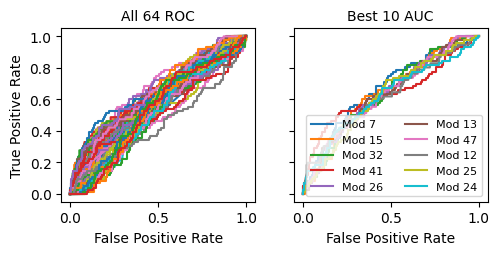

In [ ]:

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(5.5,2.25), sharey=True)

for i in ordenModelos:
  y_score = df_Prob[i]
  auc_score = roc_auc_score(ytest, y_score)

  fpr, tpr, _ = roc_curve(ytest, y_score)
  #roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot(label= i)
  ax[0].plot(fpr, tpr, label=i)

best10_auc = ['2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997',
              '2009_30dias_hl_420_5_int0_scr0.998',
              '2009_30dias_hl_2000_5_int1_scr1.0',
              '2009_6meses_hl_210_5_int0_scr1.0',
              '2009_30dias_boots_hl_1500_5_int0_scr1.0',
              '2009_30dias_boots_hl_420_5_int0_scr1.0',
              '2009_30dias_hl_1500_5_int0_scr1.0',
              '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996',
              '2009_30dias_boots_hl_2000_5_int0_scr0.999',
              '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0']


lables_auc = {'2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997': 'Mod 7',
              '2009_30dias_hl_420_5_int0_scr0.998': 'Mod 15',
              '2009_30dias_hl_2000_5_int1_scr1.0': 'Mod 32',
              '2009_6meses_hl_210_5_int0_scr1.0': 'Mod 41',
              '2009_30dias_boots_hl_1500_5_int0_scr1.0': 'Mod 26',
              '2009_30dias_boots_hl_420_5_int0_scr1.0': 'Mod 13',
              '2009_30dias_hl_1500_5_int0_scr1.0': 'Mod 47',
              '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996': 'Mod 12',
              '2009_30dias_boots_hl_2000_5_int0_scr0.999': 'Mod 25',
              '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0': 'Mod 24'}

for i in best10_auc:
  y_score = df_Prob[i]
  auc_score = roc_auc_score(ytest, y_score)
  #print(auc_score)
  auc_score = np.round(auc_score, 3)

  fpr, tpr, _ = roc_curve(ytest, y_score)
  #roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot(label= i)
  ax[1].plot(fpr, tpr, label=f'{lables_auc[i]}')


ax[0].set_title('All 64 ROC', fontsize=10)
ax[0].set_ylabel('True Positive Rate', fontsize=10)
ax[0].set_xlabel('False Positive Rate', fontsize=10)
#plt.legend()

ax[1].set_title('Best 10 AUC', fontsize=10)
#plt.ylabel('True Positive Rate', fontsize=10)
ax[1].set_xlabel('False Positive Rate', fontsize=10)
ax[1].legend(fontsize=8, ncol=2)

#plt.tight_layout()
plt.savefig((pathSaveFiguras + f'ROC_AUC_v1.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()

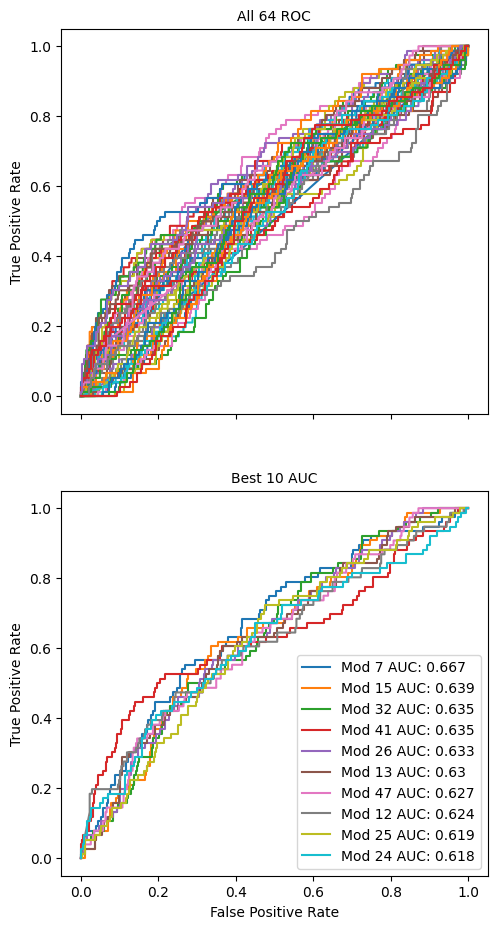

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(5.5, 11), sharex=True)

for i in ordenModelos:
  y_score = df_Prob[i]
  auc_score = roc_auc_score(ytest, y_score)

  fpr, tpr, _ = roc_curve(ytest, y_score)
  #roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot(label= i)
  ax[0].plot(fpr, tpr, label=i)

best10_auc = ['2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997',
              '2009_30dias_hl_420_5_int0_scr0.998',
              '2009_30dias_hl_2000_5_int1_scr1.0',
              '2009_6meses_hl_210_5_int0_scr1.0',
              '2009_30dias_boots_hl_1500_5_int0_scr1.0',
              '2009_30dias_boots_hl_420_5_int0_scr1.0',
              '2009_30dias_hl_1500_5_int0_scr1.0',
              '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996',
              '2009_30dias_boots_hl_2000_5_int0_scr0.999',
              '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0']


lables_auc = {'2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997': 'Mod 7',
              '2009_30dias_hl_420_5_int0_scr0.998': 'Mod 15',
              '2009_30dias_hl_2000_5_int1_scr1.0': 'Mod 32',
              '2009_6meses_hl_210_5_int0_scr1.0': 'Mod 41',
              '2009_30dias_boots_hl_1500_5_int0_scr1.0': 'Mod 26',
              '2009_30dias_boots_hl_420_5_int0_scr1.0': 'Mod 13',
              '2009_30dias_hl_1500_5_int0_scr1.0': 'Mod 47',
              '2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996': 'Mod 12',
              '2009_30dias_boots_hl_2000_5_int0_scr0.999': 'Mod 25',
              '2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0': 'Mod 24'}

for i in best10_auc:
  y_score = df_Prob[i]
  auc_score = roc_auc_score(ytest, y_score)
  #print(auc_score)
  auc_score = np.round(auc_score, 3)

  fpr, tpr, _ = roc_curve(ytest, y_score)
  #roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot(label= i)
  ax[1].plot(fpr, tpr, label=f'{lables_auc[i]} AUC: {auc_score}')


ax[0].set_title('All 64 ROC', fontsize=10)
ax[0].set_ylabel('True Positive Rate', fontsize=10)
#ax[0].set_xlabel('False Positive Rate', fontsize=10)
#plt.legend()

ax[1].set_title('Best 10 AUC', fontsize=10)
ax[1].set_ylabel('True Positive Rate', fontsize=10)
ax[1].set_xlabel('False Positive Rate', fontsize=10)
ax[1].legend(fontsize=10)

plt.savefig((pathSaveFiguras + f'ROC_AUC_v2.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

plt.show()

In [ ]:
(df_TablaMetricasModelos['Modelo'] == ordenModelos).sum()

64

In [ ]:
df_TablaMetricasModelos['AUC'] = auc_list
df_TablaMetricasModelos

,Modelo,Mod,V,Train_Score,Train_TN,Train_FP,Train_FN,Train_TP,Test_Score,Test_TN,Test_FP,Test_FN,Test_TP,Total TEST,recall_score,precision_score,f1_score,AUC
0,2009_6meses_hl_2000_1000_500_250_125_5_int0_sc...,Mod 1,v6,0.986,3847.0,66.0,0.0,656.0,0.628,223.0,120.0,36.0,40.0,419.0,0.52632,0.25000,0.33898,0.610097
1,2009_30dias_hl_1500_750_375_188_94_5_int0_scr0...,Mod 2,v6,0.998,4023.0,10.0,0.0,686.0,0.733,286.0,57.0,55.0,21.0,419.0,0.27632,0.26923,0.27273,0.592642
2,2009_6meses_boots_hl_1500_5_int0_scr0.977,Mod 3,v6,0.993,3913.0,0.0,30.0,626.0,0.773,305.0,38.0,57.0,19.0,419.0,0.25000,0.33333,0.28571,0.608332
3,SD30_ses_ad_hl_210_5_4_scr1.0,Mod 4,v1,1.000,8157.0,2.0,0.0,2404.0,0.766,302.0,41.0,57.0,19.0,419.0,0.25000,0.31667,0.27941,0.540931
4,2009_30dias_hl_2000_1000_500_250_125_5_int0_sc...,Mod 5,v6,1.000,4033.0,0.0,0.0,686.0,0.742,293.0,50.0,58.0,18.0,419.0,0.23684,0.26471,0.25000,0.580252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2009_12meses_boots_hl_420_210_105_53_27_5_int0...,Mod 60,v6,1.000,3762.0,0.0,0.0,622.0,0.788,330.0,13.0,76.0,0.0,419.0,0.00000,0.00000,0.00000,0.506023
60,2009_12meses_hl_420_5_int0_scr1.0,Mod 61,v4,1.000,3760.0,2.0,0.0,622.0,0.783,328.0,15.0,76.0,0.0,419.0,0.00000,0.00000,0.00000,0.537019
61,2009_12meses_boots_hl_210_105_53_27_13_5_int1_...,Mod 62,v6,1.000,3762.0,0.0,0.0,622.0,0.776,325.0,18.0,76.0,0.0,419.0,0.00000,0.00000,0.00000,0.515498
62,2009_12meses_hl_1500_5_int1_scr0.995,Mod 63,v4,0.995,3739.0,23.0,0.0,622.0,0.768,322.0,21.0,76.0,0.0,419.0,0.00000,0.00000,0.00000,0.541622


In [ ]:
df_TablaMetricasModelos.to_csv('/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/df_TablaMetricasModelos_solo2023_v2.csv', index=False)

# Maps

The two figures for the years to be considered are:

1994-1998-2002-2006

2010-2014-2018-2023

In [ ]:
# Se carga el catalogo de los eventos de prof mayores a 100 km
df_todos = pd.read_csv(pathDatos+'df_Total_1994_2024.csv')
df_todos['Date-Time'] = pd.to_datetime(df_todos['Date-Time'], yearfirst=True)
df_todos.dropna(inplace=True)
df_todos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 148910 entries, 0 to 148985
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   FECHA                   148910 non-null  object        
 1   HORA_UTC                148910 non-null  object        
 2   LATITUD (grados)        148910 non-null  float64       
 3   LONGITUD (grados)       148910 non-null  float64       
 4   PROFUNDIDAD (Km)        148910 non-null  float64       
 5   MAGNITUD Ml             148910 non-null  float64       
 6   ERROR LATITUD (Km)      148910 non-null  float64       
 7   ERROR LONGITUD (Km)     148910 non-null  float64       
 8   ERROR PROFUNDIDAD (Km)  148910 non-null  float64       
 9   Date-Time               148910 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(7), object(2)
memory usage: 12.5+ MB


In [ ]:
df_todos

,FECHA,HORA_UTC,LATITUD (grados),LONGITUD (grados),PROFUNDIDAD (Km),MAGNITUD Ml,ERROR LATITUD (Km),ERROR LONGITUD (Km),ERROR PROFUNDIDAD (Km),Date-Time
0,1994-01-01,00:06:37,6.839,-72.950,158.60,3.7,15.800,17.200,19.50,1994-01-01 00:06:37
1,1994-01-01,08:17:30,6.877,-72.912,166.60,4.1,14.700,19.900,16.20,1994-01-01 08:17:30
2,1994-01-02,01:55:17,6.806,-72.898,150.00,3.0,12.800,15.800,17.80,1994-01-02 01:55:17
3,1994-01-02,04:49:35,6.898,-73.095,150.00,3.1,8.300,8.700,11.30,1994-01-02 04:49:35
4,1994-01-02,05:55:47,6.736,-73.201,150.00,5.3,17.100,18.000,24.70,1994-01-02 05:55:47
...,...,...,...,...,...,...,...,...,...,...
148981,2024-02-29,17:14:57,6.763,-73.115,151.41,1.9,2.333,2.333,3.30,2024-02-29 17:14:57
148982,2024-02-29,19:34:58,6.783,-73.103,133.05,2.1,5.340,6.709,6.36,2024-02-29 19:34:58
148983,2024-02-29,21:21:08,6.809,-73.092,149.00,1.9,3.536,3.536,2.30,2024-02-29 21:21:08
148984,2024-02-29,22:13:41,6.769,-73.076,146.99,2.9,1.851,3.142,4.15,2024-02-29 22:13:41


In [ ]:
df_todos.describe().round(2)

,LATITUD (grados),LONGITUD (grados),PROFUNDIDAD (Km),MAGNITUD Ml,ERROR LATITUD (Km),ERROR LONGITUD (Km),ERROR PROFUNDIDAD (Km),Date-Time
count,148986.00,148986.00,148986.00,148986.00,148910.00,148910.00,148910.00,148986
mean,6.80,-73.13,143.26,2.05,4.63,6.88,7.08,2014-04-05 20:58:52.822003200
min,6.50,-73.40,-4.88,0.10,0.00,0.00,0.00,1994-01-01 00:06:37
25%,6.77,-73.17,140.00,1.60,2.62,3.10,4.20,2009-12-21 02:16:42.500000
50%,6.80,-73.14,144.60,1.90,4.10,5.17,6.50,2016-01-08 00:29:42.500000
75%,6.82,-73.10,148.50,2.40,5.80,8.70,8.85,2020-05-23 18:21:52.500000
max,7.10,-72.80,436.50,6.30,99.90,99.90,99.90,2024-02-29 23:17:12
std,0.05,0.08,12.08,0.62,3.25,6.16,4.97,NaN


In [ ]:
df_todos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148986 entries, 0 to 148985
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   FECHA                   148986 non-null  object        
 1   HORA_UTC                148986 non-null  object        
 2   LATITUD (grados)        148986 non-null  float64       
 3   LONGITUD (grados)       148986 non-null  float64       
 4   PROFUNDIDAD (Km)        148986 non-null  float64       
 5   MAGNITUD Ml             148986 non-null  float64       
 6   ERROR LATITUD (Km)      148910 non-null  float64       
 7   ERROR LONGITUD (Km)     148910 non-null  float64       
 8   ERROR PROFUNDIDAD (Km)  148910 non-null  float64       
 9   Date-Time               148986 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(7), object(2)
memory usage: 11.4+ MB


In [ ]:
df_todos.dropna(inplace=True)

In [ ]:
df_todos

,FECHA,HORA_UTC,LATITUD (grados),LONGITUD (grados),PROFUNDIDAD (Km),MAGNITUD Ml,ERROR LATITUD (Km),ERROR LONGITUD (Km),ERROR PROFUNDIDAD (Km),Date-Time
0,1994-01-01,00:06:37,6.839,-72.950,158.60,3.7,15.800,17.200,19.50,1994-01-01 00:06:37
1,1994-01-01,08:17:30,6.877,-72.912,166.60,4.1,14.700,19.900,16.20,1994-01-01 08:17:30
2,1994-01-02,01:55:17,6.806,-72.898,150.00,3.0,12.800,15.800,17.80,1994-01-02 01:55:17
3,1994-01-02,04:49:35,6.898,-73.095,150.00,3.1,8.300,8.700,11.30,1994-01-02 04:49:35
4,1994-01-02,05:55:47,6.736,-73.201,150.00,5.3,17.100,18.000,24.70,1994-01-02 05:55:47
...,...,...,...,...,...,...,...,...,...,...
148981,2024-02-29,17:14:57,6.763,-73.115,151.41,1.9,2.333,2.333,3.30,2024-02-29 17:14:57
148982,2024-02-29,19:34:58,6.783,-73.103,133.05,2.1,5.340,6.709,6.36,2024-02-29 19:34:58
148983,2024-02-29,21:21:08,6.809,-73.092,149.00,1.9,3.536,3.536,2.30,2024-02-29 21:21:08
148984,2024-02-29,22:13:41,6.769,-73.076,146.99,2.9,1.851,3.142,4.15,2024-02-29 22:13:41


In [ ]:
df_todos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 148910 entries, 0 to 148985
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   FECHA                   148910 non-null  object        
 1   HORA_UTC                148910 non-null  object        
 2   LATITUD (grados)        148910 non-null  float64       
 3   LONGITUD (grados)       148910 non-null  float64       
 4   PROFUNDIDAD (Km)        148910 non-null  float64       
 5   MAGNITUD Ml             148910 non-null  float64       
 6   ERROR LATITUD (Km)      148910 non-null  float64       
 7   ERROR LONGITUD (Km)     148910 non-null  float64       
 8   ERROR PROFUNDIDAD (Km)  148910 non-null  float64       
 9   Date-Time               148910 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(7), object(2)
memory usage: 12.5+ MB


## 1994-1998-2002-2006

## Geopandas

In [ ]:
puntosSismos = gpd.points_from_xy( df_todos[(df_todos['PROFUNDIDAD (Km)'] >= 100) & (df_todos['MAGNITUD Ml']>=2.5)]['LONGITUD (grados)'],
                                  df_todos[(df_todos['PROFUNDIDAD (Km)'] >= 100) & (df_todos['MAGNITUD Ml']>=2.5)]['LATITUD (grados)'],
                                  crs='epsg:4326')
puntosSismos

<GeometryArray>
[ <POINT (-72.95 6.839)>, <POINT (-72.912 6.877)>, <POINT (-72.898 6.806)>,
 <POINT (-73.095 6.898)>, <POINT (-73.201 6.736)>, <POINT (-73.016 6.713)>,
 <POINT (-73.039 6.813)>, <POINT (-73.023 6.786)>, <POINT (-73.135 7.053)>,
 <POINT (-73.049 6.783)>,
 ...
 <POINT (-73.162 6.763)>, <POINT (-73.153 6.803)>, <POINT (-73.166 6.803)>,
  <POINT (-73.192 6.82)>, <POINT (-73.179 6.801)>, <POINT (-73.179 6.776)>,
 <POINT (-73.196 6.778)>, <POINT (-73.138 6.772)>, <POINT (-73.076 6.769)>,
 <POINT (-73.124 6.773)>]
Length: 31975, dtype: geometry

<Axes: >

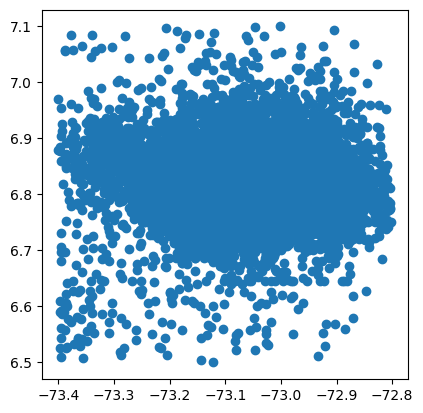

In [ ]:
gdf = gpd.GeoDataFrame(data= df_todos[(df_todos['PROFUNDIDAD (Km)'] >= 100) & (df_todos['MAGNITUD Ml']>=2.5)], geometry=puntosSismos)
gdf.plot()

<Axes: >

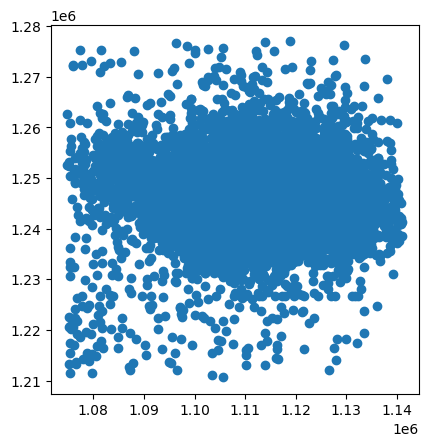

In [ ]:
gdf.to_crs(epsg='3116', inplace=True)
gdf.plot()

In [ ]:
gdf.get_coordinates()

,x,y
0,1.124634e+06,1.248167e+06
1,1.128825e+06,1.252380e+06
2,1.130392e+06,1.244531e+06
3,1.108591e+06,1.254658e+06
4,1.096907e+06,1.236717e+06
...,...,...
148967,1.099331e+06,1.241146e+06
148977,1.097451e+06,1.241363e+06
148979,1.103865e+06,1.240712e+06
148984,1.110721e+06,1.240394e+06


In [ ]:
centrosCirculo = gdf.get_coordinates().to_numpy()
centrosCirculo

array([[1124634.32230289, 1248167.01453072],
       [1128825.17505919, 1252380.30097935],
       [1130392.08861771, 1244530.57363236],
       ...,
       [1103865.26564821, 1240711.87112492],
       [1110720.88755639, 1240393.74558709],
       [1105412.927113  , 1240825.49134881]])

In [ ]:
circulos = points(centrosCirculo)
circulos

array([<POINT (1124634.322 1248167.015)>,
       <POINT (1128825.175 1252380.301)>,
       <POINT (1130392.089 1244530.574)>, ...,
       <POINT (1103865.266 1240711.871)>,
       <POINT (1110720.888 1240393.746)>,
       <POINT (1105412.927 1240825.491)>], dtype=object)

In [ ]:
escalaX = df_todos[(df_todos['PROFUNDIDAD (Km)'] >= 100) & (df_todos['MAGNITUD Ml']>=2.5)]['ERROR LONGITUD (Km)'].to_numpy() * 1000
escalaY = df_todos[(df_todos['PROFUNDIDAD (Km)'] >= 100) & (df_todos['MAGNITUD Ml']>=2.5)]['ERROR LATITUD (Km)'].to_numpy() * 1000


In [ ]:
escalaX

array([17200., 19900., 15800., ...,  3885.,  3142.,   778.])

In [ ]:
escalaY

array([15800., 14700., 12800., ...,  2438.,  1851.,   778.])

In [ ]:
shapeCirculos = shp.buffer(circulos, distance=1)
shapeCirculos

array([<POLYGON ((1124635.322 1248167.015, 1124635.303 1248166.819, 1124635.246 124...>,
       <POLYGON ((1128826.175 1252380.301, 1128826.156 1252380.106, 1128826.099 125...>,
       <POLYGON ((1130393.089 1244530.574, 1130393.069 1244530.379, 1130393.012 124...>,
       ...,
       <POLYGON ((1103866.266 1240711.871, 1103866.246 1240711.676, 1103866.19 1240...>,
       <POLYGON ((1110721.888 1240393.746, 1110721.868 1240393.55, 1110721.811 1240...>,
       <POLYGON ((1105413.927 1240825.491, 1105413.908 1240825.296, 1105413.851 124...>],
      dtype=object)

In [ ]:
shapeCirculos.shape

(31975,)

In [ ]:
escalaX.shape

In [ ]:
listElipses = []
for i in range(0, len(escalaX)):
  s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
  listElipses.append(s)
listElipses

<Axes: >

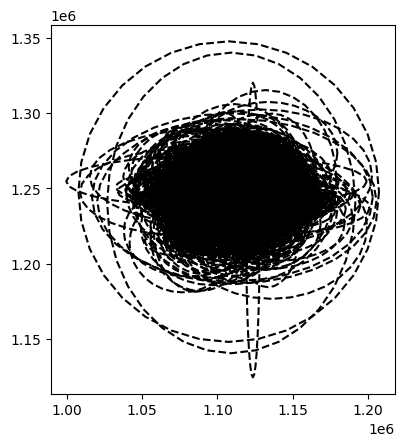

In [ ]:
gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
gdfElipses.boundary.plot(ls='--', color='black')

<Axes: >

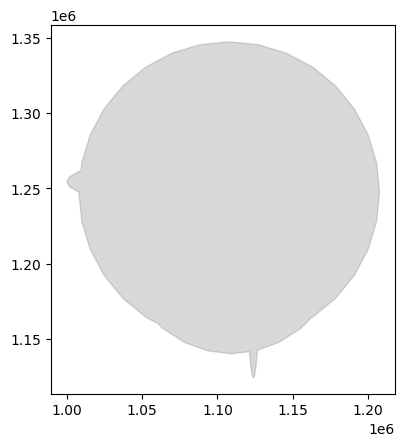

In [ ]:
shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                           crs='EPSG:3116')
shpUnio.plot(color='grey', edgecolor='grey', alpha=0.3)

In [ ]:
gdfElipses.geometry

0        POLYGON ((1141834.322 1248167.015, 1141503.829...
1        POLYGON ((1148725.175 1252380.301, 1148342.802...
2        POLYGON ((1146192.089 1244530.574, 1145888.496...
3        POLYGON ((1117291.040 1254657.620, 1117123.872...
4        POLYGON ((1114907.050 1236717.171, 1114561.185...
                               ...                        
31894    POLYGON ((1103074.409 1241145.709, 1103002.488...
31895    POLYGON ((1100816.485 1241363.469, 1100751.828...
31896    POLYGON ((1107750.266 1240711.871, 1107675.616...
31897    POLYGON ((1113862.888 1240393.746, 1113802.515...
31898    POLYGON ((1106190.927 1240825.491, 1106175.978...
Name: geometry, Length: 31899, dtype: geometry

### Funcion

In [ ]:
#def graficasMapas(df, df_GR, year, ax1, ax2, ax3, ax4, df_todos):
def graficasMapas(df, year, ax1, ax2, ax3, ax4):
  sizeDots = 1
  df_todos = df.copy() # dataFrame de todos los eventos
  df_GR = df_todos[df_todos['PROFUNDIDAD (Km)'] >= 100].copy()  # dataFrame de solo eventos de 100 km
  filtroYear = df_todos['Date-Time'].dt.year == year
  df = df_GR[df_GR['MAGNITUD Ml']>=2.5]# DataFrame de eventos de 100km y ml>= 2.5
  df_filtrado = df[df['Date-Time'].dt.year == year]
  nE = len(df_filtrado)
  filtro_error_mayor_10km = (df_filtrado['ERROR LATITUD (Km)'] > 10) | (df_filtrado['ERROR LONGITUD (Km)'] > 10)
  filtro_error_menor_10km = (df_filtrado['ERROR LATITUD (Km)'] <= 10) | (df_filtrado['ERROR LONGITUD (Km)'] <= 10)
  gdfTodos = gpd.GeoDataFrame(geometry=gpd.points_from_xy(df_todos['LONGITUD (grados)'],
                                                          df_todos['LATITUD (grados)'],
                                                          crs='epsg:4326'))
  gdfTodos.to_crs(epsg='3116', inplace=True)
  gdfTodos = gdfTodos.get_coordinates().to_numpy()

  print('############\n', year)
  print(df_filtrado.describe())

  ##### ax1 Shape nido
  puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                    df_filtrado['LATITUD (grados)'],
                                    crs='epsg:4326')
  gdf = gpd.GeoDataFrame(geometry=puntosSismos)
  gdf.to_crs(epsg='3116', inplace=True)
  centrosCirculo = gdf.get_coordinates().to_numpy()
  circulos = points(centrosCirculo)
  escalaX = df_filtrado['ERROR LONGITUD (Km)'].to_numpy() * 1000
  escalaY = df_filtrado['ERROR LATITUD (Km)'].to_numpy() * 1000
  shapeCirculos = shp.buffer(circulos, distance=1)
  listElipses = []
  for i in range(0, len(escalaX)):
    s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
    listElipses.append(s)
  gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
  shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                            crs='EPSG:3116')
  #shpUnio.to_crs(epsg='4326', inplace=True)

  ##### ax1
  shpUnio.plot(ax=ax1, color='cyan', edgecolor='cyan', alpha=0.3)
  shpUnio.boundary.plot(ax=ax1, color='black', ls='--', lw=1)
  #ax1.scatter(df_filtrado['LONGITUD (grados)'][filtro_error_menor_10km],
  #            df_filtrado['LATITUD (grados)'][filtro_error_menor_10km],
  #            s= sizeDots, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
  #ax1.scatter(df_filtrado['LONGITUD (grados)'][filtro_error_mayor_10km],
  #            df_filtrado['LATITUD (grados)'][filtro_error_mayor_10km],
  #            s= sizeDots, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
  ax1.scatter(centrosCirculo[:,0][filtro_error_menor_10km],
              centrosCirculo[:,1][filtro_error_menor_10km],
              s= sizeDots, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
  ax1.scatter(centrosCirculo[:,0][filtro_error_mayor_10km],
              centrosCirculo[:,1][filtro_error_mayor_10km],
              s= sizeDots, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
  #filtroTodos = (df_todos['PROFUNDIDAD (Km)'] <100) & (df_todos['PROFUNDIDAD (Km)'] >=50) & (df_todos['MAGNITUD Ml'] >=2.5)
  filtroTodos = (filtroYear) & (df_todos['PROFUNDIDAD (Km)'] <100) & (df_todos['MAGNITUD Ml'] >=2.5)
  ax1.scatter(gdfTodos[:,0][filtroTodos],
              gdfTodos[:,1][filtroTodos],
              s= sizeDots, c='black')
  #ax1.set_xlabel('Longitud [grados]', fontsize=10)
  #ax1.set_ylabel('Latitud [grados]', fontsize=10)

  #ax1.set_ylim(6.5, 7.1)
  #ax1.set_xlim(-73.4, -72.8)
  ax1.set_yticks(np.arange(1200000, 1280000, 10000))
  ax1.set_xticks(np.arange(1060000, 1150000, 10000))
  ax1.set_ylim(1210580, 1277080)
  ax1.set_xlim(1074938, 1141140)
  #ax1.legend(loc=8)
  #ax.axis('equal')
  ax1.set_xticklabels([])
  ax1.set_yticklabels([])
  ax1.set_aspect('auto')

  cx.add_basemap(ax=ax1,
                  crs='epsg:3116', # el sistema de coordenadas
                  source=xyz.OpenTopoMap,
                  reset_extent=True,
                  attribution_size=2) # Para incluir un mapa base

  ax1.grid(color='grey', ls='--', alpha=1)

  ##### ax2 Shape nido
  filtro_error_mayor_10km = (df_filtrado['ERROR LATITUD (Km)'] > 10) | (df_filtrado['PROFUNDIDAD (Km)'] > 10)
  filtro_error_menor_10km = (df_filtrado['ERROR LATITUD (Km)'] <= 10) | (df_filtrado['PROFUNDIDAD (Km)'] <= 10)
  puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                    df_filtrado['LATITUD (grados)'],
                                    crs='epsg:4326')
  gdf = gpd.GeoDataFrame(geometry=puntosSismos)
  gdf.to_crs(epsg='3116', inplace=True)
  centrosCirculo = gdf.get_coordinates().to_numpy()
  profundidadNumpy = df_filtrado['PROFUNDIDAD (Km)'].to_numpy().reshape(-1,1)
  centrosCirculo = np.concatenate((profundidadNumpy, centrosCirculo[:,1].reshape(-1,1)), axis=1)
  circulos = points(centrosCirculo)
  escalaX = df_filtrado['ERROR PROFUNDIDAD (Km)'].to_numpy()
  escalaY = df_filtrado['ERROR LATITUD (Km)'].to_numpy() * 1000 # la profundidad ingresa en km no multiplicar
  shapeCirculos = shp.buffer(circulos, distance=1)
  listElipses = []
  for i in range(0, len(escalaX)):
    s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
    listElipses.append(s)
  gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
  shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                            crs='EPSG:3116')

  ##### ax2
  shpUnio.plot(ax=ax2, color='cyan', edgecolor='cyan', alpha=0.3)
  shpUnio.boundary.plot(ax=ax2, color='black', ls='--', lw=1)
  ax2.scatter(df_filtrado['PROFUNDIDAD (Km)'][filtro_error_mayor_10km],
              centrosCirculo[:,1][filtro_error_mayor_10km],
              s= sizeDots, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
  ax2.scatter(df_filtrado['PROFUNDIDAD (Km)'][filtro_error_menor_10km],
              centrosCirculo[:,1][filtro_error_menor_10km],
              s= sizeDots, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
  ax2.scatter(df_todos['PROFUNDIDAD (Km)'][filtroTodos],
              gdfTodos[:,1][filtroTodos],
              s= sizeDots, c='black')
  ax2.set_ylim(1210580, 1277080)
  ax2.set_xlim(0, 250)
  ax2.set_yticks(np.arange(1200000, 1280000, 10000))
  ax2.set_xticks(np.arange(0, 251, 50))
  ax2.grid(color='grey', ls='--', alpha=1)
  #ax2.set_xlabel('Profundidad [Km]', fontsize=10)
  ax2.set_xticklabels([])
  ax2.set_yticklabels([])
  ax2.set_aspect('auto')



  ##### ax3 Shape nido
  filtro_error_mayor_10km = (df_filtrado['ERROR LONGITUD (Km)'] > 10) | (df_filtrado['PROFUNDIDAD (Km)'] > 10)
  filtro_error_menor_10km = (df_filtrado['ERROR LONGITUD (Km)'] <= 10) | (df_filtrado['PROFUNDIDAD (Km)'] <= 10)
  puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                    df_filtrado['LATITUD (grados)'],
                                    crs='epsg:4326')
  gdf = gpd.GeoDataFrame(geometry=puntosSismos)
  gdf.to_crs(epsg='3116', inplace=True)
  centrosCirculo = gdf.get_coordinates().to_numpy()
  profundidadNumpy = df_filtrado['PROFUNDIDAD (Km)'].to_numpy().reshape(-1,1)
  centrosCirculo = np.concatenate((centrosCirculo[:,0].reshape(-1,1), profundidadNumpy), axis=1)
  circulos = points(centrosCirculo)
  escalaY = df_filtrado['ERROR PROFUNDIDAD (Km)'].to_numpy()
  escalaX = df_filtrado['ERROR LONGITUD (Km)'].to_numpy() * 1000 # la profundidad ingresa en km no multiplicar
  shapeCirculos = shp.buffer(circulos, distance=1)
  listElipses = []
  for i in range(0, len(escalaX)):
    s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
    listElipses.append(s)
  gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
  shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                            crs='EPSG:3116')
  ##### ax3
  shpUnio.plot(ax=ax3, color='cyan', edgecolor='cyan', alpha=0.3)
  shpUnio.boundary.plot(ax=ax3, color='black', ls='--', lw=1)
  ax3.scatter(centrosCirculo[:,0][filtro_error_mayor_10km],
              df_filtrado['PROFUNDIDAD (Km)'][filtro_error_mayor_10km],
              s= sizeDots, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
  ax3.scatter(centrosCirculo[:,0][filtro_error_menor_10km],
              df_filtrado['PROFUNDIDAD (Km)'][filtro_error_menor_10km],
              s= sizeDots, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
  ax3.scatter(gdfTodos[:,0][filtroTodos],
              df_todos['PROFUNDIDAD (Km)'][filtroTodos],
              s= sizeDots, c='black')
  ax3.set_ylim(0, 250)
  ax3.set_yticks(np.arange(0, 251, 50))
  #ax3.set_xlim(-73.4, -72.8)
  ax3.set_xticks(np.arange(1060000, 1150000, 10000))
  ax3.set_xlim(1074938, 1141140)
  ax3.grid(color='grey', ls='--', alpha=1)
  ax3.invert_yaxis()
  #ax3.set_ylabel('Profundidad [Km]', fontsize=10)
  ax3.set_xticklabels([])
  ax3.set_yticklabels([])
  ax3.set_aspect('auto')

  ##### ax4
  df_Year = df_GR[df_GR['Date-Time'].dt.year == year]
  N_values = np.array([])
  magnitudes = np.arange(0.0, 6.5, 0.25)
  for i in magnitudes:
    sumar_cantidad = (df_Year['MAGNITUD Ml'] >= i).sum()
    if sumar_cantidad == 0:
      N_values = np.append(N_values, -1)
    else:
      N_values = np.append(N_values, sumar_cantidad)
  #Mc = 2.5
  #Mc = magnitudes[1:][(N_values[1:] - N_values[:-1]) / ((magnitudes[1:] - magnitudes[:-1])) <= -800][0] + 0.25
  # Para calcular la magnitud de completitud del catalogo se va a calcular
  # la pendiente de  i+1 contra i, luego se recupera todas las pendiente
  # <= a -0.1 y se filtra para saber cual magnitud corresponde y se le suma +0.25
  Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
  filtroMc = (magnitudes >= Mc) & (N_values != -1)
  x_regLin = np.array(magnitudes[filtroMc])
  x_regLin = np.reshape(x_regLin, (-1,1))
  y_regLin = np.log10(N_values[filtroMc])
  modeloRL = LinearRegression() # Creamos el modelo
  modeloRL.fit(x_regLin, y_regLin) # Entrenamos el modelo
  puntaje_modeloRL = modeloRL.score(x_regLin, y_regLin) # Calculamos su puntaje
  b_value = -1*np.round(modeloRL.coef_[0], 2) # Este es el coeficiente o la pendiente m
  a_value = np.round(modeloRL.intercept_, 2) # Este es el intercepto o punto de corte b
  # Graficar el resultado de la ley GR
  clr_ley= []
  for i in magnitudes:
    if i < Mc:
      clr_ley.append('k')
    else:
      clr_ley.append('b')

  ax4.scatter(magnitudes, N_values, c=clr_ley, s=sizeDots, marker='s')
  ax4.plot(np.array([[0],[7]]), 10**modeloRL.predict(np.array([[0],[7]])),
            color='red',
            ls='--',
            lw=sizeDots,
            label= '$\log_{10}$'+'$(N)={}-{}M$'.format(a_value, b_value) )


  ax4.set_yscale('log')
  #ax4.set_xlabel('Magnitud Ml', fontsize=10)
  #ax4.set_ylabel('Número acumulado N', fontsize=10)
  #ax4.legend(loc='upper right', fancybox=True, framealpha=1, shadow=True, borderpad=1 ,handletextpad= 0.5)
  ax4.grid(True, which='both', color='grey', ls='--', alpha=1)
  #ax4.set_title(f'Ley Gutenberg-Richter $M_c:{Mc}$')
  ax4.set_xticks(np.arange(0, 8))
  ax4.set_yticks(np.array([10, 100, 1000, 10000, 100000]))
  ax4.set_xlim(0, 7)
  ax4.set_ylim(0.5, 10**5.5)
  ax4.set_xticklabels([])
  ax4.set_yticklabels([])
  ax4.set_aspect('auto')

  #plt.suptitle(f'Año {year} [Prof. $\geq 100$ km][Ml $\geq 2.5$]: {nE} eventos')

  #eventsPerYear.append(nE)

### Funcion 2

In [ ]:
colorSismos = np.array(['b']*10)
colorSismos[1:3] = 'r'
colorSismos

array(['b', 'r', 'r', 'b', 'b', 'b', 'b', 'b', 'b', 'b'], dtype='<U1')

In [ ]:
#def graficasMapas(df, df_GR, year, ax1, ax2, ax3, ax4, df_todos):
def graficasMapas(df, year, ax1, ax2, ax3, ax4):
  sizeDots = 1
  df_todos = df.copy() # dataFrame de todos los eventos
  df_GR = df_todos[df_todos['PROFUNDIDAD (Km)'] >= 100].copy()  # dataFrame de solo eventos de 100 km
  filtroYear = df_todos['Date-Time'].dt.year == year
  df = df_GR[df_GR['MAGNITUD Ml']>=2.5]# DataFrame de eventos de 100km y ml>= 2.5
  df_filtrado = df[df['Date-Time'].dt.year == year]
  nE = len(df_filtrado)
  filtro_error_mayor_10km = (df_filtrado['ERROR LATITUD (Km)'] > 10) | (df_filtrado['ERROR LONGITUD (Km)'] > 10)
  filtro_error_menor_10km = (df_filtrado['ERROR LATITUD (Km)'] <= 10) | (df_filtrado['ERROR LONGITUD (Km)'] <= 10)
  gdfTodos = gpd.GeoDataFrame(geometry=gpd.points_from_xy(df_todos['LONGITUD (grados)'],
                                                          df_todos['LATITUD (grados)'],
                                                          crs='epsg:4326'))
  gdfTodos.to_crs(epsg='3116', inplace=True)
  gdfTodos = gdfTodos.get_coordinates().to_numpy()

  #print('############\n', year)
  #print(df_filtrado.describe())

  ##### ax1 Shape nido
  puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                    df_filtrado['LATITUD (grados)'],
                                    crs='epsg:4326')
  gdf = gpd.GeoDataFrame(geometry=puntosSismos)
  gdf.to_crs(epsg='3116', inplace=True)
  centrosCirculo = gdf.get_coordinates().to_numpy()
  circulos = points(centrosCirculo)
  escalaX = df_filtrado['ERROR LONGITUD (Km)'].to_numpy() * 1000
  escalaY = df_filtrado['ERROR LATITUD (Km)'].to_numpy() * 1000
  shapeCirculos = shp.buffer(circulos, distance=1)
  listElipses = []
  for i in range(0, len(escalaX)):
    s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
    listElipses.append(s)
  gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
  shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                            crs='EPSG:3116')
  #shpUnio.to_crs(epsg='4326', inplace=True)

  ##### ax1
  shpUnio.plot(ax=ax1, color='cyan', edgecolor='cyan', alpha=0.3)
  shpUnio.boundary.plot(ax=ax1, color='black', ls='--', lw=1)
  #ax1.scatter(df_filtrado['LONGITUD (grados)'][filtro_error_menor_10km],
  #            df_filtrado['LATITUD (grados)'][filtro_error_menor_10km],
  #            s= sizeDots, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
  #ax1.scatter(df_filtrado['LONGITUD (grados)'][filtro_error_mayor_10km],
  #            df_filtrado['LATITUD (grados)'][filtro_error_mayor_10km],
  #            s= sizeDots, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
  todEvent = len(filtro_error_menor_10km)
  colorSismos = np.array(['k']*todEvent)
  colorSismos[filtro_error_mayor_10km] = 'r'
  colorSismos[filtro_error_menor_10km] = 'b'
  ax1.scatter(centrosCirculo[:,0],
              centrosCirculo[:,1],
              s= sizeDots, c=colorSismos, alpha=0.8)
  #filtroTodos = (df_todos['PROFUNDIDAD (Km)'] <100) & (df_todos['PROFUNDIDAD (Km)'] >=50) & (df_todos['MAGNITUD Ml'] >=2.5)
  filtroTodos = (filtroYear) & (df_todos['PROFUNDIDAD (Km)'] <100) & (df_todos['MAGNITUD Ml'] >=2.5)
  ax1.scatter(gdfTodos[:,0][filtroTodos],
              gdfTodos[:,1][filtroTodos],
              s= sizeDots, c='black')
  #ax1.set_xlabel('Longitud [grados]', fontsize=10)
  #ax1.set_ylabel('Latitud [grados]', fontsize=10)

  #ax1.set_ylim(6.5, 7.1)
  #ax1.set_xlim(-73.4, -72.8)
  ax1.set_yticks(np.arange(1200000, 1280000, 10000))
  ax1.set_xticks(np.arange(1060000, 1150000, 10000))
  ax1.set_ylim(1210580, 1277080)
  ax1.set_xlim(1074938, 1141140)
  #ax1.legend(loc=8)
  #ax.axis('equal')
  ax1.set_xticklabels([])
  ax1.set_yticklabels([])
  ax1.set_aspect('auto')

  cx.add_basemap(ax=ax1,
                  crs='epsg:3116', # el sistema de coordenadas
                  source=xyz.OpenTopoMap,
                  reset_extent=True,
                  attribution_size=0) # Para incluir un mapa base

  ax1.grid(color='grey', ls='--', alpha=1)

  ##### ax2 Shape nido
  filtro_error_mayor_10km = (df_filtrado['ERROR LATITUD (Km)'] > 10) | (df_filtrado['PROFUNDIDAD (Km)'] > 10)
  filtro_error_menor_10km = (df_filtrado['ERROR LATITUD (Km)'] <= 10) | (df_filtrado['PROFUNDIDAD (Km)'] <= 10)
  puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                    df_filtrado['LATITUD (grados)'],
                                    crs='epsg:4326')
  gdf = gpd.GeoDataFrame(geometry=puntosSismos)
  gdf.to_crs(epsg='3116', inplace=True)
  centrosCirculo = gdf.get_coordinates().to_numpy()
  profundidadNumpy = df_filtrado['PROFUNDIDAD (Km)'].to_numpy().reshape(-1,1)
  centrosCirculo = np.concatenate((profundidadNumpy, centrosCirculo[:,1].reshape(-1,1)), axis=1)
  circulos = points(centrosCirculo)
  escalaX = df_filtrado['ERROR PROFUNDIDAD (Km)'].to_numpy()
  escalaY = df_filtrado['ERROR LATITUD (Km)'].to_numpy() * 1000 # la profundidad ingresa en km no multiplicar
  shapeCirculos = shp.buffer(circulos, distance=1)
  listElipses = []
  for i in range(0, len(escalaX)):
    s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
    listElipses.append(s)
  gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
  shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                            crs='EPSG:3116')

  ##### ax2
  shpUnio.plot(ax=ax2, color='cyan', edgecolor='cyan', alpha=0.3)
  shpUnio.boundary.plot(ax=ax2, color='black', ls='--', lw=1)
  todEvent = len(filtro_error_menor_10km)
  colorSismos = np.array(['k']*todEvent)
  colorSismos[filtro_error_mayor_10km] = 'r'
  colorSismos[filtro_error_menor_10km] = 'b'
  ax2.scatter(df_filtrado['PROFUNDIDAD (Km)'],
              centrosCirculo[:,1],
              s= sizeDots, c=colorSismos, alpha=0.8)
  ax2.scatter(df_todos['PROFUNDIDAD (Km)'][filtroTodos],
              gdfTodos[:,1][filtroTodos],
              s= sizeDots, c='black')
  ax2.set_ylim(1210580, 1277080)
  ax2.set_xlim(0, 250)
  ax2.set_yticks(np.arange(1200000, 1280000, 10000))
  ax2.set_xticks(np.arange(0, 251, 50))
  ax2.grid(color='grey', ls='--', alpha=1)
  #ax2.set_xlabel('Profundidad [Km]', fontsize=10)
  ax2.set_xticklabels([])
  ax2.set_yticklabels([])
  ax2.set_aspect('auto')



  ##### ax3 Shape nido
  filtro_error_mayor_10km = (df_filtrado['ERROR LONGITUD (Km)'] > 10) | (df_filtrado['PROFUNDIDAD (Km)'] > 10)
  filtro_error_menor_10km = (df_filtrado['ERROR LONGITUD (Km)'] <= 10) | (df_filtrado['PROFUNDIDAD (Km)'] <= 10)
  puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                    df_filtrado['LATITUD (grados)'],
                                    crs='epsg:4326')
  gdf = gpd.GeoDataFrame(geometry=puntosSismos)
  gdf.to_crs(epsg='3116', inplace=True)
  centrosCirculo = gdf.get_coordinates().to_numpy()
  profundidadNumpy = df_filtrado['PROFUNDIDAD (Km)'].to_numpy().reshape(-1,1)
  centrosCirculo = np.concatenate((centrosCirculo[:,0].reshape(-1,1), profundidadNumpy), axis=1)
  circulos = points(centrosCirculo)
  escalaY = df_filtrado['ERROR PROFUNDIDAD (Km)'].to_numpy()
  escalaX = df_filtrado['ERROR LONGITUD (Km)'].to_numpy() * 1000 # la profundidad ingresa en km no multiplicar
  shapeCirculos = shp.buffer(circulos, distance=1)
  listElipses = []
  for i in range(0, len(escalaX)):
    s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
    listElipses.append(s)
  gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
  shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                            crs='EPSG:3116')
  ##### ax3
  shpUnio.plot(ax=ax3, color='cyan', edgecolor='cyan', alpha=0.3)
  shpUnio.boundary.plot(ax=ax3, color='black', ls='--', lw=1)
  todEvent = len(filtro_error_menor_10km)
  colorSismos = np.array(['k']*todEvent)
  colorSismos[filtro_error_mayor_10km] = 'r'
  colorSismos[filtro_error_menor_10km] = 'b'
  ax3.scatter(centrosCirculo[:,0],
              df_filtrado['PROFUNDIDAD (Km)'],
              s= sizeDots, c=colorSismos, alpha=0.8)
  ax3.scatter(gdfTodos[:,0][filtroTodos],
              df_todos['PROFUNDIDAD (Km)'][filtroTodos],
              s= sizeDots, c='black')
  ax3.set_ylim(0, 250)
  ax3.set_yticks(np.arange(0, 251, 50))
  #ax3.set_xlim(-73.4, -72.8)
  ax3.set_xticks(np.arange(1060000, 1150000, 10000))
  ax3.set_xlim(1074938, 1141140)
  ax3.grid(color='grey', ls='--', alpha=1)
  ax3.invert_yaxis()
  #ax3.set_ylabel('Profundidad [Km]', fontsize=10)
  ax3.set_xticklabels([])
  ax3.set_yticklabels([])
  ax3.set_aspect('auto')

  ##### ax4
  df_Year = df_GR[df_GR['Date-Time'].dt.year == year]
  N_values = np.array([])
  magnitudes = np.arange(0.0, 6.5, 0.25)
  for i in magnitudes:
    sumar_cantidad = (df_Year['MAGNITUD Ml'] >= i).sum()
    if sumar_cantidad == 0:
      N_values = np.append(N_values, -1)
    else:
      N_values = np.append(N_values, sumar_cantidad)
  #Mc = 2.5
  #Mc = magnitudes[1:][(N_values[1:] - N_values[:-1]) / ((magnitudes[1:] - magnitudes[:-1])) <= -800][0] + 0.25
  # Para calcular la magnitud de completitud del catalogo se va a calcular
  # la pendiente de  i+1 contra i, luego se recupera todas las pendiente
  # <= a -0.1 y se filtra para saber cual magnitud corresponde y se le suma +0.25
  Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
  filtroMc = (magnitudes >= Mc) & (N_values != -1)
  x_regLin = np.array(magnitudes[filtroMc])
  x_regLin = np.reshape(x_regLin, (-1,1))
  y_regLin = np.log10(N_values[filtroMc])
  modeloRL = LinearRegression() # Creamos el modelo
  modeloRL.fit(x_regLin, y_regLin) # Entrenamos el modelo
  puntaje_modeloRL = modeloRL.score(x_regLin, y_regLin) # Calculamos su puntaje
  b_value = -1*np.round(modeloRL.coef_[0], 2) # Este es el coeficiente o la pendiente m
  a_value = np.round(modeloRL.intercept_, 2) # Este es el intercepto o punto de corte b
  # Graficar el resultado de la ley GR
  clr_ley= []
  for i in magnitudes:
    if i < Mc:
      clr_ley.append('k')
    else:
      clr_ley.append('b')

  ax4.scatter(magnitudes, N_values, c=clr_ley, s=sizeDots, marker='s')
  ax4.plot(np.array([[0],[7]]), 10**modeloRL.predict(np.array([[0],[7]])),
            color='red',
            ls='--',
            lw=sizeDots,
            label= '$\log_{10}$'+'$(N)={}-{}M$'.format(a_value, b_value) )


  ax4.set_yscale('log')
  #ax4.set_xlabel('Magnitud Ml', fontsize=10)
  #ax4.set_ylabel('Número acumulado N', fontsize=10)
  #ax4.legend(loc='upper right', fancybox=True, framealpha=1, shadow=True, borderpad=1 ,handletextpad= 0.5)
  ax4.grid(True, which='both', color='grey', ls='--', alpha=1)
  #ax4.set_title(f'Ley Gutenberg-Richter $M_c:{Mc}$')
  ax4.set_xticks(np.arange(0, 8))
  ax4.set_yticks(np.array([10, 100, 1000, 10000, 100000]))
  ax4.set_xlim(0, 7)
  ax4.set_ylim(0.5, 10**5.5)
  ax4.set_xticklabels([])
  ax4.set_yticklabels([])
  ax4.set_aspect('auto')

  #plt.suptitle(f'Año {year} [Prof. $\geq 100$ km][Ml $\geq 2.5$]: {nE} eventos')

  #eventsPerYear.append(nE)

<ipython-input-56-e6f9012575e2>:195: RuntimeWarning: invalid value encountered in log10
  Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
<ipython-input-56-e6f9012575e2>:195: RuntimeWarning: invalid value encountered in log10
  Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
<ipython-input-56-e6f9012575e2>:195: RuntimeWarning: invalid value encountered in log10
  Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
<ipython-input-56-e6f9012575e2>:195: RuntimeWarning: invalid value encountered in log10
  Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25


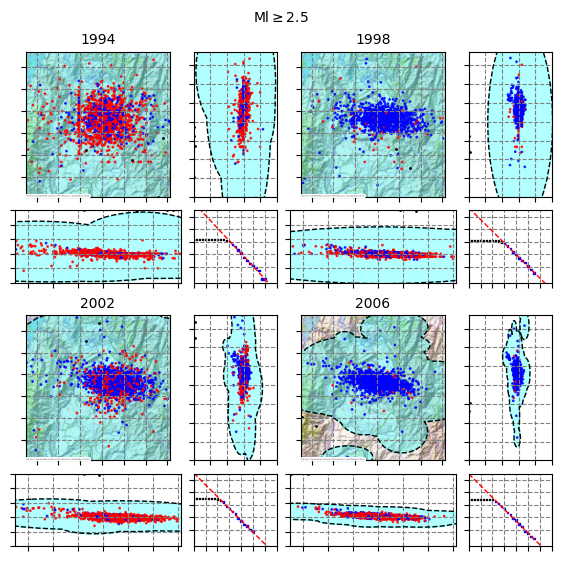

In [ ]:
#df = df_Filtrado_100km_ml25.copy()
#df_GR = df_Filtrado_100km.copy()

fig = plt.figure(figsize=(5.5,5.5), constrained_layout=True)
gs = fig.add_gridspec(6,6)


# 1994
ax1 = fig.add_subplot(gs[0:2, 0:2])
ax2 = fig.add_subplot(gs[0:2, 2])
ax3 = fig.add_subplot(gs[2, 0:2])
ax4 = fig.add_subplot(gs[2, 2])

# 2002
ax5 = fig.add_subplot(gs[0:2, 3:5])
ax6 = fig.add_subplot(gs[0:2, 5])
ax7 = fig.add_subplot(gs[2, 3:5])
ax9 = fig.add_subplot(gs[2, 5])

# 2002
ax10 = fig.add_subplot(gs[3:5, 0:2])
ax11 = fig.add_subplot(gs[3:5, 2])
ax12 = fig.add_subplot(gs[5, 0:2])
ax13 = fig.add_subplot(gs[5, 2])

# 2006
ax14 = fig.add_subplot(gs[3:5, 3:5])
ax15 = fig.add_subplot(gs[3:5, 5])
ax16 = fig.add_subplot(gs[5, 3:5])
ax17 = fig.add_subplot(gs[5, 5])

graficasMapas(df_todos, 1994, ax1, ax2, ax3, ax4)

graficasMapas(df_todos, 1998, ax5, ax6, ax7, ax9)

graficasMapas(df_todos, 2002, ax10, ax11, ax12, ax13)

graficasMapas(df_todos, 2006, ax14, ax15, ax16, ax17)

ax1.set_title('1994', fontsize=10)
ax5.set_title('1998', fontsize=10)
ax10.set_title('2002', fontsize=10)
ax14.set_title('2006', fontsize=10)
plt.suptitle('Ml$\geq2.5$', fontsize=10)

plt.savefig((pathSaveFiguras + f'mapa_years_A.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)
plt.show()

## 2010-2014-2018-2023

<ipython-input-56-e6f9012575e2>:195: RuntimeWarning: invalid value encountered in log10
  Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
<ipython-input-56-e6f9012575e2>:195: RuntimeWarning: invalid value encountered in log10
  Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
<ipython-input-56-e6f9012575e2>:195: RuntimeWarning: invalid value encountered in log10
  Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
<ipython-input-56-e6f9012575e2>:195: RuntimeWarning: invalid value encountered in log10
  Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25


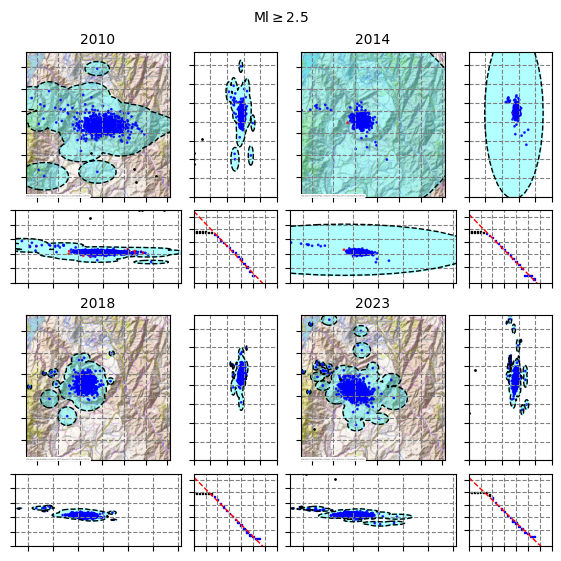

In [ ]:

fig = plt.figure(figsize=(5.5,5.5), constrained_layout=True)
gs = fig.add_gridspec(6,6)


# 2010
ax1 = fig.add_subplot(gs[0:2, 0:2])
ax2 = fig.add_subplot(gs[0:2, 2])
ax3 = fig.add_subplot(gs[2, 0:2])
ax4 = fig.add_subplot(gs[2, 2])

# 2014
ax5 = fig.add_subplot(gs[0:2, 3:5])
ax6 = fig.add_subplot(gs[0:2, 5])
ax7 = fig.add_subplot(gs[2, 3:5])
ax9 = fig.add_subplot(gs[2, 5])

# 2018
ax10 = fig.add_subplot(gs[3:5, 0:2])
ax11 = fig.add_subplot(gs[3:5, 2])
ax12 = fig.add_subplot(gs[5, 0:2])
ax13 = fig.add_subplot(gs[5, 2])

# 2023
ax14 = fig.add_subplot(gs[3:5, 3:5])
ax15 = fig.add_subplot(gs[3:5, 5])
ax16 = fig.add_subplot(gs[5, 3:5])
ax17 = fig.add_subplot(gs[5, 5])

graficasMapas(df_todos, 2010, ax1, ax2, ax3, ax4)

graficasMapas(df_todos, 2014, ax5, ax6, ax7, ax9)

graficasMapas(df_todos, 2018, ax10, ax11, ax12, ax13)

graficasMapas(df_todos, 2023, ax14, ax15, ax16, ax17)

ax1.set_title('2010', fontsize=10)
ax5.set_title('2014', fontsize=10)
ax10.set_title('2018', fontsize=10)
ax14.set_title('2023', fontsize=10)
plt.suptitle('Ml$\geq2.5$', fontsize=10)

plt.savefig((pathSaveFiguras + f'mapa_years_B.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)
plt.show()

## Todos

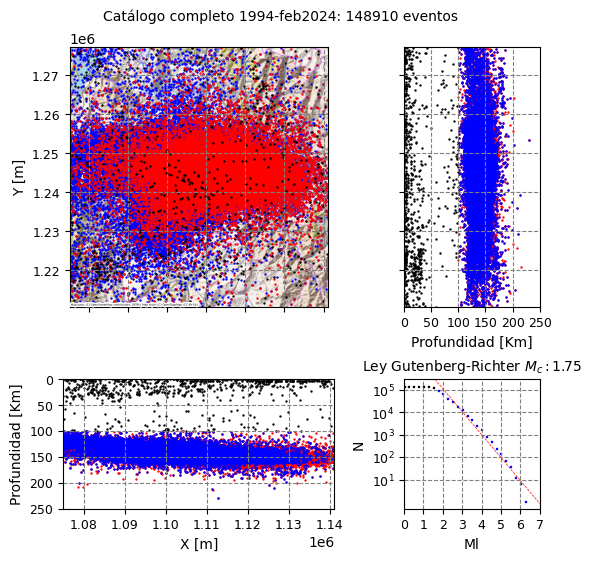

In [ ]:
fig = plt.figure(figsize=(5.5,5.5), constrained_layout=True)
gs = fig.add_gridspec(3,3)


# 1994
ax1 = fig.add_subplot(gs[0:2, 0:2])
ax2 = fig.add_subplot(gs[0:2, 2])
ax3 = fig.add_subplot(gs[2, 0:2])
ax4 = fig.add_subplot(gs[2, 2])


sizeDots = 0.5
df_todos = df_todos.copy() # dataFrame de todos los eventos
df_GR = df_todos[df_todos['PROFUNDIDAD (Km)'] >= 100].copy()  # dataFrame de solo eventos de 100 km
df = df_GR[df_GR['MAGNITUD Ml']>= -1]# DataFrame de eventos de 100km y ml>= 2.5
df_filtrado = df.copy()
nE = len(df_todos)
filtro_error_mayor_10km = (df_filtrado['ERROR LATITUD (Km)'] > 10) | (df_filtrado['ERROR LONGITUD (Km)'] > 10)
filtro_error_menor_10km = (df_filtrado['ERROR LATITUD (Km)'] <= 10) | (df_filtrado['ERROR LONGITUD (Km)'] <= 10)
gdfTodos = gpd.GeoDataFrame(geometry=gpd.points_from_xy(df_todos['LONGITUD (grados)'],
                                                        df_todos['LATITUD (grados)'],
                                                        crs='epsg:4326'))
gdfTodos.to_crs(epsg='3116', inplace=True)
gdfTodos = gdfTodos.get_coordinates().to_numpy()

#print(df_filtrado.describe())

##### ax1 Shape nido
puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                  df_filtrado['LATITUD (grados)'],
                                  crs='epsg:4326')
gdf = gpd.GeoDataFrame(geometry=puntosSismos)
gdf.to_crs(epsg='3116', inplace=True)
centrosCirculo = gdf.get_coordinates().to_numpy()
circulos = points(centrosCirculo)
escalaX = df_filtrado['ERROR LONGITUD (Km)'].to_numpy() * 1000
escalaY = df_filtrado['ERROR LATITUD (Km)'].to_numpy() * 1000
shapeCirculos = shp.buffer(circulos, distance=1)
listElipses = []
for i in range(0, len(escalaX)):
  s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
  listElipses.append(s)
gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                          crs='EPSG:3116')
#shpUnio.to_crs(epsg='4326', inplace=True)

##### ax1
#shpUnio.plot(ax=ax1, color='cyan', edgecolor='cyan', alpha=0.3)
#shpUnio.boundary.plot(ax=ax1, color='black', ls='--', lw=1)
#ax1.scatter(df_filtrado['LONGITUD (grados)'][filtro_error_menor_10km],
#            df_filtrado['LATITUD (grados)'][filtro_error_menor_10km],
#            s= sizeDots, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
#ax1.scatter(df_filtrado['LONGITUD (grados)'][filtro_error_mayor_10km],
#            df_filtrado['LATITUD (grados)'][filtro_error_mayor_10km],
#            s= sizeDots, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
ax1.scatter(centrosCirculo[:,0][filtro_error_menor_10km],
            centrosCirculo[:,1][filtro_error_menor_10km],
            s= sizeDots, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
ax1.scatter(centrosCirculo[:,0][filtro_error_mayor_10km],
            centrosCirculo[:,1][filtro_error_mayor_10km],
            s= sizeDots, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
#filtroTodos = (df_todos['PROFUNDIDAD (Km)'] <100) & (df_todos['PROFUNDIDAD (Km)'] >=50) & (df_todos['MAGNITUD Ml'] >=2.5)
filtroTodos = (df_todos['PROFUNDIDAD (Km)'] <100)
ax1.scatter(gdfTodos[:,0][filtroTodos],
            gdfTodos[:,1][filtroTodos],
            s= sizeDots, c='black')
#ax1.set_xlabel('Longitud [grados]', fontsize=10)
#ax1.set_ylabel('Latitud [grados]', fontsize=10)

#ax1.set_ylim(6.5, 7.1)
#ax1.set_xlim(-73.4, -72.8)
ax1.set_yticks(np.arange(1200000, 1280000, 10000))
ax1.set_xticks(np.arange(1060000, 1150000, 10000))
ax1.set_ylim(1210580, 1277080)
ax1.set_xlim(1074938, 1141140)
#ax1.legend(loc=8)
#ax.axis('equal')
ax1.set_aspect('auto')
ax1.set_ylabel('Y [m]', fontsize=10)
ax1.set_xticklabels([])
ax1.tick_params(labelsize=9)

cx.add_basemap(ax=ax1,
                crs='epsg:3116', # el sistema de coordenadas
                source=xyz.OpenTopoMap,
                reset_extent=True,
                attribution_size=2) # Para incluir un mapa base

ax1.grid(color='grey', ls='--', alpha=1)

##### ax2 Shape nido
filtro_error_mayor_10km = (df_filtrado['ERROR LATITUD (Km)'] > 10) | (df_filtrado['PROFUNDIDAD (Km)'] > 10)
filtro_error_menor_10km = (df_filtrado['ERROR LATITUD (Km)'] <= 10) | (df_filtrado['PROFUNDIDAD (Km)'] <= 10)
puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                  df_filtrado['LATITUD (grados)'],
                                  crs='epsg:4326')
gdf = gpd.GeoDataFrame(geometry=puntosSismos)
gdf.to_crs(epsg='3116', inplace=True)
centrosCirculo = gdf.get_coordinates().to_numpy()
profundidadNumpy = df_filtrado['PROFUNDIDAD (Km)'].to_numpy().reshape(-1,1)
centrosCirculo = np.concatenate((profundidadNumpy, centrosCirculo[:,1].reshape(-1,1)), axis=1)
circulos = points(centrosCirculo)
escalaX = df_filtrado['PROFUNDIDAD (Km)'].to_numpy()
escalaY = df_filtrado['ERROR LATITUD (Km)'].to_numpy() * 1000
shapeCirculos = shp.buffer(circulos, distance=1)
listElipses = []
for i in range(0, len(escalaX)):
  s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
  listElipses.append(s)
gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                          crs='EPSG:3116')

##### ax2
#shpUnio.plot(ax=ax2, color='cyan', edgecolor='cyan', alpha=0.3)
#shpUnio.boundary.plot(ax=ax2, color='black', ls='--', lw=1)
ax2.scatter(df_filtrado['PROFUNDIDAD (Km)'][filtro_error_mayor_10km],
            centrosCirculo[:,1][filtro_error_mayor_10km],
            s= sizeDots, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
ax2.scatter(df_filtrado['PROFUNDIDAD (Km)'][filtro_error_menor_10km],
            centrosCirculo[:,1][filtro_error_menor_10km],
            s= sizeDots, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
ax2.scatter(df_todos['PROFUNDIDAD (Km)'][filtroTodos],
            gdfTodos[:,1][filtroTodos],
            s= sizeDots, c='black')
ax2.set_yticks(np.arange(1200000, 1280000, 10000))
ax2.set_ylim(1210580, 1277080)
ax2.set_xlim(0, 250)
ax2.set_xticks(np.arange(0, 251, 50))
ax2.grid(color='grey', ls='--', alpha=1)
ax2.set_xlabel('Profundidad [Km]', fontsize=10)
ax2.set_aspect('auto')
ax2.set_yticklabels([])
ax2.tick_params(labelsize=9)

##### ax3 Shape nido
filtro_error_mayor_10km = (df_filtrado['ERROR LONGITUD (Km)'] > 10) | (df_filtrado['PROFUNDIDAD (Km)'] > 10)
filtro_error_menor_10km = (df_filtrado['ERROR LONGITUD (Km)'] <= 10) | (df_filtrado['PROFUNDIDAD (Km)'] <= 10)
puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                  df_filtrado['LATITUD (grados)'],
                                  crs='epsg:4326')
gdf = gpd.GeoDataFrame(geometry=puntosSismos)
gdf.to_crs(epsg='3116', inplace=True)
centrosCirculo = gdf.get_coordinates().to_numpy()
profundidadNumpy = df_filtrado['PROFUNDIDAD (Km)'].to_numpy().reshape(-1,1)
centrosCirculo = np.concatenate((centrosCirculo[:,0].reshape(-1,1), profundidadNumpy), axis=1)
circulos = points(centrosCirculo)
escalaY = df_filtrado['PROFUNDIDAD (Km)'].to_numpy()
escalaX = df_filtrado['ERROR LONGITUD (Km)'].to_numpy() * 1000
shapeCirculos = shp.buffer(circulos, distance=1)
listElipses = []
for i in range(0, len(escalaX)):
  s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
  listElipses.append(s)
gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                          crs='EPSG:3116')
##### ax3
#shpUnio.plot(ax=ax3, color='cyan', edgecolor='cyan', alpha=0.3)
#shpUnio.boundary.plot(ax=ax3, color='black', ls='--', lw=1)
ax3.scatter(centrosCirculo[:,0][filtro_error_mayor_10km],
            df_filtrado['PROFUNDIDAD (Km)'][filtro_error_mayor_10km],
            s= sizeDots, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
ax3.scatter(centrosCirculo[:,0][filtro_error_menor_10km],
            df_filtrado['PROFUNDIDAD (Km)'][filtro_error_menor_10km],
            s= sizeDots, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
ax3.scatter(gdfTodos[:,0][filtroTodos],
            df_todos['PROFUNDIDAD (Km)'][filtroTodos],
            s= sizeDots, c='black')
ax3.set_ylim(0, 250)
ax3.set_yticks(np.arange(0, 251, 50))
#ax3.set_xlim(-73.4, -72.8)
ax3.set_xticks(np.arange(1060000, 1150000, 10000))
ax3.set_xlim(1074938, 1141140)
ax3.grid(color='grey', ls='--', alpha=1)
ax3.invert_yaxis()
ax3.set_ylabel('Profundidad [Km]', fontsize=10)
ax3.set_aspect('auto')
ax3.set_xlabel('X [m]', fontsize=10)
ax3.tick_params(labelsize=9)

##### ax4
df_Year = df_GR
N_values = np.array([])
magnitudes = np.arange(0.0, 6.5, 0.25)
for i in magnitudes:
  sumar_cantidad = (df_Year['MAGNITUD Ml'] >= i).sum()
  if sumar_cantidad == 0:
    N_values = np.append(N_values, -1)
  else:
    N_values = np.append(N_values, sumar_cantidad)
#Mc = 2.5
#Mc = magnitudes[1:][(N_values[1:] - N_values[:-1]) / ((magnitudes[1:] - magnitudes[:-1])) <= -800][0] + 0.25
# Para calcular la magnitud de completitud del catalogo se va a calcular
# la pendiente de  i+1 contra i, luego se recupera todas las pendiente
# <= a -0.1 y se filtra para saber cual magnitud corresponde y se le suma +0.25
Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
filtroMc = (magnitudes >= Mc) & (N_values != -1)
x_regLin = np.array(magnitudes[filtroMc])
x_regLin = np.reshape(x_regLin, (-1,1))
y_regLin = np.log10(N_values[filtroMc])
modeloRL = LinearRegression() # Creamos el modelo
modeloRL.fit(x_regLin, y_regLin) # Entrenamos el modelo
puntaje_modeloRL = modeloRL.score(x_regLin, y_regLin) # Calculamos su puntaje
b_value = -1*np.round(modeloRL.coef_[0], 2) # Este es el coeficiente o la pendiente m
a_value = np.round(modeloRL.intercept_, 2) # Este es el intercepto o punto de corte b
# Graficar el resultado de la ley GR
clr_ley= []
for i in magnitudes:
  if i < Mc:
    clr_ley.append('k')
  else:
    clr_ley.append('b')

ax4.scatter(magnitudes, N_values, c=clr_ley, s=sizeDots, marker='s')
ax4.plot(np.array([[0],[7]]), 10**modeloRL.predict(np.array([[0],[7]])),
          color='red',
          ls='--',
          lw=sizeDots,
          label= '$\log_{10}$'+'$(N)={}-{}M$'.format(a_value, b_value) )


ax4.set_yscale('log')
ax4.set_ylim(0.5, 10**5.5)
ax4.set_xlabel('Ml', fontsize=10)
ax4.set_ylabel('N', fontsize=10)
#ax4.legend(loc='upper right', fancybox=True, framealpha=1, shadow=True, borderpad=1 ,handletextpad= 0.5)
ax4.grid(True, which='both', color='grey', ls='--', alpha=1)
ax4.set_title(f'Ley Gutenberg-Richter $M_c:{Mc}$', fontsize=10)
ax4.set_xticks(np.arange(0, 8))
ax4.set_yticks(np.array([10, 100, 1000, 10000, 100000]))
ax4.set_xlim(0, 7)
ax4.set_aspect('auto')
ax4.tick_params(labelsize=9)

plt.suptitle(f'Catálogo completo 1994-feb2024: {nE} eventos', fontsize=10)


plt.savefig((pathSaveFiguras + f'mapa_Completo_nuevo.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)

plt.show()
#eventsPerYear.append(nE)

## Todos 2

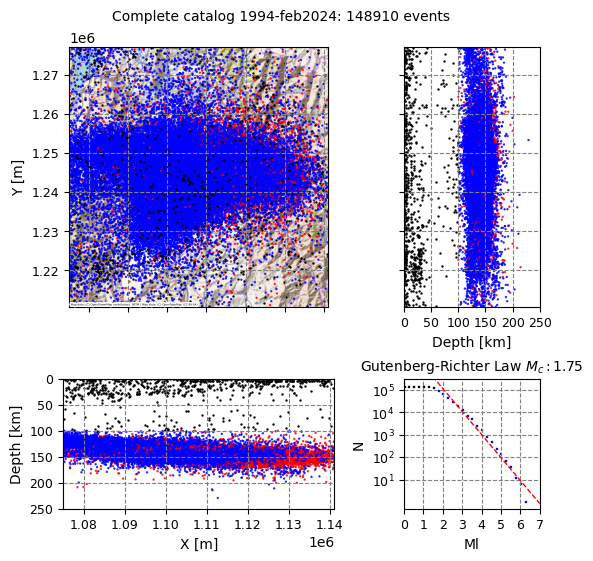

In [ ]:
fig = plt.figure(figsize=(5.5,5.5), constrained_layout=True)
gs = fig.add_gridspec(3,3)


# 1994
ax1 = fig.add_subplot(gs[0:2, 0:2])
ax2 = fig.add_subplot(gs[0:2, 2])
ax3 = fig.add_subplot(gs[2, 0:2])
ax4 = fig.add_subplot(gs[2, 2])


sizeDots = 0.5
df_todos = df_todos.copy() # dataFrame de todos los eventos
df_GR = df_todos[df_todos['PROFUNDIDAD (Km)'] >= 100].copy()  # dataFrame de solo eventos de 100 km
df = df_GR[df_GR['MAGNITUD Ml']>= -1]# DataFrame de eventos de 100km y ml>= 2.5
df_filtrado = df.copy()
nE = len(df_todos)
filtro_error_mayor_10km = (df_filtrado['ERROR LATITUD (Km)'] > 10) | (df_filtrado['ERROR LONGITUD (Km)'] > 10)
filtro_error_menor_10km = (df_filtrado['ERROR LATITUD (Km)'] <= 10) | (df_filtrado['ERROR LONGITUD (Km)'] <= 10)
gdfTodos = gpd.GeoDataFrame(geometry=gpd.points_from_xy(df_todos['LONGITUD (grados)'],
                                                        df_todos['LATITUD (grados)'],
                                                        crs='epsg:4326'))
gdfTodos.to_crs(epsg='3116', inplace=True)
gdfTodos = gdfTodos.get_coordinates().to_numpy()

#print(df_filtrado.describe())

##### ax1 Shape nido
puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                  df_filtrado['LATITUD (grados)'],
                                  crs='epsg:4326')
gdf = gpd.GeoDataFrame(geometry=puntosSismos)
gdf.to_crs(epsg='3116', inplace=True)
centrosCirculo = gdf.get_coordinates().to_numpy()
circulos = points(centrosCirculo)
escalaX = df_filtrado['ERROR LONGITUD (Km)'].to_numpy() * 1000
escalaY = df_filtrado['ERROR LATITUD (Km)'].to_numpy() * 1000
shapeCirculos = shp.buffer(circulos, distance=1)
listElipses = []
for i in range(0, len(escalaX)):
  s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
  listElipses.append(s)
gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                          crs='EPSG:3116')
#shpUnio.to_crs(epsg='4326', inplace=True)

##### ax1
#shpUnio.plot(ax=ax1, color='cyan', edgecolor='cyan', alpha=0.3)
#shpUnio.boundary.plot(ax=ax1, color='black', ls='--', lw=1)
#ax1.scatter(df_filtrado['LONGITUD (grados)'][filtro_error_menor_10km],
#            df_filtrado['LATITUD (grados)'][filtro_error_menor_10km],
#            s= sizeDots, c='b', label='Error Lat. Long. $\leq 10$ km [{} eventos]'.format(sum(filtro_error_menor_10km)))
#ax1.scatter(df_filtrado['LONGITUD (grados)'][filtro_error_mayor_10km],
#            df_filtrado['LATITUD (grados)'][filtro_error_mayor_10km],
#            s= sizeDots, c='r', label='Error Lat. Long. $> 10$ km [{} eventos]'.format(sum(filtro_error_mayor_10km)))
todEvent = len(filtro_error_menor_10km)
colorSismos = np.array(['k']*todEvent)
colorSismos[filtro_error_mayor_10km] = 'r'
colorSismos[filtro_error_menor_10km] = 'b'
ax1.scatter(centrosCirculo[:,0],
            centrosCirculo[:,1],
            s= sizeDots, c=colorSismos, alpha=0.8)
#filtroTodos = (df_todos['PROFUNDIDAD (Km)'] <100) & (df_todos['PROFUNDIDAD (Km)'] >=50) & (df_todos['MAGNITUD Ml'] >=2.5)
filtroTodos = (df_todos['PROFUNDIDAD (Km)'] <100)
ax1.scatter(gdfTodos[:,0][filtroTodos],
            gdfTodos[:,1][filtroTodos],
            s= sizeDots, c='black')
#ax1.set_xlabel('Longitud [grados]', fontsize=10)
#ax1.set_ylabel('Latitud [grados]', fontsize=10)

#ax1.set_ylim(6.5, 7.1)
#ax1.set_xlim(-73.4, -72.8)
ax1.set_yticks(np.arange(1200000, 1280000, 10000))
ax1.set_xticks(np.arange(1060000, 1150000, 10000))
ax1.set_ylim(1210580, 1277080)
ax1.set_xlim(1074938, 1141140)
#ax1.legend(loc=8)
#ax.axis('equal')
ax1.set_aspect('auto')
ax1.set_ylabel('Y [m]', fontsize=10)
ax1.set_xticklabels([])
ax1.tick_params(labelsize=9)

cx.add_basemap(ax=ax1,
                crs='epsg:3116', # el sistema de coordenadas
                source=xyz.OpenTopoMap,
                reset_extent=True,
                attribution_size=2) # Para incluir un mapa base

ax1.grid(color='grey', ls='--', alpha=1)

##### ax2 Shape nido
filtro_error_mayor_10km = (df_filtrado['ERROR LATITUD (Km)'] > 10) | (df_filtrado['PROFUNDIDAD (Km)'] > 10)
filtro_error_menor_10km = (df_filtrado['ERROR LATITUD (Km)'] <= 10) | (df_filtrado['PROFUNDIDAD (Km)'] <= 10)
puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                  df_filtrado['LATITUD (grados)'],
                                  crs='epsg:4326')
gdf = gpd.GeoDataFrame(geometry=puntosSismos)
gdf.to_crs(epsg='3116', inplace=True)
centrosCirculo = gdf.get_coordinates().to_numpy()
profundidadNumpy = df_filtrado['PROFUNDIDAD (Km)'].to_numpy().reshape(-1,1)
centrosCirculo = np.concatenate((profundidadNumpy, centrosCirculo[:,1].reshape(-1,1)), axis=1)
circulos = points(centrosCirculo)
escalaX = df_filtrado['PROFUNDIDAD (Km)'].to_numpy()
escalaY = df_filtrado['ERROR LATITUD (Km)'].to_numpy() * 1000
shapeCirculos = shp.buffer(circulos, distance=1)
listElipses = []
for i in range(0, len(escalaX)):
  s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
  listElipses.append(s)
gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                          crs='EPSG:3116')

##### ax2
#shpUnio.plot(ax=ax2, color='cyan', edgecolor='cyan', alpha=0.3)
#shpUnio.boundary.plot(ax=ax2, color='black', ls='--', lw=1)
todEvent = len(filtro_error_menor_10km)
colorSismos = np.array(['k']*todEvent)
colorSismos[filtro_error_mayor_10km] = 'r'
colorSismos[filtro_error_menor_10km] = 'b'
ax2.scatter(df_filtrado['PROFUNDIDAD (Km)'],
            centrosCirculo[:,1],
            s= sizeDots, c=colorSismos, alpha=0.8)
ax2.scatter(df_todos['PROFUNDIDAD (Km)'][filtroTodos],
            gdfTodos[:,1][filtroTodos],
            s= sizeDots, c='black')
ax2.set_yticks(np.arange(1200000, 1280000, 10000))
ax2.set_ylim(1210580, 1277080)
ax2.set_xlim(0, 250)
ax2.set_xticks(np.arange(0, 251, 50))
ax2.grid(color='grey', ls='--', alpha=1)
ax2.set_xlabel('Depth [km]', fontsize=10)
ax2.set_aspect('auto')
ax2.set_yticklabels([])
ax2.tick_params(labelsize=9)

##### ax3 Shape nido
filtro_error_mayor_10km = (df_filtrado['ERROR LONGITUD (Km)'] > 10) | (df_filtrado['PROFUNDIDAD (Km)'] > 10)
filtro_error_menor_10km = (df_filtrado['ERROR LONGITUD (Km)'] <= 10) | (df_filtrado['PROFUNDIDAD (Km)'] <= 10)
puntosSismos = gpd.points_from_xy(df_filtrado['LONGITUD (grados)'],
                                  df_filtrado['LATITUD (grados)'],
                                  crs='epsg:4326')
gdf = gpd.GeoDataFrame(geometry=puntosSismos)
gdf.to_crs(epsg='3116', inplace=True)
centrosCirculo = gdf.get_coordinates().to_numpy()
profundidadNumpy = df_filtrado['PROFUNDIDAD (Km)'].to_numpy().reshape(-1,1)
centrosCirculo = np.concatenate((centrosCirculo[:,0].reshape(-1,1), profundidadNumpy), axis=1)
circulos = points(centrosCirculo)
escalaY = df_filtrado['PROFUNDIDAD (Km)'].to_numpy()
escalaX = df_filtrado['ERROR LONGITUD (Km)'].to_numpy() * 1000
shapeCirculos = shp.buffer(circulos, distance=1)
listElipses = []
for i in range(0, len(escalaX)):
  s = shp.affinity.scale(shapeCirculos[i], xfact=escalaX[i], yfact=escalaY[i])
  listElipses.append(s)
gdfElipses = gpd.GeoDataFrame(geometry=listElipses, crs='EPSG:3116')
shpUnio = gpd.GeoDataFrame(geometry=[shp.ops.unary_union(gdfElipses.geometry)],
                          crs='EPSG:3116')
##### ax3
#shpUnio.plot(ax=ax3, color='cyan', edgecolor='cyan', alpha=0.3)
#shpUnio.boundary.plot(ax=ax3, color='black', ls='--', lw=1)
todEvent = len(filtro_error_menor_10km)
colorSismos = np.array(['k']*todEvent)
colorSismos[filtro_error_mayor_10km] = 'r'
colorSismos[filtro_error_menor_10km] = 'b'
ax3.scatter(centrosCirculo[:,0],
            df_filtrado['PROFUNDIDAD (Km)'],
            s= sizeDots, c=colorSismos, alpha=0.8)
ax3.scatter(gdfTodos[:,0][filtroTodos],
            df_todos['PROFUNDIDAD (Km)'][filtroTodos],
            s= sizeDots, c='black')
ax3.set_ylim(0, 250)
ax3.set_yticks(np.arange(0, 251, 50))
#ax3.set_xlim(-73.4, -72.8)
ax3.set_xticks(np.arange(1060000, 1150000, 10000))
ax3.set_xlim(1074938, 1141140)
ax3.grid(color='grey', ls='--', alpha=1)
ax3.invert_yaxis()
ax3.set_ylabel('Depth [km]', fontsize=10)
ax3.set_aspect('auto')
ax3.set_xlabel('X [m]', fontsize=10)
ax3.tick_params(labelsize=9)

##### ax4
df_Year = df_GR
N_values = np.array([])
magnitudes = np.arange(0.0, 6.5, 0.25)
for i in magnitudes:
  sumar_cantidad = (df_Year['MAGNITUD Ml'] >= i).sum()
  if sumar_cantidad == 0:
    N_values = np.append(N_values, -1)
  else:
    N_values = np.append(N_values, sumar_cantidad)
#Mc = 2.5
#Mc = magnitudes[1:][(N_values[1:] - N_values[:-1]) / ((magnitudes[1:] - magnitudes[:-1])) <= -800][0] + 0.25
# Para calcular la magnitud de completitud del catalogo se va a calcular
# la pendiente de  i+1 contra i, luego se recupera todas las pendiente
# <= a -0.1 y se filtra para saber cual magnitud corresponde y se le suma +0.25
Mc = magnitudes[1:][(np.log10(N_values[1:]) - np.log10(N_values[:-1])) / ((magnitudes[1:] - magnitudes[:-1])) <= -0.1][0] + 0.25
filtroMc = (magnitudes >= Mc) & (N_values != -1)
x_regLin = np.array(magnitudes[filtroMc])
x_regLin = np.reshape(x_regLin, (-1,1))
y_regLin = np.log10(N_values[filtroMc])
modeloRL = LinearRegression() # Creamos el modelo
modeloRL.fit(x_regLin, y_regLin) # Entrenamos el modelo
puntaje_modeloRL = modeloRL.score(x_regLin, y_regLin) # Calculamos su puntaje
b_value = -1*np.round(modeloRL.coef_[0], 2) # Este es el coeficiente o la pendiente m
a_value = np.round(modeloRL.intercept_, 2) # Este es el intercepto o punto de corte b
# Graficar el resultado de la ley GR
clr_ley= []
for i in magnitudes:
  if i < Mc:
    clr_ley.append('k')
  else:
    clr_ley.append('b')

ax4.scatter(magnitudes, N_values, c=clr_ley, s=sizeDots, marker='s')
ax4.plot(np.array([[0],[7]]), 10**modeloRL.predict(np.array([[0],[7]])),
          color='red',
          ls='--',
          lw=sizeDots*2,
          label= '$\log_{10}$'+'$(N)={}-{}M$'.format(a_value, b_value) )


ax4.set_yscale('log')
ax4.set_ylim(0.5, 10**5.5)
ax4.set_xlabel('Ml', fontsize=10)
ax4.set_ylabel('N', fontsize=10)
#ax4.legend(loc='upper right', fancybox=True, framealpha=1, shadow=True, borderpad=1 ,handletextpad= 0.5)
ax4.grid(True, which='both', color='grey', ls='--', alpha=1)
ax4.set_title(f'Gutenberg-Richter Law $M_c:{Mc}$', fontsize=10)
ax4.set_xticks(np.arange(0, 8))
ax4.set_yticks(np.array([10, 100, 1000, 10000, 100000]))
ax4.set_xlim(0, 7)
ax4.set_aspect('auto')
ax4.tick_params(labelsize=9)

plt.suptitle(f'Complete catalog 1994-feb2024: {nE} events', fontsize=10)


plt.savefig((pathSaveFiguras + f'mapa_Completo_nuevo.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)

plt.show()
#eventsPerYear.append(nE)

# Time vs Ml

In [ ]:
df_Filtrado_100km = df_todos[df_todos['PROFUNDIDAD (Km)'] >= 100]
df_Filtrado_100km

,FECHA,HORA_UTC,LATITUD (grados),LONGITUD (grados),PROFUNDIDAD (Km),MAGNITUD Ml,ERROR LATITUD (Km),ERROR LONGITUD (Km),ERROR PROFUNDIDAD (Km),Date-Time
0,1994-01-01,00:06:37,6.839,-72.950,158.60,3.7,15.800,17.200,19.50,1994-01-01 00:06:37
1,1994-01-01,08:17:30,6.877,-72.912,166.60,4.1,14.700,19.900,16.20,1994-01-01 08:17:30
2,1994-01-02,01:55:17,6.806,-72.898,150.00,3.0,12.800,15.800,17.80,1994-01-02 01:55:17
3,1994-01-02,04:49:35,6.898,-73.095,150.00,3.1,8.300,8.700,11.30,1994-01-02 04:49:35
4,1994-01-02,05:55:47,6.736,-73.201,150.00,5.3,17.100,18.000,24.70,1994-01-02 05:55:47
...,...,...,...,...,...,...,...,...,...,...
148981,2024-02-29,17:14:57,6.763,-73.115,151.41,1.9,2.333,2.333,3.30,2024-02-29 17:14:57
148982,2024-02-29,19:34:58,6.783,-73.103,133.05,2.1,5.340,6.709,6.36,2024-02-29 19:34:58
148983,2024-02-29,21:21:08,6.809,-73.092,149.00,1.9,3.536,3.536,2.30,2024-02-29 21:21:08
148984,2024-02-29,22:13:41,6.769,-73.076,146.99,2.9,1.851,3.142,4.15,2024-02-29 22:13:41


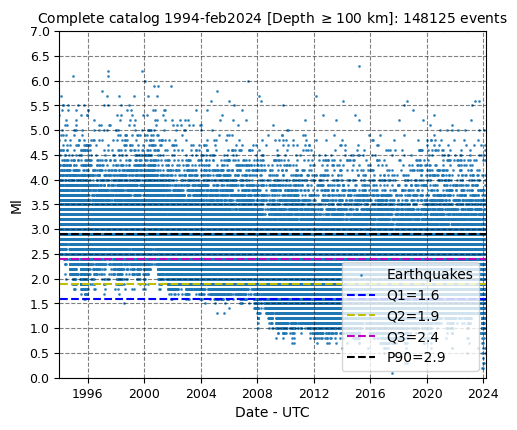

In [ ]:
plt.figure(figsize=(5.5,4.5))

plt.scatter(df_Filtrado_100km['Date-Time'],
            df_Filtrado_100km['MAGNITUD Ml'],
            s=1,
            label='Earthquakes',
            alpha=0.8)

Q1 = df_Filtrado_100km['MAGNITUD Ml'].quantile(0.25)
Q2 = df_Filtrado_100km['MAGNITUD Ml'].quantile(0.5)
Q3 = df_Filtrado_100km['MAGNITUD Ml'].quantile(0.75)
P90 = df_Filtrado_100km['MAGNITUD Ml'].quantile(0.90)

left, right = plt.xlim()

plt.hlines(y= Q1,
           xmin=left,
           xmax=right,
           ls='--',
           color='b',
           label='Q1={}'.format(Q1))

plt.hlines(y= Q2,
           xmin=left,
           xmax=right,
           ls='--',
           color='y',
           label='Q2={}'.format(Q2))

plt.hlines(y= Q3,
           xmin=left,
           xmax=right,
           ls='--',
           color='m',
           label='Q3={}'.format(Q3))

plt.hlines(y= P90,
           xmin=left,
           xmax=right,
           ls='--',
           color='k',
           label='P90={}'.format(P90))


plt.grid(ls='--', color='k', alpha=0.5)
#plt.xlim(left, right)
plt.xlim(np.datetime64('1993-12-31'), np.datetime64('2024-03-01'))
plt.yticks(np.arange(0, 8, 0.5))
plt.ylim(0,7)

plt.xlabel('Date - UTC', fontsize=10)
plt.ylabel('Ml', fontsize=10)
plt.legend(loc='lower right', fontsize=10)
plt.tick_params(labelsize=9)

plt.title('Complete catalog 1994-feb2024 [Depth $\geq 100$ km]: {} events'.format(len(df_Filtrado_100km)), fontsize=10)

plt.savefig((pathSaveFiguras + 'tiempo_1994_2024_100km.png'),
            format='png', dpi=1000, bbox_inches = 'tight', pad_inches=0.25)

plt.show()

# Histogram event 100 km

In [ ]:
df_Filtrado_100km_25ml = df_Filtrado_100km[df_Filtrado_100km['MAGNITUD Ml'] >= 2.5]
df_Filtrado_100km_25ml

,FECHA,HORA_UTC,LATITUD (grados),LONGITUD (grados),PROFUNDIDAD (Km),MAGNITUD Ml,ERROR LATITUD (Km),ERROR LONGITUD (Km),ERROR PROFUNDIDAD (Km),Date-Time
0,1994-01-01,00:06:37,6.839,-72.950,158.60,3.7,15.800,17.200,19.50,1994-01-01 00:06:37
1,1994-01-01,08:17:30,6.877,-72.912,166.60,4.1,14.700,19.900,16.20,1994-01-01 08:17:30
2,1994-01-02,01:55:17,6.806,-72.898,150.00,3.0,12.800,15.800,17.80,1994-01-02 01:55:17
3,1994-01-02,04:49:35,6.898,-73.095,150.00,3.1,8.300,8.700,11.30,1994-01-02 04:49:35
4,1994-01-02,05:55:47,6.736,-73.201,150.00,5.3,17.100,18.000,24.70,1994-01-02 05:55:47
...,...,...,...,...,...,...,...,...,...,...
148967,2024-02-29,07:54:00,6.776,-73.179,144.41,2.5,2.639,3.743,4.77,2024-02-29 07:54:00
148977,2024-02-29,11:57:42,6.778,-73.196,140.90,2.9,2.538,3.365,4.62,2024-02-29 11:57:42
148979,2024-02-29,16:19:24,6.772,-73.138,140.43,2.6,2.438,3.885,4.56,2024-02-29 16:19:24
148984,2024-02-29,22:13:41,6.769,-73.076,146.99,2.9,1.851,3.142,4.15,2024-02-29 22:13:41


In [ ]:
years = np.arange(1994, 2025)
eventsPerYear = []

for year in years:
  df_filtrado = df_Filtrado_100km_25ml[df_Filtrado_100km_25ml['Date-Time'].dt.year == year]
  event45 = (df_filtrado['MAGNITUD Ml'] >= 4.5).sum()
  eventOtros = (df_filtrado['MAGNITUD Ml'] < 4.5).sum()
  listaEvent = [year, event45, eventOtros]
  eventsPerYear.append(listaEvent)

eventsPerYear = np.array(eventsPerYear)
eventsPerYear

array([[1994,   32, 1375],
       [1995,   40, 1299],
       [1996,   20, 1164],
       [1997,   18,  891],
       [1998,   32, 1057],
       [1999,   36, 1310],
       [2000,   51, 1446],
       [2001,   21, 1592],
       [2002,   20, 1656],
       [2003,   14, 1601],
       [2004,   21, 1717],
       [2005,   12, 1303],
       [2006,   19, 1302],
       [2007,    9, 1108],
       [2008,    9,  718],
       [2009,   12,  860],
       [2010,    9,  862],
       [2011,   13,  733],
       [2012,    6,  731],
       [2013,    7,  823],
       [2014,    7,  686],
       [2015,    9,  677],
       [2016,    7,  721],
       [2017,    6,  591],
       [2018,    7,  690],
       [2019,    9,  778],
       [2020,   18,  966],
       [2021,   14,  860],
       [2022,    7,  795],
       [2023,   12,  928],
       [2024,    4,  158]])

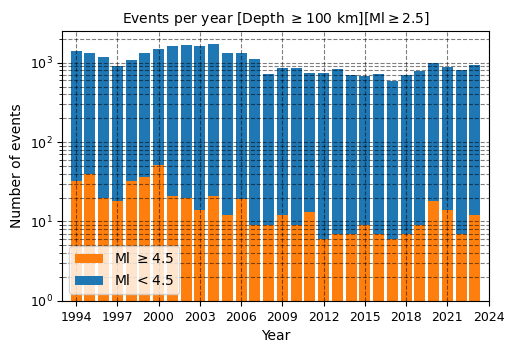

In [ ]:
fig, ax = plt.subplots(figsize=(5.5,3.5))
# Primera categoría
rects1 = ax.bar(x=eventsPerYear[:-1,0],
                height=eventsPerYear[:-1, 1],
                label='Ml $\geq4.5$',
                color='tab:orange')

# Segunda categoría, apilada sobre la primera
rects2 = ax.bar(x=eventsPerYear[:-1,0],
                height=eventsPerYear[:-1, 2],
                bottom=eventsPerYear[:-1, 1],
                label='Ml $<4.5$',
                color='tab:blue')

plt.tick_params(labelsize=9)
plt.xlabel('Year', fontsize=10)
plt.ylabel('Number of events', fontsize=10)
plt.title('Events per year [Depth $\geq 100$ km][Ml$\geq2.5$]', fontsize=10)
plt.yscale('log')
plt.grid(ls='--', color='k', alpha=0.5, which='both')
plt.xticks(np.arange(1994, 2025, 3))
#plt.yticks([10, 50, 100, 500, 1000])
plt.xlim(1993, 2024)
plt.ylim(1, 2500)
plt.legend(loc='lower left', fontsize=10)

plt.savefig((pathSaveFiguras + 'histograma_100km_ml25_v2.png'),
            format='png', dpi=1000, bbox_inches = 'tight', pad_inches=0.25)

plt.show()

# 3D Graphics

## All

In [ ]:
#df_todos
#df_Filtrado_100km
#df_Filtrado_100km_25ml
puntosSismos = gpd.points_from_xy( df_todos['LONGITUD (grados)'],
                                  df_todos['LATITUD (grados)'],
                                  crs='epsg:4326')
puntosSismos

<GeometryArray>
[ <POINT (-72.95 6.839)>, <POINT (-72.912 6.877)>, <POINT (-72.898 6.806)>,
 <POINT (-73.095 6.898)>, <POINT (-73.201 6.736)>, <POINT (-73.016 6.713)>,
 <POINT (-73.039 6.813)>, <POINT (-73.023 6.786)>, <POINT (-73.135 7.053)>,
 <POINT (-73.049 6.783)>,
 ...
 <POINT (-73.159 6.775)>, <POINT (-73.196 6.778)>, <POINT (-73.119 6.817)>,
 <POINT (-73.138 6.772)>, <POINT (-73.111 6.732)>, <POINT (-73.115 6.763)>,
 <POINT (-73.103 6.783)>, <POINT (-73.092 6.809)>, <POINT (-73.076 6.769)>,
 <POINT (-73.124 6.773)>]
Length: 148910, dtype: geometry

<Axes: >

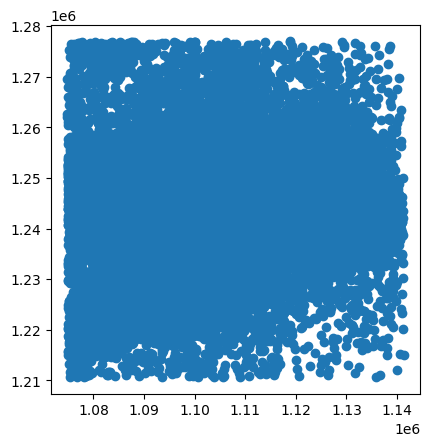

In [ ]:
gdf = gpd.GeoDataFrame(data= df_todos, geometry=puntosSismos)
gdf.to_crs(epsg='3116', inplace=True)
gdf.plot()

In [ ]:
gdf['X_3116_km'] = gdf.get_coordinates()['x'] / 1000
gdf['Y_3116_km'] = gdf.get_coordinates()['y'] / 1000
gdf['Z_km'] = gdf['PROFUNDIDAD (Km)']
gdf.head()

,FECHA,HORA_UTC,LATITUD (grados),LONGITUD (grados),PROFUNDIDAD (Km),MAGNITUD Ml,ERROR LATITUD (Km),ERROR LONGITUD (Km),ERROR PROFUNDIDAD (Km),Date-Time,geometry,X_3116_km,Y_3116_km,Z_km
0,1994-01-01,00:06:37,6.839,-72.950,158.6,3.7,15.8,17.2,19.5,1994-01-01 00:06:37,POINT (1124634.322 1248167.015),1124.634322,1248.167015,158.6
1,1994-01-01,08:17:30,6.877,-72.912,166.6,4.1,14.7,19.9,16.2,1994-01-01 08:17:30,POINT (1128825.175 1252380.301),1128.825175,1252.380301,166.6
2,1994-01-02,01:55:17,6.806,-72.898,150.0,3.0,12.8,15.8,17.8,1994-01-02 01:55:17,POINT (1130392.089 1244530.574),1130.392089,1244.530574,150.0
3,1994-01-02,04:49:35,6.898,-73.095,150.0,3.1,8.3,8.7,11.3,1994-01-02 04:49:35,POINT (1108591.040 1254657.620),1108.591040,1254.657620,150.0
4,1994-01-02,05:55:47,6.736,-73.201,150.0,5.3,17.1,18.0,24.7,1994-01-02 05:55:47,POINT (1096907.050 1236717.171),1096.907050,1236.717171,150.0


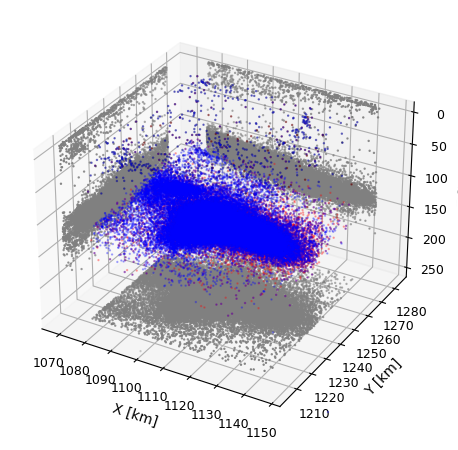

In [ ]:
margen3D = 10
limites_X = np.array([1074.938-margen3D, 1141.140+margen3D])
limites_Y = np.array([1210.580-margen3D, 1277.080+margen3D])
limites_Z = np.array([0-margen3D, 250+margen3D])

dx_dy = 10 # 10 km
dz = 50 # 50 km

filtro_100km = gdf['Z_km'] < 100
filtro_error_mayor_10km = (gdf['ERROR LATITUD (Km)'] > 10) | (gdf['ERROR LONGITUD (Km)'] > 10) | (gdf['ERROR PROFUNDIDAD (Km)'] > 10)
filtro_error_menor_10km = (gdf['ERROR LATITUD (Km)'] <= 10) | (gdf['ERROR LONGITUD (Km)'] <= 10) | (gdf['ERROR PROFUNDIDAD (Km)'] <= 10)


transparencia_Alpha = 0.3

#plot 3d
fig = plt.figure(figsize=(5.5,5.5))
ax = fig.add_subplot(111, projection='3d')

# < a 100 km
ax.scatter(gdf['X_3116_km'][filtro_100km],
           gdf['Y_3116_km'][filtro_100km],
           gdf['Z_km'][filtro_100km],
           s=0.5,
           c='k',
           alpha=transparencia_Alpha)

# errores mayores a 10 km en x y o z
ax.scatter(gdf['X_3116_km'][filtro_error_mayor_10km],
           gdf['Y_3116_km'][filtro_error_mayor_10km],
           gdf['Z_km'][filtro_error_mayor_10km],
           s=0.5,
           c='r',
           alpha=transparencia_Alpha)

# errores menores o iguales a 10 km en x y o z
ax.scatter(gdf['X_3116_km'][filtro_error_menor_10km],
           gdf['Y_3116_km'][filtro_error_menor_10km],
           gdf['Z_km'][filtro_error_menor_10km],
           s=0.5,
           c='b',
           alpha=transparencia_Alpha)

# pyoyeccion en Z
ax.scatter(gdf['X_3116_km'],
           gdf['Y_3116_km'],
           c='grey',
           s=0.5,
           zdir='z',
           zs=limites_Z[1])
# proyeccion en X
ax.scatter(gdf['Y_3116_km'],
           gdf['Z_km'],
           c='grey',
           s=0.5,
           zdir='x',
           zs=limites_X[0])
# proyeccion en Y
ax.scatter(gdf['X_3116_km'],
           gdf['Z_km'],
           c='grey',
           s=0.5,
           zdir='y',
           zs=limites_Y[1])

ax.set_xlabel('X [km]', fontsize=10)
ax.set_ylabel('Y [km]', fontsize=10)
ax.set_zlabel('Z [km]', fontsize=10)


ax.set_xlim(limites_X[0], limites_X[1])
ax.set_ylim(limites_Y[0], limites_Y[1])
ax.set_zlim(limites_Z[1], limites_Z[0])
ax.set_aspect('auto')

plt.tick_params(labelsize=9)
plt.show()

<ipython-input-100-628762d71a95>:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf['colo_XY'][filtro] = filtro.sum()
<ipython-input-100-628762d71a95>:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf['colo_YZ'][filtro] = filtro.sum()
<ipython-input-100-628762d71a95>:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf['colo_XZ'][filtro] = filtro.sum()


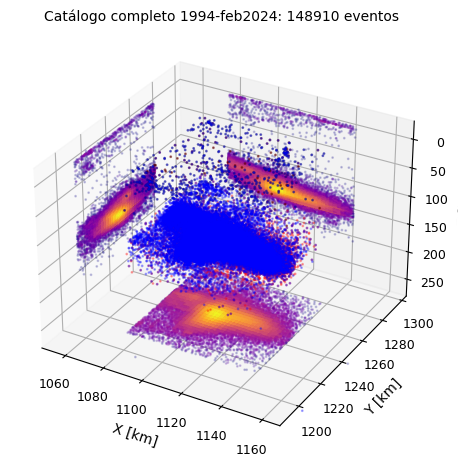

In [ ]:
margen3D = 25
limites_X = np.array([1074.938-margen3D, 1141.140+margen3D])
limites_Y = np.array([1210.580-margen3D, 1277.080+margen3D])
limites_Z = np.array([0-margen3D, 250+margen3D])

dx_dy = 10 # 10 km
dz = 50 # 50 km

filtro_100km = gdf['Z_km'] < 100
filtro_error_mayor_10km = (gdf['ERROR LATITUD (Km)'] > 10) | (gdf['ERROR LONGITUD (Km)'] > 10) | (gdf['ERROR PROFUNDIDAD (Km)'] > 10)
filtro_error_menor_10km = (gdf['ERROR LATITUD (Km)'] <= 10) | (gdf['ERROR LONGITUD (Km)'] <= 10) | (gdf['ERROR PROFUNDIDAD (Km)'] <= 10)


transparencia_Alpha = 0.3

#plot 3d
fig = plt.figure(figsize=(5.5,5.5))
ax = fig.add_subplot(111, projection='3d')

# < a 100 km
ax.scatter(gdf['X_3116_km'][filtro_100km],
           gdf['Y_3116_km'][filtro_100km],
           gdf['Z_km'][filtro_100km],
           s=1,
           c='k',
           alpha=transparencia_Alpha)

# errores mayores a 10 km en x y o z
ax.scatter(gdf['X_3116_km'][filtro_error_mayor_10km],
           gdf['Y_3116_km'][filtro_error_mayor_10km],
           gdf['Z_km'][filtro_error_mayor_10km],
           s=1,
           c='r',
           alpha=transparencia_Alpha)

# errores menores o iguales a 10 km en x y o z
ax.scatter(gdf['X_3116_km'][filtro_error_menor_10km],
           gdf['Y_3116_km'][filtro_error_menor_10km],
           gdf['Z_km'][filtro_error_menor_10km],
           s=1,
           c='b',
           alpha=transparencia_Alpha)


alphyaSombra = 0.2
deltaColor_km = 2
# pyoyeccion en Z
gdf['colo_XY'] = 1
for i in range(int(limites_X[0]), int(limites_X[1])+1, deltaColor_km):
  for j in range(int(limites_Y[0]), int(limites_Y[1])+1, deltaColor_km):
    filtro = (gdf['X_3116_km'] >= i) & (gdf['X_3116_km'] < i+deltaColor_km) & (gdf['Y_3116_km'] >= j) & (gdf['Y_3116_km'] < j+deltaColor_km)
    if filtro.sum() > 0:
      gdf['colo_XY'][filtro] = filtro.sum()

ax.scatter(gdf['X_3116_km'],
           gdf['Y_3116_km'],
           c=gdf['colo_XY'],
           s=1,
           zdir='z',
           zs=limites_Z[1],
           cmap='plasma',
           norm=colors.LogNorm(vmin=gdf['colo_XY'].min(), vmax=gdf['colo_XY'].max()),
           alpha=alphyaSombra)

# proyeccion en X
gdf['colo_YZ'] = 1
for i in range(int(limites_Y[0]), int(limites_Y[1])+1, deltaColor_km):
  for j in range(int(limites_Z[0]), int(limites_Z[1])+1, deltaColor_km):
    filtro = (gdf['Y_3116_km'] >= i) & (gdf['Y_3116_km'] < i+deltaColor_km) & (gdf['Z_km'] >= j) & (gdf['Z_km'] < j+deltaColor_km)
    if filtro.sum() > 0:
      gdf['colo_YZ'][filtro] = filtro.sum()
ax.scatter(gdf['Y_3116_km'],
           gdf['Z_km'],
           c=gdf['colo_YZ'],
           s=1,
           zdir='x',
           zs=limites_X[0],
           cmap='plasma',
           norm=colors.LogNorm(vmin=gdf['colo_YZ'].min(), vmax=gdf['colo_YZ'].max()),
           alpha=alphyaSombra)

# proyeccion en Y
gdf['colo_XZ'] = 1
for i in range(int(limites_X[0]), int(limites_X[1])+1, deltaColor_km):
  for j in range(int(limites_Z[0]), int(limites_Z[1])+1, deltaColor_km):
    filtro = (gdf['X_3116_km'] >= i) & (gdf['X_3116_km'] < i+deltaColor_km) & (gdf['Z_km'] >= j) & (gdf['Z_km'] < j+deltaColor_km)
    if filtro.sum() > 0:
      gdf['colo_XZ'][filtro] = filtro.sum()
ax.scatter(gdf['X_3116_km'],
           gdf['Z_km'],
           c=gdf['colo_XZ'],
           s=1,
           zdir='y',
           zs=limites_Y[1],
           cmap='plasma',
           norm=colors.LogNorm(vmin=gdf['colo_XZ'].min(), vmax=gdf['colo_XZ'].max()),
           alpha=alphyaSombra)

ax.set_xlabel('X [km]', fontsize=10)
ax.set_ylabel('Y [km]', fontsize=10)
ax.set_zlabel('Z [km]', fontsize=10)


ax.set_xlim(limites_X[0], limites_X[1])
ax.set_ylim(limites_Y[0], limites_Y[1])
ax.set_zlim(limites_Z[1], limites_Z[0])
ax.set_aspect('auto')

nE = len(gdf)
ax.set_title(f'Catálogo completo 1994-feb2024: {nE} eventos', fontsize=10)
plt.tick_params(labelsize=9)
plt.savefig((pathSaveFiguras + f'3d_todos.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)

plt.show()

In [ ]:
def plot_3d(gdf, year, ax):
  gdf = gdf[gdf['Date-Time'].dt.year == year]
  margen3D = 25
  limites_X = np.array([1074.938-margen3D, 1141.140+margen3D])
  limites_Y = np.array([1210.580-margen3D, 1277.080+margen3D])
  limites_Z = np.array([0-margen3D, 250+margen3D])

  dx_dy = 10 # 10 km
  dz = 50 # 50 km

  filtro_100km = gdf['Z_km'] < 100
  filtro_error_mayor_10km = (gdf['ERROR LATITUD (Km)'] > 10) | (gdf['ERROR LONGITUD (Km)'] > 10) | (gdf['ERROR PROFUNDIDAD (Km)'] > 10)
  filtro_error_menor_10km = (gdf['ERROR LATITUD (Km)'] <= 10) | (gdf['ERROR LONGITUD (Km)'] <= 10) | (gdf['ERROR PROFUNDIDAD (Km)'] <= 10)


  transparencia_Alpha = 0.3

  #plot 3d
  #fig = plt.figure(figsize=(5.5,5.5))
  #ax = fig.add_subplot(111, projection='3d')

  # < a 100 km
  ax.scatter(gdf['X_3116_km'][filtro_100km],
            gdf['Y_3116_km'][filtro_100km],
            gdf['Z_km'][filtro_100km],
            s=1,
            c='k',
            alpha=transparencia_Alpha)

  # errores mayores a 10 km en x y o z
  ax.scatter(gdf['X_3116_km'][filtro_error_mayor_10km],
            gdf['Y_3116_km'][filtro_error_mayor_10km],
            gdf['Z_km'][filtro_error_mayor_10km],
            s=1,
            c='r',
            alpha=transparencia_Alpha)

  # errores menores o iguales a 10 km en x y o z
  ax.scatter(gdf['X_3116_km'][filtro_error_menor_10km],
            gdf['Y_3116_km'][filtro_error_menor_10km],
            gdf['Z_km'][filtro_error_menor_10km],
            s=1,
            c='b',
            alpha=transparencia_Alpha)


  alphyaSombra = 0.2
  deltaColor_km = 2
  # pyoyeccion en Z
  gdf['colo_XY'] = 1
  for i in range(int(limites_X[0]), int(limites_X[1])+1, deltaColor_km):
    for j in range(int(limites_Y[0]), int(limites_Y[1])+1, deltaColor_km):
      filtro = (gdf['X_3116_km'] >= i) & (gdf['X_3116_km'] < i+deltaColor_km) & (gdf['Y_3116_km'] >= j) & (gdf['Y_3116_km'] < j+deltaColor_km)
      if filtro.sum() > 0:
        gdf['colo_XY'][filtro] = filtro.sum()

  ax.scatter(gdf['X_3116_km'],
            gdf['Y_3116_km'],
            c=gdf['colo_XY'],
            s=1,
            zdir='z',
            zs=limites_Z[1],
            cmap='plasma',
            norm=colors.LogNorm(vmin=gdf['colo_XY'].min(), vmax=gdf['colo_XY'].max()),
            alpha=alphyaSombra)

  # proyeccion en X
  gdf['colo_YZ'] = 1
  for i in range(int(limites_Y[0]), int(limites_Y[1])+1, deltaColor_km):
    for j in range(int(limites_Z[0]), int(limites_Z[1])+1, deltaColor_km):
      filtro = (gdf['Y_3116_km'] >= i) & (gdf['Y_3116_km'] < i+deltaColor_km) & (gdf['Z_km'] >= j) & (gdf['Z_km'] < j+deltaColor_km)
      if filtro.sum() > 0:
        gdf['colo_YZ'][filtro] = filtro.sum()
  ax.scatter(gdf['Y_3116_km'],
            gdf['Z_km'],
            c=gdf['colo_YZ'],
            s=1,
            zdir='x',
            zs=limites_X[0],
            cmap='plasma',
            norm=colors.LogNorm(vmin=gdf['colo_YZ'].min(), vmax=gdf['colo_YZ'].max()),
            alpha=alphyaSombra)

  # proyeccion en Y
  gdf['colo_XZ'] = 1
  for i in range(int(limites_X[0]), int(limites_X[1])+1, deltaColor_km):
    for j in range(int(limites_Z[0]), int(limites_Z[1])+1, deltaColor_km):
      filtro = (gdf['X_3116_km'] >= i) & (gdf['X_3116_km'] < i+deltaColor_km) & (gdf['Z_km'] >= j) & (gdf['Z_km'] < j+deltaColor_km)
      if filtro.sum() > 0:
        gdf['colo_XZ'][filtro] = filtro.sum()
  ax.scatter(gdf['X_3116_km'],
            gdf['Z_km'],
            c=gdf['colo_XZ'],
            s=1,
            zdir='y',
            zs=limites_Y[1],
            cmap='plasma',
            norm=colors.LogNorm(vmin=gdf['colo_XZ'].min(), vmax=gdf['colo_XZ'].max()),
            alpha=alphyaSombra)

  #ax.set_xlabel('X [km]', fontsize=10)
  #ax.set_ylabel('Y [km]', fontsize=10)
  #ax.set_zlabel('Z [km]', fontsize=10)


  ax.set_xlim(limites_X[0], limites_X[1])
  ax.set_ylim(limites_Y[0], limites_Y[1])
  ax.set_zlim(limites_Z[1], limites_Z[0])
  ax.set_aspect('auto')

  ax.set_xticks(np.array([1060, 1080, 1100, 1120, 1140, 1160]))
  ax.set_yticks(np.array([1200, 1220, 1240, 1260, 1280, 1300]))
  ax.set_zticks(np.array([0, 50, 100, 150, 200, 250]))

  # Quitar las etiquetas de las marcas de los ejes
  ax.set_xticklabels([])
  ax.set_yticklabels([])
  ax.set_zticklabels([])

  plt.tick_params(labelsize=9)


## 1994-1998-2002-2006

In [ ]:
gdf25 = gdf[gdf['MAGNITUD Ml'] >= 2.5]

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
<ipython-input-90-fdac77d4feed>:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf['colo_XY'][filtro] = filtro.sum()
<ipython-input-90-fdac77d4feed>:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf['colo_YZ'][filtro] = filtr

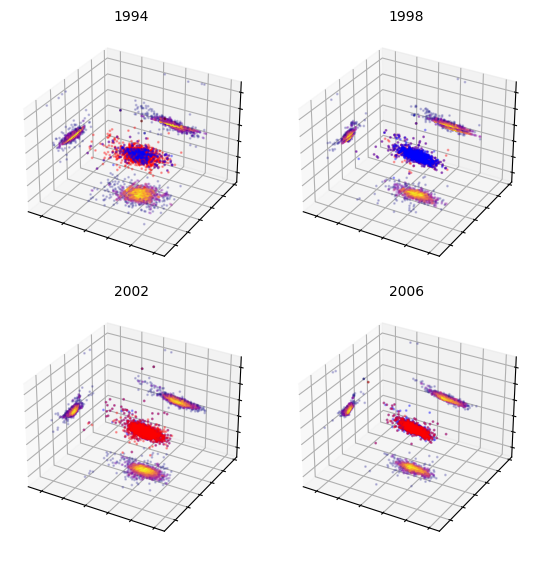

In [ ]:
fig = plt.figure(figsize=(5.5,5.5), constrained_layout=True)

ax1 = fig.add_subplot(221, projection='3d')
ax2 = fig.add_subplot(222, projection='3d')
ax3 = fig.add_subplot(223, projection='3d')
ax4 = fig.add_subplot(224, projection='3d')

plot_3d(gdf25, 1994, ax1)
plot_3d(gdf25, 1998, ax2)
plot_3d(gdf25, 2002, ax3)
plot_3d(gdf25, 2006, ax4)


ax1.set_title('1994', fontsize=10)
ax2.set_title('1998', fontsize=10)
ax3.set_title('2002', fontsize=10)
ax4.set_title('2006', fontsize=10)

plt.savefig((pathSaveFiguras + f'3D_years_A.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)

plt.show()

## 2010-2014-2018-2023

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
<ipython-input-90-fdac77d4feed>:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf['colo_XY'][filtro] = filtro.sum()
<ipython-input-90-fdac77d4feed>:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf['colo_YZ'][filtro] = filtr

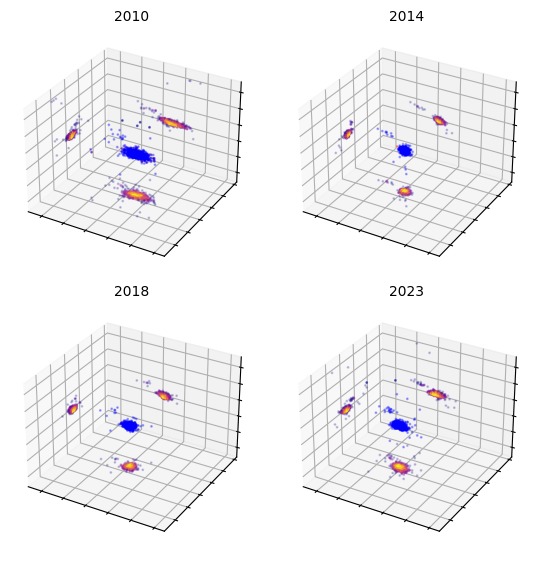

In [ ]:
fig = plt.figure(figsize=(5.5,5.5), constrained_layout=True)

ax1 = fig.add_subplot(221, projection='3d')
ax2 = fig.add_subplot(222, projection='3d')
ax3 = fig.add_subplot(223, projection='3d')
ax4 = fig.add_subplot(224, projection='3d')

plot_3d(gdf25, 2010, ax1)
plot_3d(gdf25, 2014, ax2)
plot_3d(gdf25, 2018, ax3)
plot_3d(gdf25, 2023, ax4)


ax1.set_title('2010', fontsize=10)
ax2.set_title('2014', fontsize=10)
ax3.set_title('2018', fontsize=10)
ax4.set_title('2023', fontsize=10)

plt.savefig((pathSaveFiguras + f'3D_years_B.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)

plt.show()

# Graphic Prediction

In [ ]:
ordenModelos = ['/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997.joblib',
                '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v4/2009_30dias_hl_420_5_int0_scr0.998.joblib',
                '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v4/2009_30dias_hl_2000_5_int1_scr1.0.joblib',
                '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v4/2009_6meses_hl_210_5_int0_scr1.0.joblib',
                '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_30dias_boots_hl_1500_5_int0_scr1.0.joblib',
                '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_30dias_boots_hl_420_5_int0_scr1.0.joblib',
                '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v4/2009_30dias_hl_1500_5_int0_scr1.0.joblib',
                '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996.joblib',
                '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_30dias_boots_hl_2000_5_int0_scr0.999.joblib',
                '/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0.joblib']
labelModel = ['Mod 7',
              'Mod 15',
              'Mod 32',
              'Mod 41',
              'Mod 26',
              'Mod 13',
              'Mod 47',
              'Mod 12',
              'Mod 25',
              'Mod 24']


In [ ]:
df_Dias = pd.read_csv(pathDatos+'df_Dias_v3_ml15_2009.csv')
df_Dias['Fecha'] = pd.to_datetime(df_Dias['Dia'], yearfirst=True)
filtro2009 = (df_Dias['Fecha'].dt.year >= 2009).to_numpy()
df_Dias = df_Dias[filtro2009]
df_Dias.reset_index(inplace=True, drop=True)
df_Dias

,Dia,1.5-2.0,2.0-2.5,2.5-3.0,3.0-3.5,3.5-4.0,4.0-4.5,4.5-5.0,5.0-5.5,5.5-,Total dia,Fecha
0,2009-01-01,5,0,1,0,0,0,0,0,0,6,2009-01-01
1,2009-01-02,4,0,2,1,0,0,0,0,0,7,2009-01-02
2,2009-01-03,5,1,0,1,0,0,0,0,0,7,2009-01-03
3,2009-01-04,7,1,2,0,0,0,0,0,0,10,2009-01-04
4,2009-01-05,5,2,0,0,0,0,0,0,0,7,2009-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...
5533,2024-02-25,44,5,1,0,0,0,0,0,0,50,2024-02-25
5534,2024-02-26,31,7,6,1,0,0,0,0,0,45,2024-02-26
5535,2024-02-27,37,5,2,0,0,0,0,0,0,44,2024-02-27
5536,2024-02-28,35,7,4,0,0,0,0,0,0,46,2024-02-28


/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_30dias_boots_hl_420_210_105_53_27_5_int0_scr0.997.joblib


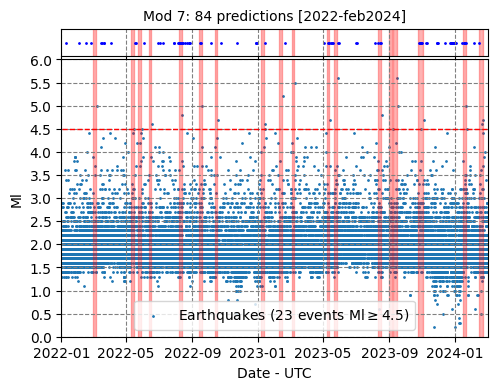



/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v4/2009_30dias_hl_420_5_int0_scr0.998.joblib


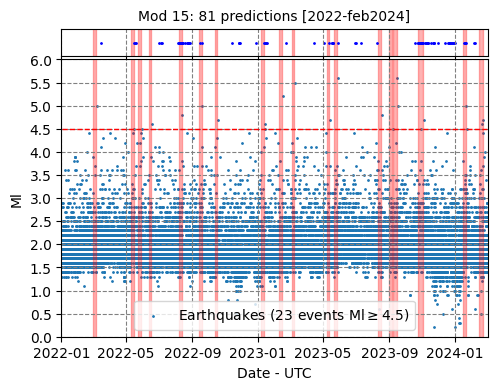



/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v4/2009_30dias_hl_2000_5_int1_scr1.0.joblib


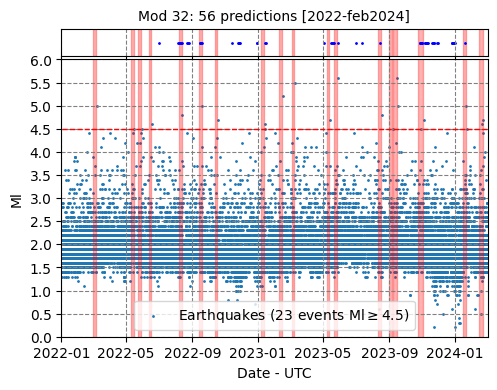



/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v4/2009_6meses_hl_210_5_int0_scr1.0.joblib


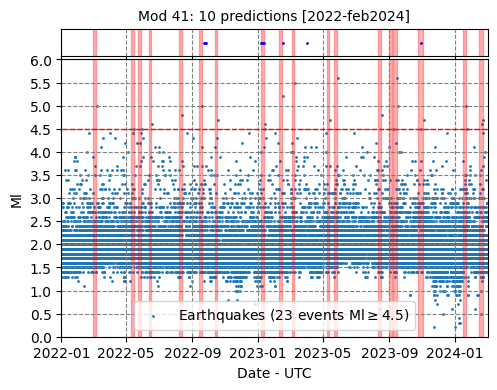



/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_30dias_boots_hl_1500_5_int0_scr1.0.joblib


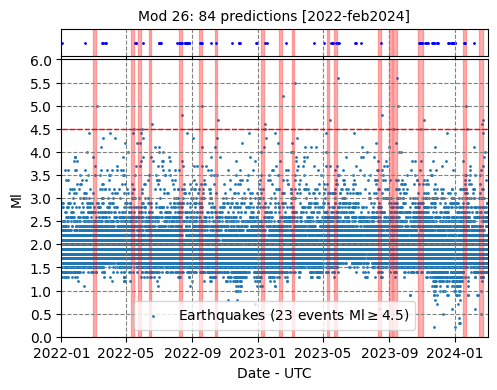



/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_30dias_boots_hl_420_5_int0_scr1.0.joblib


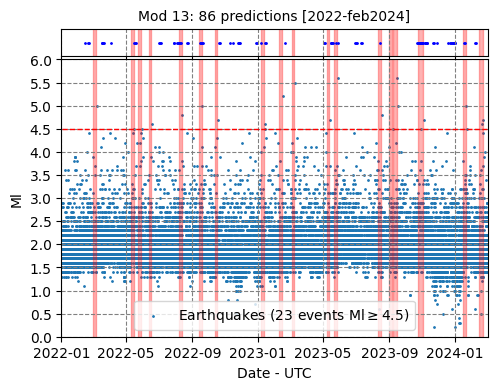



/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v4/2009_30dias_hl_1500_5_int0_scr1.0.joblib


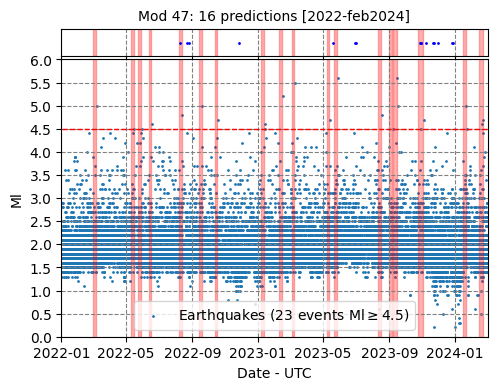



/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_6meses_hl_1500_750_375_188_94_5_int0_scr0.996.joblib


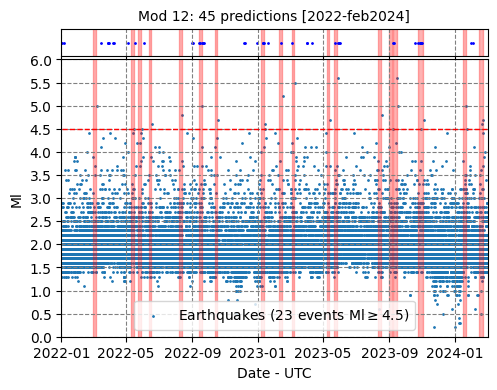



/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_30dias_boots_hl_2000_5_int0_scr0.999.joblib


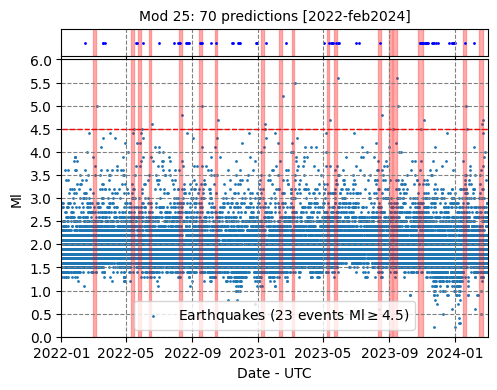



/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/ModelosMLP_Class_v6/2009_6meses_hl_210_105_53_27_13_5_int0_scr1.0.joblib


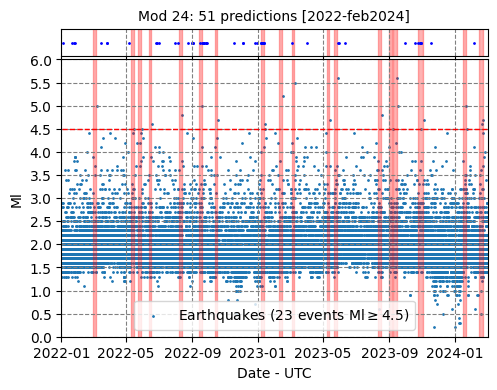

In [ ]:
for modelo, labelModelo in zip(ordenModelos, labelModel):
  if 'joblib' in modelo:
    if '6meses' in modelo:
      X2023 = np.loadtxt(pathDatos+'2009_6meses_X2022.txt')
      y2023 = np.loadtxt(pathDatos+'2009_6meses_y2022.txt')
      X2022 = np.loadtxt(pathDatos+'2009_6meses_X2021.txt')
      y2022 = np.loadtxt(pathDatos+'2009_6meses_y2021.txt')

    if '12meses' in modelo:
      X2023 = np.loadtxt(pathDatos+'2009_12meses_X2022.txt')
      y2023 = np.loadtxt(pathDatos+'2009_12meses_y2022.txt')
      X2022 = np.loadtxt(pathDatos+'2009_12meses_X2021.txt')
      y2022 = np.loadtxt(pathDatos+'2009_12meses_y2021.txt')

    if '30dias' in modelo:
      X2023 = np.loadtxt(pathDatos+'2009_30dias_X2022.txt')
      y2023 = np.loadtxt(pathDatos+'2009_30dias_y2022.txt')
      X2022 = np.loadtxt(pathDatos+'2009_30dias_X2021.txt')
      y2022 = np.loadtxt(pathDatos+'2009_30dias_y2021.txt')
    print(modelo)
    modelo_P = load(modelo)
    # 2023
    predichosModelo = modelo_P.predict(X2023)
    predProb_Modelo = modelo_P.predict_proba(X2023)[:,1]
    # 1994-2023
    #predichosModelo_2022 = modelo_P.predict(X2022)
    predProb_Modelo_2022 = modelo_P.predict_proba(X2022)[:,1]

    nMin = dias_Considerar - 1
    filtro2022 = (df_Dias['Fecha'].iloc[dias_Considerar-1:-6].dt.year < 2022).to_numpy()
    filtro2023 = (df_Dias['Fecha'].iloc[dias_Considerar-1:-6].dt.year >= 2022).to_numpy()

    fechas2023 = np.arange('2022-01-01', '2024-03-01', dtype='datetime64[D]')
    fechas2023 = fechas2023[:-6]
    # Sacar las fechas inicio fin de los rectangulos
    fechaInicio = []
    fechaFin = []

    for i in range(0, len(y2023)-1):
      if (y2023[i] == 0) & (y2023[i+1] == 1):
        fechaInicio.append(fechas2023[i+1])
      if (y2023[i] == 1) & (y2023[i+1] == 0):
        fechaFin.append(fechas2023[i])
    fechaInicio = np.array(fechaInicio).reshape(-1,1)
    fechaFin = np.array(fechaFin).reshape(-1,1)
    fechasRectangulo = np.concatenate((fechaInicio, fechaFin), axis=1)

    # Figuras 2023
    fig, ax = plt.subplots(2,1, figsize=(5.5,4), sharex=True, gridspec_kw={'height_ratios': [1, 10]})

    # Probabilidad
    # Rectangulos
    for rec in range(0, fechasRectangulo.shape[0]):
      deltaDias = fechasRectangulo[rec,1] - fechasRectangulo[rec,0]
      Xrec = fechasRectangulo[rec,0]
      Yrec = -1
      ax[0].add_patch(Rectangle(xy=(Xrec, Yrec),
                              width=(fechasRectangulo[rec,1] - fechasRectangulo[rec,0]),
                              height=10,
                              fill=True,
                              color ='red',
                              alpha=0.3)
                              )
    predSis = ax[0].scatter(df_Dias['Fecha'].iloc[nMin:-6][filtro2023][predichosModelo >= 1],
                predichosModelo[predichosModelo >= 1]*7,
                s= 1,
                c='b',
                label=f'Predicted: {int(sum(predichosModelo))}')
    #ax[0].legend(loc=1, fontsize=10)

    ax[0].set_ylim(6.5, 7.5)
    #ax[0].set_ylabel('Probabilidad [%]', fontsize=10)
    ax[0].set_yticks([])
    #ax[0].set_xlabel('Fecha - UTC')
    ax[0].grid(ls='--', color='grey')
    ax[0].set_title(f'{labelModelo}: {int(sum(predichosModelo))} predictions [2022-feb2024]', fontsize=10)

    # Eventos logrados
    event4_5 = df['MAGNITUD Ml'][(df['Date-Time'].dt.year >= 2022).to_numpy()]
    event4_5 = event4_5 >= 4.5
    event4_5 = sum(event4_5)



    ax[1].scatter(df['Date-Time'][(df['Date-Time'].dt.year >= 2022).to_numpy()],
                  df['MAGNITUD Ml'][(df['Date-Time'].dt.year >= 2022).to_numpy()],
                  s=1,
                  label=f'Earthquakes ({event4_5} events Ml$\geq$4.5)',
                  c='tab:blue',
                  alpha=1)

    # Rectangulos
    for rec in range(0, fechasRectangulo.shape[0]):
      deltaDias = fechasRectangulo[rec,1] - fechasRectangulo[rec,0]
      Xrec = fechasRectangulo[rec,0]
      Yrec = -1
      ax[1].add_patch(Rectangle(xy=(Xrec, Yrec),
                              width=(fechasRectangulo[rec,1] - fechasRectangulo[rec,0]),
                              height=8,
                              fill=True,
                              color ='red',
                              alpha=0.3)
                              )

    left, right = plt.xlim()
    ax[1].hlines(y= 4.5,
                xmin=left,
                xmax=right,
                ls='--',
                lw=1,
                color='r',)
    #label='Q1={}'.format(Q1))

    ax[1].set_ylim(-0.5, 7.5)
    ax[1].set_ylabel('Ml', fontsize=10)
    ax[1].set_xlabel('Date - UTC', fontsize=10)
    ax[1].grid(ls='--', color='grey')
    ax[1].set_yticks(np.arange(0, 8, 0.5))
    ax[1].set_ylim(0,6)
    ax[1].legend(loc=8, fontsize=10)

    plt.subplots_adjust(hspace=0.02)
    plt.xticks(np.arange(np.datetime64("2022-01-01"), np.datetime64("2024-03-01"),  np.timedelta64(4, 'M'), dtype='datetime64[M]'),
               labels=np.arange(np.datetime64("2022-01-01"), np.datetime64("2024-03-01"),  np.timedelta64(4, 'M'), dtype='datetime64[M]'))

    plt.xlim(np.datetime64('2022-01-01'), np.datetime64('2024-03-01'))
    plt.tick_params(labelsize=10)

    #plt.tight_layout()
    plt.savefig((pathSaveFiguras + f'2022_{labelModelo}.png'),
                format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)

    plt.show()

    print('\n')

In [ ]:
pathSaveFiguras

'/content/drive/MyDrive/Manuscritos_Investigacion/ML_SismosNidoBucaramanga/Figuras_MatrizConfusion/'

In [ ]:
np.arange(np.datetime64("2022-01-01"), np.datetime64("2024-03-01"),  np.timedelta64(3, 'M'), dtype='datetime64[M]')

array(['2022-01', '2022-04', '2022-07', '2022-10', '2023-01', '2023-04',
       '2023-07', '2023-10', '2024-01'], dtype='datetime64[M]')

# Fin